# Statistics for Michel electron candidate

### Created by Shu, 202508---

</br>
minus5GeV:    'run20250627'

minus1GeV:      'run20250614'

pos1GeV:        'run20250613'

pos5GeV:        'run20250623'

& Private Production

<br />
<br />
<br />

## WVF Coincidence Explore:

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

import os

# ------------------------------------------------------------
# 1️⃣ Define data groups
# ------------------------------------------------------------
data_groups = [
    {
        "data_dir": "./statResult_pds",
        "dates": [
            "20250627", "20250614", "20250613", 
            "20250623"
        ]
    },
    {
        "data_dir": "../MC_new20251010_70s/statResult_pds",
        "dates": ["20251010", "20251011", "20251012", "20251013", "20251014", "20251015",
                  "20251016", "20251017", "20251018", "20251019", "20251020", "20251021",
                  "20251022", "20251023", "20251024", "20251025", "20251026", "20251027",
                  "20251028", "20251029", "20251030", "20251031", "20251032",
                  "20251042", "20251043", "20251044", "20251045",
                  "20251070", "20251071", "20251072", "20251073", "20251074", "20251075", 
                  "20251076", "20251077", "20251078", "20251079", "20251080"
                  ]
    }
]

coinNum = []
coinTrueE = []
coinPDG = []
coinMS = []
coinMH = []

# ------------------------------------------------------------
# 2️⃣ Read all groups — waveform coincidence counts
# ------------------------------------------------------------
print("\n=== Reading waveform coincidence counts ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_count_{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                line = line.strip()
                if not line:
                    continue

                parts = line.split(":")
                if len(parts) >= 2:
                    try:
                        coinNum.append(int(parts[1].strip()))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not parse '{parts[1].strip()}' in {fname}")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")


# ------------------------------------------------------------
# 3️⃣ Read all groups — candidate energies
# ------------------------------------------------------------
print("\n=== Reading candidate energies ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_trueE{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinTrueE.append(float(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to float.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")


# ------------------------------------------------------------
# 4️⃣ Read all groups — PDG codes
# ------------------------------------------------------------
print("\n=== Reading PDG codes ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_truePDG{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinPDG.append(int(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to int.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")




# ------------------------------------------------------------
# 5  Read all groups — candidate MS
# ------------------------------------------------------------
print("\n=== Reading candidate MS ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_trueMS{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinMS.append(float(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to float.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")


# ------------------------------------------------------------
# 6  Read all groups — PDG codes
# ------------------------------------------------------------
print("\n=== Reading  MH ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_trueMH{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinMH.append(int(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to int.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")




# ------------------------------------------------------------
# ✅ Summary
# ------------------------------------------------------------


print("Event candidates (TPC cut)  : xxx")
print("Track candidates with NO wvf: xxx")
print("Number of track candidates  :", len(coinNum))

#coinNum.extend([0] * 5642)


print("\nLength of track coinTrueE: ", len(coinTrueE))
print("Length of track coinPDG  : ", len(coinPDG))
print("Length of track coinMS   : ", len(coinMS))
print("Length of track coinMH   : ", len(coinMH))



# ========================================================================
# Apply cut: Make sure MS > 0.3 & MH > 3
coinNum_msh3 = []
coinTrueE_msh3 = []
coinPDG_msh3 = []
coinMS_msh3 =[]

for i in range(0, len(coinNum)):
    num = coinNum[i]
    e = coinTrueE[i]
    pdg = coinPDG[i]
    ms = coinMS[i]
    mh = coinMH[i]

    if ms > 0.3 and mh > 3:
        coinNum_msh3.append(num)
        coinTrueE_msh3.append(e)
        coinPDG_msh3.append(pdg)

print("\n\nAfter requesting MS > 0.3 & MH >3: ")
#print("\n\nAfter requesting MS > 0.2 & MH >2: ")
print("Number of track candidates:", len(coinNum_msh3))
print("Length of track coinTrueE : ", len(coinTrueE_msh3))
print("Length of track coinPDG   : ", len(coinPDG_msh3))



=== Reading waveform coincidence counts ===

[GROUP] ./statResult_pds
  - Loaded 31204 entries from 20250627 → print_count_20250627.txt
  - Loaded 34389 entries from 20250614 → print_count_20250614.txt
  - Loaded 31765 entries from 20250613 → print_count_20250613.txt
  - Loaded 30456 entries from 20250623 → print_count_20250623.txt

[GROUP] ../MC_new20251010_70s/statResult_pds
  - Loaded  3644 entries from 20251010 → print_count_20251010.txt
  - Loaded  3621 entries from 20251011 → print_count_20251011.txt
  - Loaded  3360 entries from 20251012 → print_count_20251012.txt
  - Loaded  3540 entries from 20251013 → print_count_20251013.txt
  - Loaded  3523 entries from 20251014 → print_count_20251014.txt
  - Loaded  3348 entries from 20251015 → print_count_20251015.txt
  - Loaded  3357 entries from 20251016 → print_count_20251016.txt
  - Loaded  3503 entries from 20251017 → print_count_20251017.txt
  - Loaded  3703 entries from 20251018 → print_count_20251018.txt
  - Loaded  3581 entries 

Purity of coinNum:  234107 / 284529 (82.28%)
Michel e:  41963 / 234107 (17.92%)
Michel p:  192144 / 234107 (82.08%)

Candidates with #opWvf>=3:  256595 / 284529 (90.18%)
Purity:  209842 / 256595 (81.78%)

Values here are based on MS>0.3 & MH>3...
max(coinNum) = 9
Number of coinNum == 10: 0
Unique counts: [1, 2, 3, 4, 5, 6, 7, 8, 9]


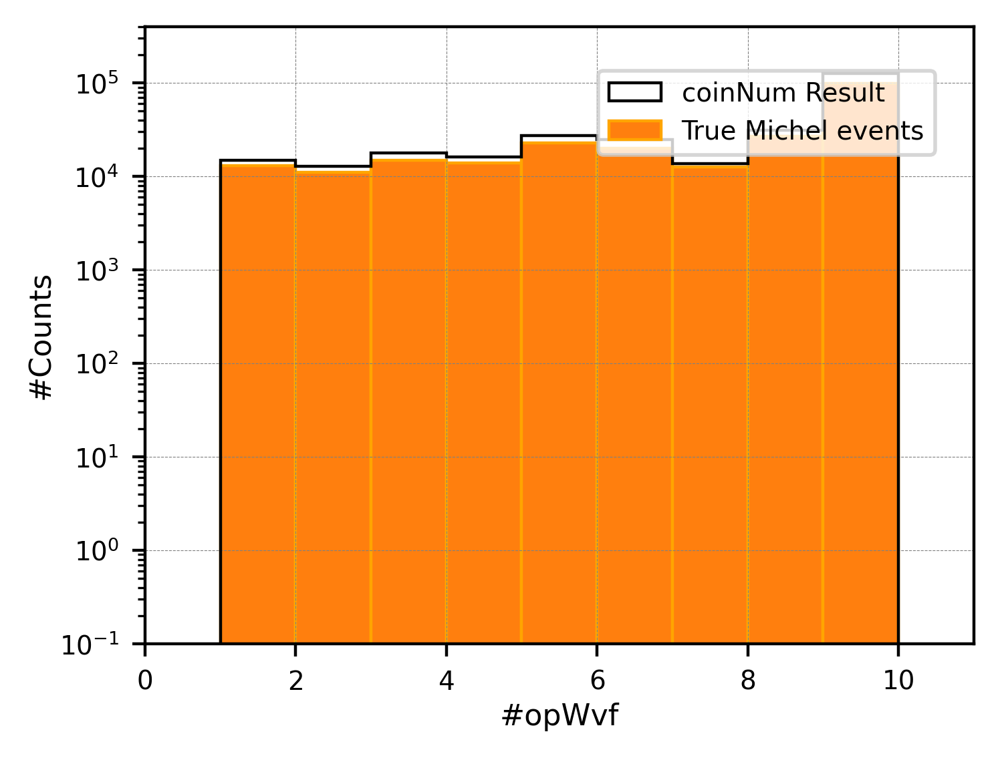

<Figure size 1600x1200 with 0 Axes>

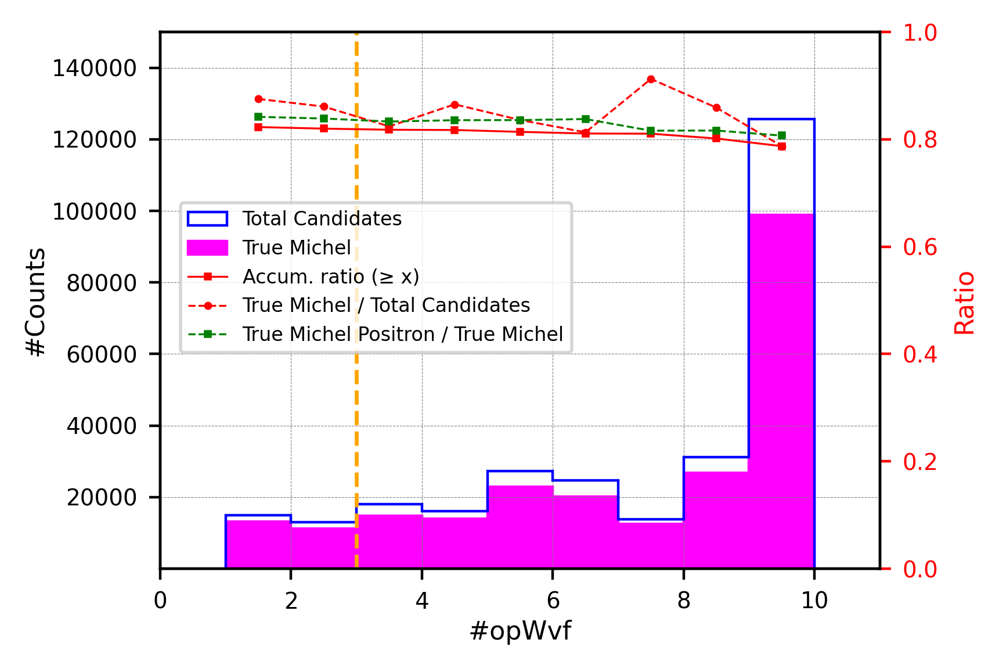

In [4]:

#Extract coinNum with trueE:===========================
coinNum_trueE = []
coinNum_trueE_e = [] #Michel electron
coinNum_trueE_p = [] #Michel positron
for i in range(0, len(coinTrueE_msh3)):
    count = coinNum_msh3[i]
    e = coinTrueE_msh3[i]
    pdg = coinPDG_msh3[i]

    if e > 0:
        coinNum_trueE.append(count)
        if pdg == 11:
            coinNum_trueE_e.append(count)
        if pdg == -11:
            coinNum_trueE_p.append(count)

print("Purity of coinNum: ", len(coinNum_trueE), "/", len(coinNum_msh3), "({:.2f}%)".format(len(coinNum_trueE)/len(coinNum_msh3)*100))
print("Michel e: ", len(coinNum_trueE_e), "/", len(coinNum_trueE), "({:.2f}%)".format(len(coinNum_trueE_e)/len(coinNum_trueE)*100))
print("Michel p: ", len(coinNum_trueE_p), "/", len(coinNum_trueE), "({:.2f}%)".format(len(coinNum_trueE_p)/len(coinNum_trueE)*100))



#Apply preliminary cut #opWvf >=3:=====================
coinNum_cut5 = []
coinNum_trueE_cut5 = []
for i in range(0, len(coinNum_msh3)):
    coin = coinNum_msh3[i]
    trueE = coinTrueE_msh3[i]

    if coin >=3:
        coinNum_cut5.append(coin)
    
        if trueE > 0:
            coinNum_trueE_cut5.append(trueE)

print("\nCandidates with #opWvf>=3: ", len(coinNum_cut5), "/", len(coinNum_msh3), "({:.2f}%)".format(len(coinNum_cut5)/len(coinNum_msh3)*100))
print("Purity: ", len(coinNum_trueE_cut5), "/", len(coinNum_cut5), "({:.2f}%)".format(len(coinNum_trueE_cut5)/len(coinNum_cut5)*100))

print("\nValues here are based on MS>0.3 & MH>3...")



print("max(coinNum) =", max(coinNum_msh3))
print("Number of coinNum == 10:", sum(1 for x in coinNum_msh3 if x == 10))
print("Unique counts:", sorted(set(coinNum_msh3)))



# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 1
range_min = 0
range_max = 11
bins = np.arange(range_min, range_max + bin_width, bin_width)

#plt.plot([5, 5], [0, 1200], color="black", linewidth=1.5, linestyle='--')

plt.hist(coinNum_msh3, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label='coinNum Result')
plt.hist(coinNum_trueE, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='bar', linewidth=0.8, label="True Michel events")



plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.xlim(0, 11)
#plt.ylim(0, 50)
plt.xlabel('#opWvf', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 400000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show() 








#Michel score distribution (Original)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

# Define the range and bin width
bin_width = 1
range_min = 1
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Compute histograms
hist_total, _ = np.histogram(coinNum_msh3, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(coinNum_trueE, bins=bins, range=(range_min, range_max))
hist_trueP, _ = np.histogram(coinNum_trueE_p, bins=bins, range=(range_min, range_max))#True positron

# Compute bin centers (midpoints of bins)
bin_centers = bins[:-1] + bin_width / 2

fig, ax1 = plt.subplots(figsize=(4,3), dpi=400)

# Primary y-axis (Counts)
ax1.hist(bin_centers, bins=bins, weights=hist_total, edgecolor='blue', histtype='step', linewidth=0.8, label="Total Candidates")
ax1.hist(bin_centers, bins=bins, weights=hist_true, edgecolor='magenta', color='magenta', histtype='bar', 
         linewidth=0.8, label="True Michel")
#ax1.hist(bin_centers, bins=bins, weights=hist_trueP, edgecolor='green', color='green', histtype='bar', 
#         linewidth=0.8, label="True Michel Positron")


ax1.plot([3, 3], [0, 10000000], color="orange", linewidth=1.2, linestyle='--')


ax1.set_xlim(0, 11)
ax1.set_xlabel('#opWvf', labelpad=2, fontsize=8)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=8)
ax1.set_ylim(0.1, 150000)
#ax1.set_yscale('log')
ax1.tick_params(labelsize=7)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})

# Secondary y-axis (Ratio)
ax2 = ax1.twinx()
ratio = np.divide(hist_true, hist_total, out=np.zeros_like(hist_true, dtype=float), where=hist_total!=0)  # Avoid division by zero

ratio2 = np.divide(hist_trueP, hist_true, out=np.zeros_like(hist_trueP, dtype=float), where=hist_total!=0)  # Avoid division by zero

# --- Accumulated (>= x) ratio ---
# Cumulative sums from the right (>= x)
cum_total = np.cumsum(hist_total[::-1])[::-1]
cum_true  = np.cumsum(hist_true[::-1])[::-1]
acc_ratio = np.divide(cum_true, cum_total,
                      out=np.zeros_like(cum_true, dtype=float),
                      where=cum_total != 0)

# Add the accumulated ratio curve on the secondary y-axis
ax2.plot(bin_centers, acc_ratio, color='red', marker='s', markersize=1.5,
         linestyle='-', linewidth=0.6, label='Accum. ratio (≥ x)')


ax2.plot(bin_centers, ratio, color='red', marker='o', markersize=1.5, linestyle='--', 
         linewidth=0.6, label="True Michel / Total Candidates")

ax2.plot(bin_centers, ratio2, color='green', marker='s', markersize=1.5, linestyle='--', 
         linewidth=0.6, label="True Michel Positron / True Michel")



ax2.set_ylabel('Ratio', fontsize=8, color='red')
ax2.set_ylim(0.0, 1.0)

ax2.tick_params(axis='y', labelsize=7, colors='red')



# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center', bbox_to_anchor=(0.3, 0.7),
           fontsize=9, ncol=1, prop={'size': 6})



plt.show()



<br />
<br />
<br />
<br />
<br />
<br />

## Process WVF:
### After TPC cuts & (#opWvf >= 3) (This can be taken as "PDS Cut 1")

In [5]:
from dataclasses import dataclass
from typing import Optional
import matplotlib.pyplot as plt
import numpy as np
import re
from mpl_toolkits.mplot3d import Axes3D



# ------------------- Dataclass -------------------
@dataclass
class PdsEvent:
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    third_time: Optional[int] = None             # NEW
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None      # NEW
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    energy: Optional[float] = None
    lifetime: Optional[float] = None
    pdg: Optional[int] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None
    # muon
    mu_leftTurn: Optional[int] = None
    mu_rightTurn: Optional[int] = None
    mu_leftHeight: Optional[float] = None
    mu_rightHeight: Optional[float] = None
    # michel
    mi_leftTurn: Optional[int] = None
    mi_rightTurn: Optional[int] = None
    mi_leftHeight: Optional[float] = None
    mi_rightHeight: Optional[float] = None
    # third peak
    th_leftTurn: Optional[int] = None            # NEW
    th_rightTurn: Optional[int] = None           # NEW
    th_leftHeight: Optional[float] = None        # NEW
    th_rightHeight: Optional[float] = None       # NEW
    # Michel-level attributes
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None            # ✅ NEW



# ------------------- Helpers -------------------
def parse_event_track(path_str: str):
    """Extract eventID and trackID from a file path string."""
    m = re.search(r"event(\d+)_trackID(\d+)", path_str)
    if m:
        return int(m.group(1)), int(m.group(2))
    return None, None



def read_total_files(files, dates, kind="muon"):
    """
    Read *_total_xxx.txt files.
    Each line: path: t, I, leftTurn, leftHeight, rightTurn, rightHeight
    """
    records = []
    for fname, date in zip(files, dates):
        try:
            with open(fname, "r") as f:
                for line in f:
                    line = line.strip()
                    if not line:
                        continue
                    parts = line.split(":")
                    if len(parts) < 2:
                        continue

                    path_part = parts[0].strip()
                    values = [v.strip() for v in parts[1].split(",")]
                    if len(values) < 6:
                        print(f"[WARN] Malformed line in {fname}: {line}")
                        continue

                    try:
                        time_val = int(values[0])
                        inten_val = float(values[1])
                        left_turn = int(values[2])
                        left_h = float(values[3])
                        right_turn = int(values[4])
                        right_h = float(values[5])
                    except ValueError:
                        print(f"[WARN] Could not parse numbers in {line}")
                        continue

                    evID, trID = parse_event_track(path_part)
                    rec = {"eventID": evID, "trackID": trID, "date": int(date)}

                    if kind == "muon":
                        rec.update({
                            "muon_time": time_val,
                            "muon_intensity": inten_val,
                            "mu_leftTurn": left_turn,
                            "mu_leftHeight": left_h,
                            "mu_rightTurn": right_turn,
                            "mu_rightHeight": right_h
                        })
                    elif kind == "michel":
                        rec.update({
                            "michel_time": time_val,
                            "michel_intensity": inten_val,
                            "mi_leftTurn": left_turn,
                            "mi_leftHeight": left_h,
                            "mi_rightTurn": right_turn,
                            "mi_rightHeight": right_h
                        })
                    elif kind == "third":
                        rec.update({
                            "third_time": time_val,
                            "third_intensity": inten_val,
                            "th_leftTurn": left_turn,
                            "th_leftHeight": left_h,
                            "th_rightTurn": right_turn,
                            "th_rightHeight": right_h
                        })

                    records.append(rec)
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return records




def read_plain_files(files, cast_type=float):
    """Read one or more plain text files with one number per line and return concatenated values."""
    values = []
    for fname in files:
        try:
            with open(fname, "r") as file:
                for line in file:
                    value = line.strip()
                    if value:
                        try:
                            values.append(cast_type(value))
                        except ValueError:
                            print(f"Could not convert {value} in {fname}")
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return values



# ------------------- Load data -------------------
# ------------------- Load data (TWO GROUPS) -------------------

data_groups = [
    {
        "data_dir": "./statResult_pds",
        "dates": [
            "20250627", "20250614", "20250613", "20250623"
        ]
    },
    {
        "data_dir": "../MC_new20251010_70s/statResult_pds",
        "dates": ["20251010", "20251011", "20251012", "20251013", "20251014", "20251015",
                  "20251016", "20251017", "20251018", "20251019", "20251020", "20251021",
                  "20251022", "20251023", "20251024", "20251025", "20251026", "20251027",
                  "20251028", "20251029", "20251030", "20251031", "20251032",
                  "20251042", "20251043", "20251044", "20251045",
                  "20251070", "20251071", "20251072", "20251073", "20251074", "20251075", 
                  "20251076", "20251077", "20251078", "20251079", "20251080"
                  ]
    }
]

muon_records   = []
michel_records = []
third_records  = []

posX, posY, posZ = [], [], []
energy, lifetime = [], []
pdg = []
miScore, miHits = [], []

print("\n================= Reading multi-group files =================\n")

for group in data_groups:
    dir0  = group["data_dir"]
    dates = group["dates"]

    print(f"\n[GROUP] Reading from: {dir0}\n")

    # ------------------- A. TOTAL FILES -------------------
    muon_files   = [f"{dir0}/muon_total_{d}.txt"   for d in dates]
    michel_files = [f"{dir0}/michel_total_{d}.txt" for d in dates]
    third_files  = [f"{dir0}/third_total_{d}.txt"  for d in dates]

    print("→ Reading MUON TOTAL files...")
    recs = read_total_files(muon_files, dates, kind="muon")
    print(f"  Loaded {len(recs)} muon records\n")
    muon_records.extend(recs)

    print("→ Reading MICHEL TOTAL files...")
    recs = read_total_files(michel_files, dates, kind="michel")
    print(f"  Loaded {len(recs)} michel records\n")
    michel_records.extend(recs)

    print("→ Reading THIRD TOTAL files...")
    recs = read_total_files(third_files, dates, kind="third")
    print(f"  Loaded {len(recs)} third records\n")
    third_records.extend(recs)


    # ------------------- B. PLAIN FILES -------------------
    print("→ Reading plain-text extracted files...\n")

    posX.extend(     read_plain_files([f"{dir0}/posX_extract_{d}.txt" for d in dates]) )
    posY.extend(     read_plain_files([f"{dir0}/posY_extract_{d}.txt" for d in dates]) )
    posZ.extend(     read_plain_files([f"{dir0}/posZ_extract_{d}.txt" for d in dates]) )
    energy.extend(   read_plain_files([f"{dir0}/energy_extract_{d}.txt" for d in dates]) )
    lifetime.extend( read_plain_files([f"{dir0}/lifetime_extract_{d}.txt" for d in dates]) )
    pdg.extend(      read_plain_files([f"{dir0}/pdg_extract_{d}.txt" for d in dates], cast_type=int) )
    miScore.extend(  read_plain_files([f"{dir0}/michelScore_extract_{d}.txt" for d in dates]) )
    miHits.extend(   read_plain_files([f"{dir0}/michelHits_extract_{d}.txt"  for d in dates], cast_type=int) )


print("\n================= SUMMARY OF COUNTS =================")
print("Muon total records   :", len(muon_records))
print("Michel total records :", len(michel_records))
print("Third total records  :", len(third_records))
print("posX length          :", len(posX))
print("posY length          :", len(posY))
print("posZ length          :", len(posZ))
print("energy length        :", len(energy))
print("lifetime length      :", len(lifetime))
print("pdg length           :", len(pdg))
print("michelScore length   :", len(miScore))
print("michelHits length    :", len(miHits))
print("=====================================================\n")



# ------------------- Build dataset -------------------
events_veryInitial = []
n_events = min(
    len(muon_records), len(michel_records), len(third_records),
    len(posX), len(posY), len(posZ),
    len(energy), len(lifetime), len(pdg),
    len(miScore), len(miHits)
)

for i in range(n_events):
    rec_mu = muon_records[i]
    rec_mi = michel_records[i]
    rec_th = third_records[i]

    ev = PdsEvent(
        eventID=rec_mu.get("eventID", rec_mi.get("eventID", rec_th.get("eventID"))),
        trackID=rec_mu.get("trackID", rec_mi.get("trackID", rec_th.get("trackID"))),
        date=rec_mu.get("date", rec_mi.get("date", rec_th.get("date"))),

        # muon
        muon_time=rec_mu.get("muon_time"),
        muon_intensity=rec_mu.get("muon_intensity"),
        mu_leftTurn=rec_mu.get("mu_leftTurn"),
        mu_leftHeight=rec_mu.get("mu_leftHeight"),
        mu_rightTurn=rec_mu.get("mu_rightTurn"),
        mu_rightHeight=rec_mu.get("mu_rightHeight"),

        # michel
        michel_time=rec_mi.get("michel_time"),
        michel_intensity=rec_mi.get("michel_intensity"),
        mi_leftTurn=rec_mi.get("mi_leftTurn"),
        mi_leftHeight=rec_mi.get("mi_leftHeight"),
        mi_rightTurn=rec_mi.get("mi_rightTurn"),
        mi_rightHeight=rec_mi.get("mi_rightHeight"),
        michel_score=miScore[i],
        michel_hits=miHits[i],

        # third
        third_time=rec_th.get("third_time"),
        third_intensity=rec_th.get("third_intensity"),
        th_leftTurn=rec_th.get("th_leftTurn"),
        th_leftHeight=rec_th.get("th_leftHeight"),
        th_rightTurn=rec_th.get("th_rightTurn"),
        th_rightHeight=rec_th.get("th_rightHeight"),

        # physical properties
        posX=posX[i], posY=posY[i], posZ=posZ[i],
        energy=energy[i], lifetime=lifetime[i], pdg=pdg[i]
    )
    events_veryInitial.append(ev)

print("Very initial dataset:", len(events_veryInitial))

example = events_veryInitial[0]
print("\nExample Event (index 0):")
for field, value in vars(example).items():
    print(f"  {field:20s}: {value}")









#Apply cuts on peak intensities-----------------------------
events_reco_initial = []
events_true_initial = []

for ev in events_veryInitial:
    muIntensity = ev.muon_intensity
    miIntensity = ev.michel_intensity
    e = ev.energy

    ms = ev.michel_score
    mh = ev.michel_hits

    #mu & mi are cuts in following block already!
    if muIntensity > -0.1  and miIntensity > -0.1 and ms > 0.3 and mh > 3:
        events_reco_initial.append(ev)

        if e > 0:
            events_true_initial.append(ev)

print("\nDataset after initial intensity-cut (ms>0.3 and mh>3)----------------------")
print("Michel initial dataset   : ", len(events_reco_initial))
print("Michel purity (true/reco): ", len(events_true_initial), "/ ", len(events_reco_initial), 
      "({:.2f}%)".format(len(events_true_initial)/len(events_reco_initial)*100)) 


print("\n\nThe difference with the result of opNum>=3 is that " \
"beam events are removed in official production")






================= Reading multi-group files =================


[GROUP] Reading from: ./statResult_pds

→ Reading MUON TOTAL files...
  Loaded 109373 muon records

→ Reading MICHEL TOTAL files...
  Loaded 109373 michel records

→ Reading THIRD TOTAL files...
  Loaded 109373 third records

→ Reading plain-text extracted files...


[GROUP] Reading from: ../MC_new20251010_70s/statResult_pds

→ Reading MUON TOTAL files...
  Loaded 189178 muon records

→ Reading MICHEL TOTAL files...
  Loaded 189178 michel records

→ Reading THIRD TOTAL files...
  Loaded 189178 third records

→ Reading plain-text extracted files...


================= SUMMARY OF COUNTS =================
Muon total records   : 298551
Michel total records : 298551
Third total records  : 298551
posX length          : 298551
posY length          : 298551
posZ length          : 298551
energy length        : 298551
lifetime length      : 298551
pdg length           : 298551
michelScore length   : 298551
michelHits length    : 29

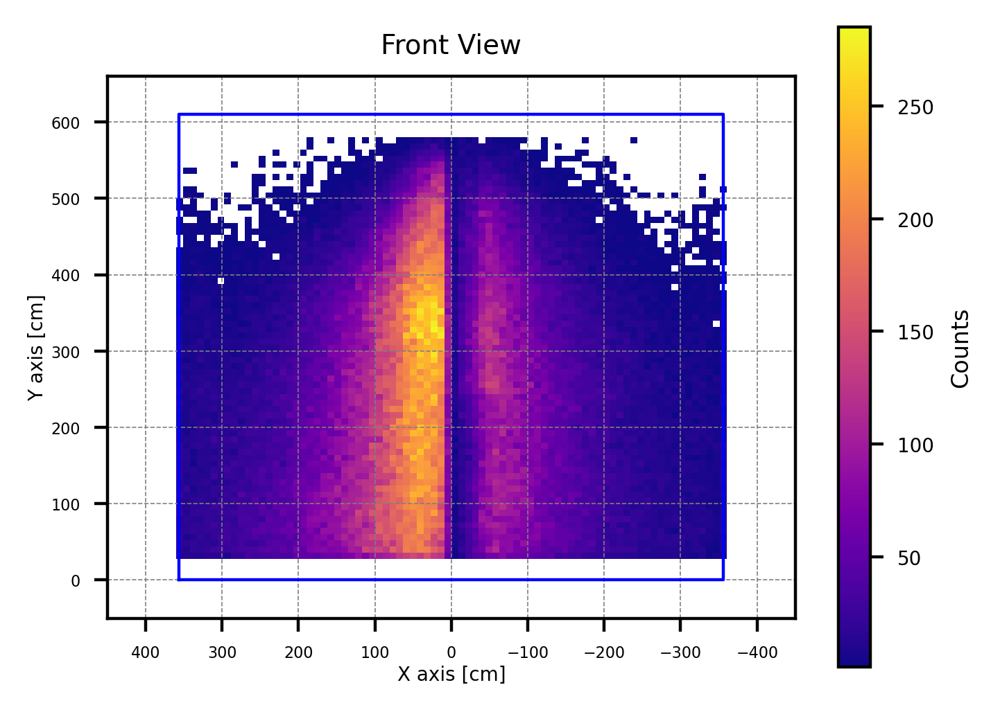

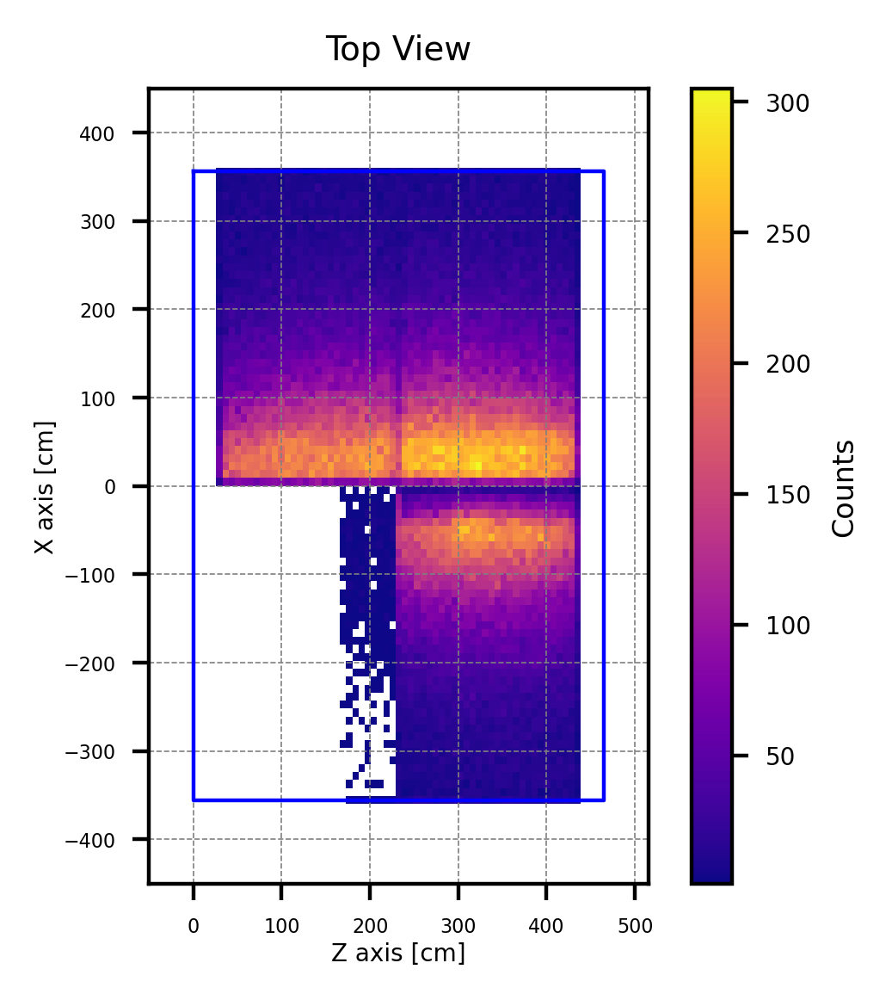


Decay points distribution (TPC & #opWvf cuts): 
# of X < 0 :  79197 (31.29%)
# of X >= 0:  173905 (68.71%)

Michel purity:  206629 /  253102 (81.64%)

Bin Center | Final / Initial Ratio
-------------------------------
   -355.0 | 0.056
   -345.0 | 0.624
   -335.0 | 0.690
   -325.0 | 0.711
   -315.0 | 0.719
   -305.0 | 0.723
   -295.0 | 0.694
   -285.0 | 0.724
   -275.0 | 0.711
   -265.0 | 0.711
   -255.0 | 0.738
   -245.0 | 0.778
   -235.0 | 0.746
   -225.0 | 0.772
   -215.0 | 0.771
   -205.0 | 0.772
   -195.0 | 0.780
   -185.0 | 0.782
   -175.0 | 0.777
   -165.0 | 0.783
   -155.0 | 0.796
   -145.0 | 0.789
   -135.0 | 0.784
   -125.0 | 0.785
   -115.0 | 0.797
   -105.0 | 0.791
    -95.0 | 0.800
    -85.0 | 0.809
    -75.0 | 0.803
    -65.0 | 0.809
    -55.0 | 0.801
    -45.0 | 0.784
    -35.0 | 0.863
    -25.0 | 0.876
    -15.0 | 0.828
     -5.0 | 0.733
      5.0 | 0.867
     15.0 | 0.898
     25.0 | 0.911
     35.0 | 0.896
     45.0 | 0.825
     55.0 | 0.821
     65.0 | 0.818
     75

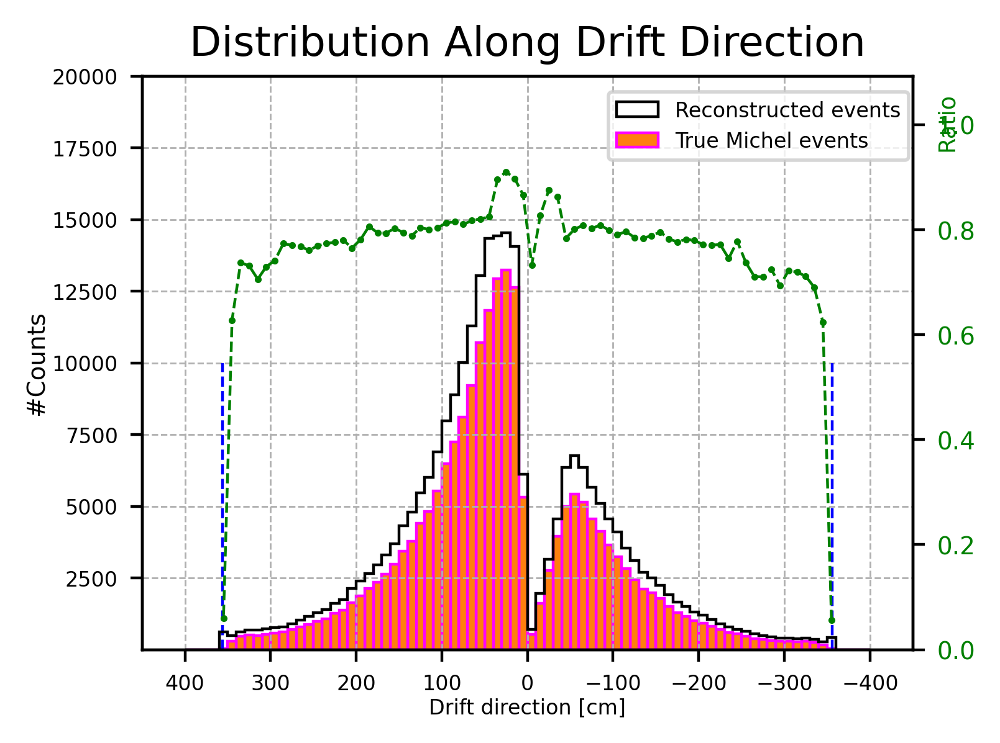

In [6]:
posX = [ev.posX for ev in events_reco_initial]
posY = [ev.posY for ev in events_reco_initial]
posZ = [ev.posZ for ev in events_reco_initial]

posX_true = [ev.posX for ev in events_true_initial]




#Y-X plane ploting (Front View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#Set the limts of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

#Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')


# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posX, posY, bins=(100, 100), range=[[xmin, xmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-450, 450)#z---
plt.ylim(-50, 660)
plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Front View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 




#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux1 = [0, 465, 465, 0, 0] #y shoud be y---
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posZ, posX, bins=(100, 100), range=[[zmin, zmax], [xmin, xmax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.3)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.title('Top View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()








#Decay points distribution:==================================================================
print("\nDecay points distribution (TPC & #opWvf cuts): ")

posX = np.array(posX)
neg_X = np.sum(posX < 0)
pos_X = np.sum(posX >= 0)
print("# of X < 0 : ", neg_X, "({:.2f}%)".format(neg_X/len(posX)*100))
print("# of X >= 0: ", pos_X, "({:.2f}%)".format(pos_X/len(posX)*100))

print("\nMichel purity: ", len(events_true_initial), "/ ", len(events_reco_initial), 
      "({:.2f}%)".format(len(events_true_initial)/len(events_reco_initial)*100))         



# Plotting the histogram (X distribution)---------------
fig, ax1 = plt.subplots(figsize=(4, 3), dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)
bin_centers = (bins[:-1] + bins[1:]) / 2

# --- Histogram counts ---
n_initial, _ = np.histogram(posX, bins=bins)
n_final, _ = np.histogram(posX_true, bins=bins)

# --- Ratio Calculation (only for [-360, 360]) ---
ratio = []
ratio_centers = []

print("\nBin Center | Final / Initial Ratio")
print("-------------------------------")
for center, ni, nf in zip(bin_centers, n_initial, n_final):
    if -360 <= center <= 360:
        r = nf / ni if ni > 0 else np.nan
        ratio.append(r)
        ratio_centers.append(center)
        if ni > 0:
            print(f"{center:9.1f} | {r:.3f}")
        else:
            print(f"{center:9.1f} |   NaN")


# Filter out NaN values for min/max calculation
valid_ratios = [r for r in ratio if not np.isnan(r)]

if valid_ratios:
    print("\nMaximum ratio: {:.3f}".format(np.max(valid_ratios)))
    print("Minimum ratio: {:.3f}".format(np.min(valid_ratios)))
else:
    print("\nNo valid ratios to compute min/max.")

#APA planes---
plt.plot([-356, -356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([356, 356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')

# Plot histograms
ax1.hist(bins[:-1], bins=bins, weights=n_initial, edgecolor='black',
         histtype='step', linewidth=0.8, label='Reconstructed events')
ax1.hist(bins[:-1], bins=bins, weights=n_final, edgecolor='magenta',
         histtype='bar', linewidth=0.8, label='True Michel events')

ax1.set_ylabel('Counts')
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.legend(loc='upper center', bbox_to_anchor=(0.8, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})
ax1.set_xlim(-450, 450)
ax1.set_ylim(0.1, 20000)
ax1.set_xlabel('Drift direction [cm]', labelpad=1, fontsize=6)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=7)
ax1.invert_xaxis()
#ax1.set_yscale('log')
ax1.tick_params(labelsize=6)

# Secondary y-axis for ratio
ax2 = ax1.twinx()

ax2.plot(ratio_centers, ratio, 'o--', color='green', markersize=1, linewidth=0.8, label='Final / Initial Ratio')

ax2.set_ylabel('Ratio', labelpad=1, fontsize=6.6, color='green', rotation=90)
ax2.yaxis.set_label_position("right")
ax2.yaxis.set_label_coords(1.03, 0.92)  # (x, y) in axis coordinates

ax2.tick_params(labelsize=7, axis='y', labelcolor='green')
ax2.set_ylim(0, np.nanmax(ratio) * 1.2)

# Final layout
#plt.tight_layout()

plt.title('Distribution Along Drift Direction', fontsize=12)

plt.show()



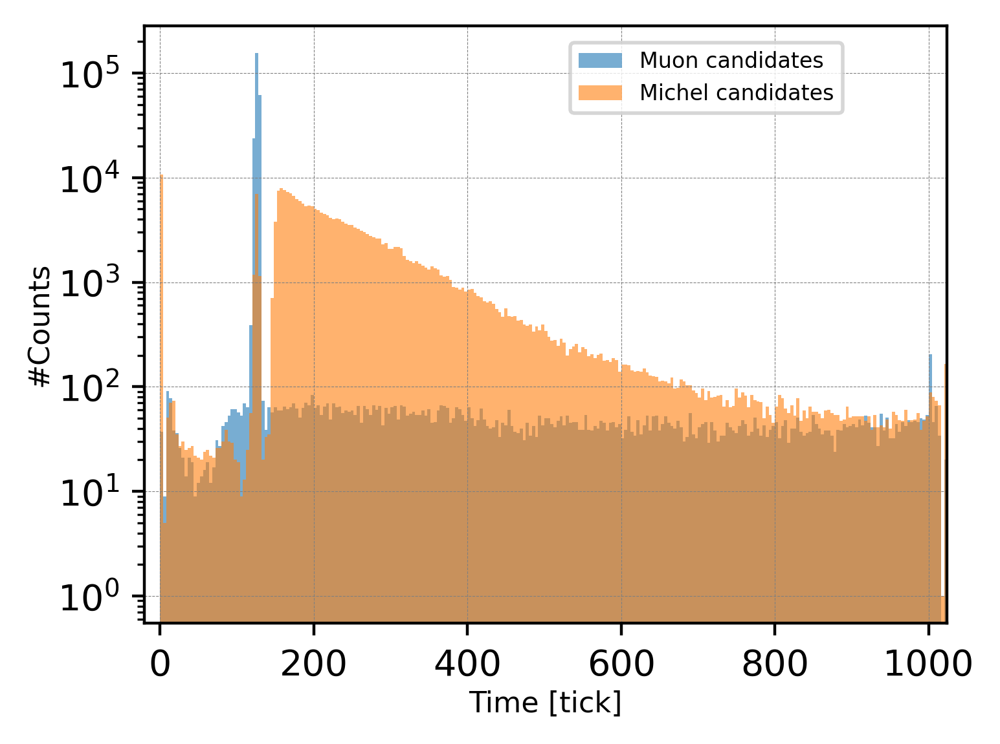

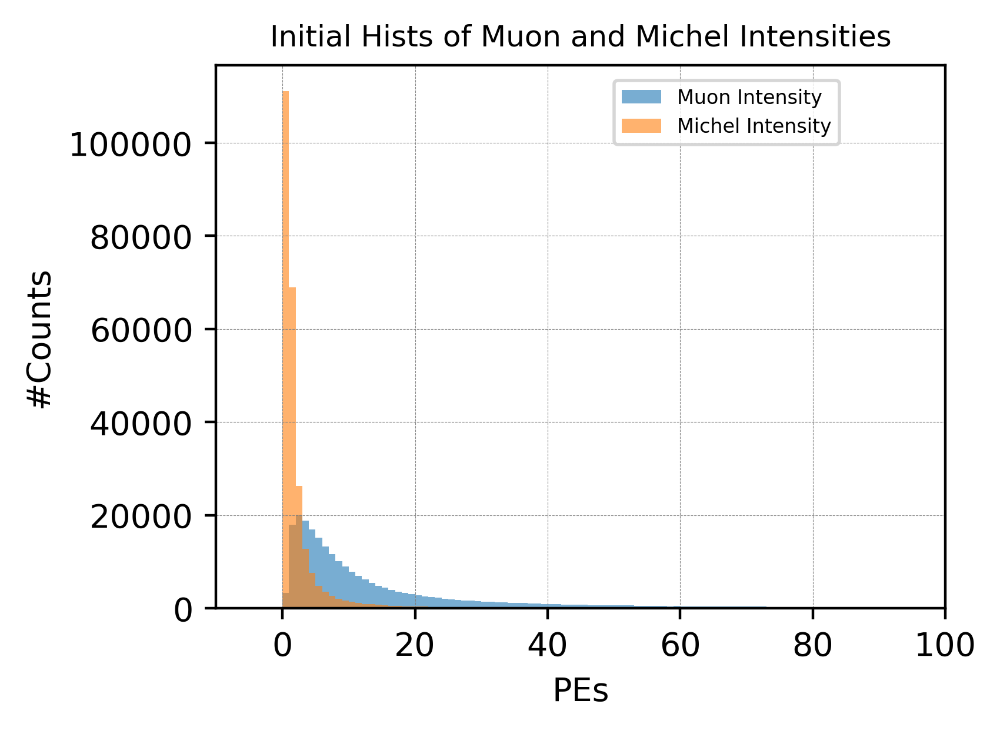

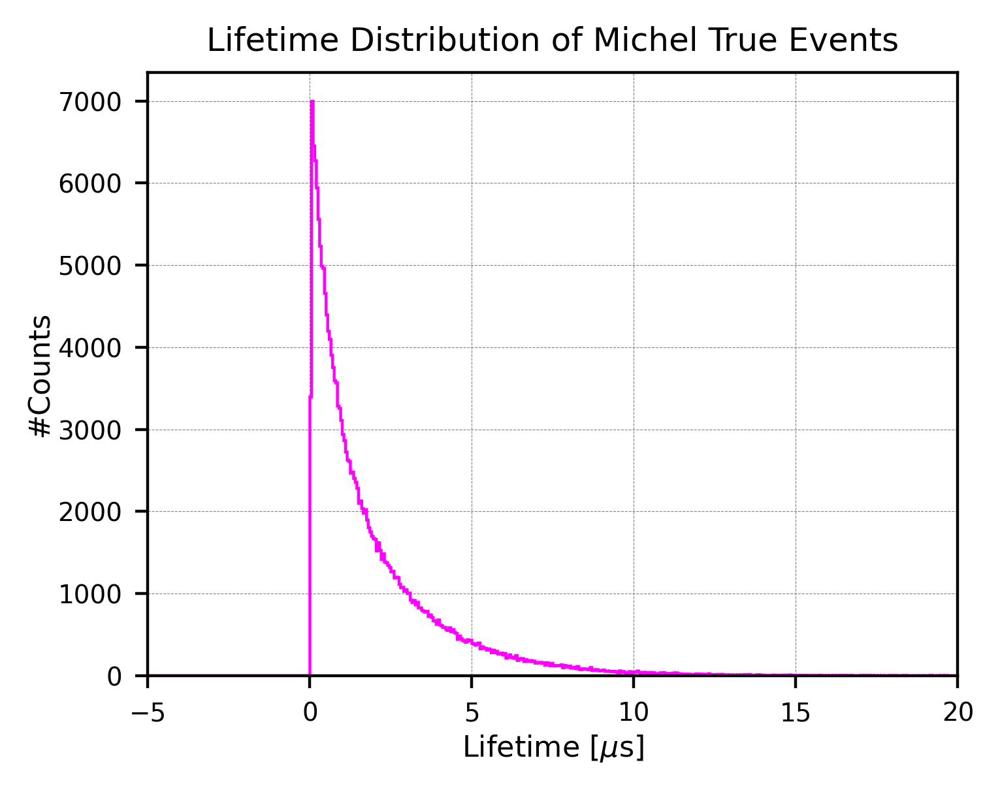

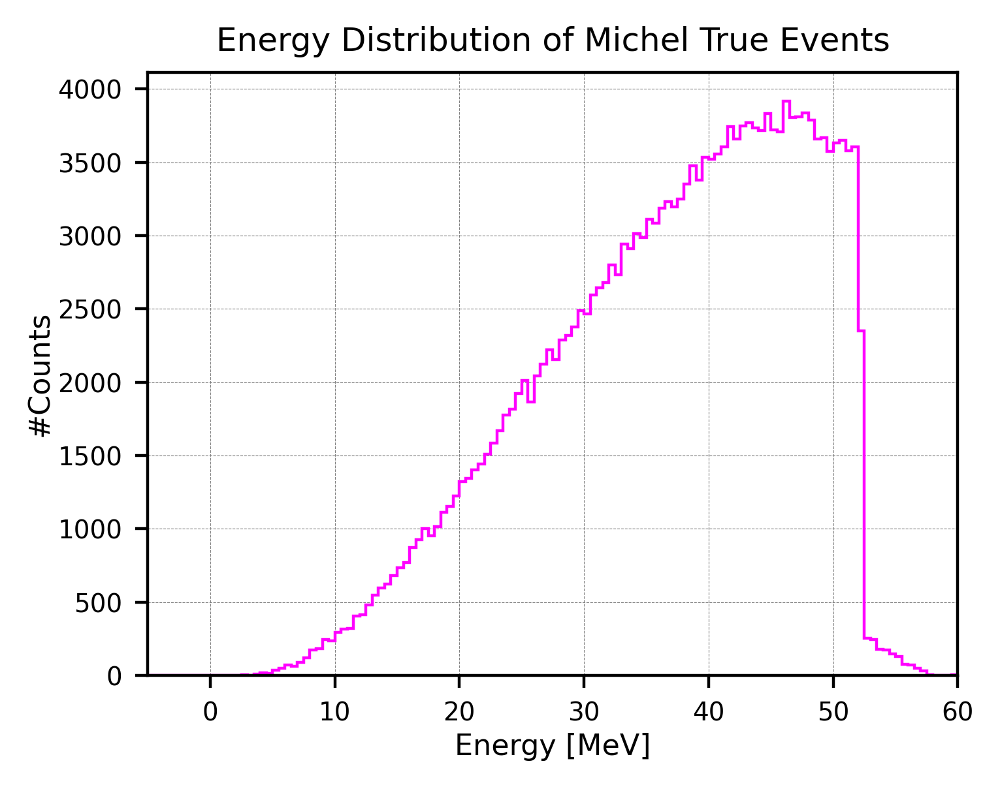

In [7]:
muon_time = [ev.muon_time for ev in events_reco_initial]
michel_time = [ev.michel_time for ev in events_reco_initial]

muon_intensity = [ev.muon_intensity for ev in events_reco_initial]
michel_intensity = [ev.michel_intensity for ev in events_reco_initial]

lifetime = [ev.lifetime for ev in events_true_initial] #true lifetime---
energy = [ev.energy for ev in events_true_initial] 


#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_time, bins=bins, alpha=0.6, label='Muon candidates')
plt.hist(michel_time, bins=bins, alpha=0.6, label='Michel candidates')

plt.xlabel('Time [tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.yscale('log')
plt.xlim(-20, 1024)
#plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.savefig('ch8_pds_MuMiTime_MC.png', dpi=600, bbox_inches='tight')

plt.show()




#Initial Mu and Michel intensity distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 100
bin_width_initial = 1  # You can change this value
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_intensity, bins=bins, alpha=0.6, label='Muon Intensity')
plt.hist(michel_intensity, bins=bins, alpha=0.6, label='Michel Intensity')

plt.xlabel('PEs')
plt.ylabel('#Counts')
#plt.yscale('log')
plt.xlim(-10, 100)
plt.title('Initial Hists of Muon and Michel Intensities', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()







#True Lifetime distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = -20
range_max = 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(lifetime, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 20)
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distribution of Michel True Events', fontsize=9)
plt.show()  





#True Energy distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = -20
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(energy, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Energy Distribution of Michel True Events', fontsize=9)
plt.show()  





<br />
<br />
<br />
<br />


### Purification / cut 2: remove abnormal muon signals (constrain muTime to [120, 130])

Muon events selection (mu peak constrained to [120, 130]):
Updated Muon events:  240930 /  253102 (95.19%)
Length of time_difference (Updated):  240930

Michel purity:  196680 /  240930 (81.63%)


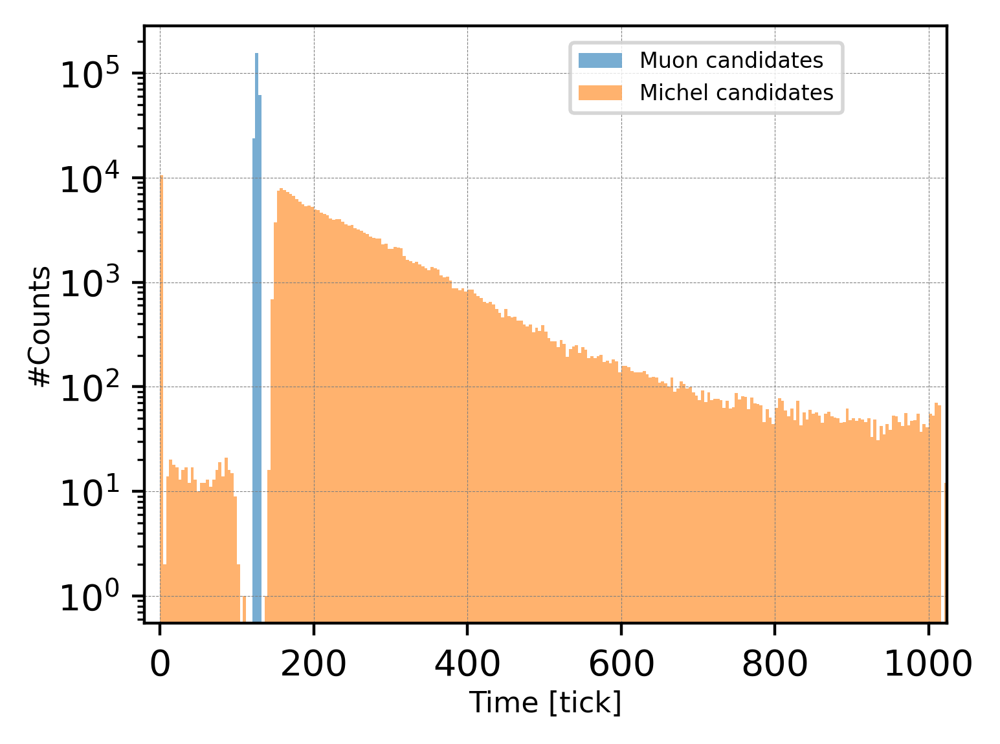




Lifetime distribution (Updated):
# Initial Candidates [-16000, 16000]:  240930


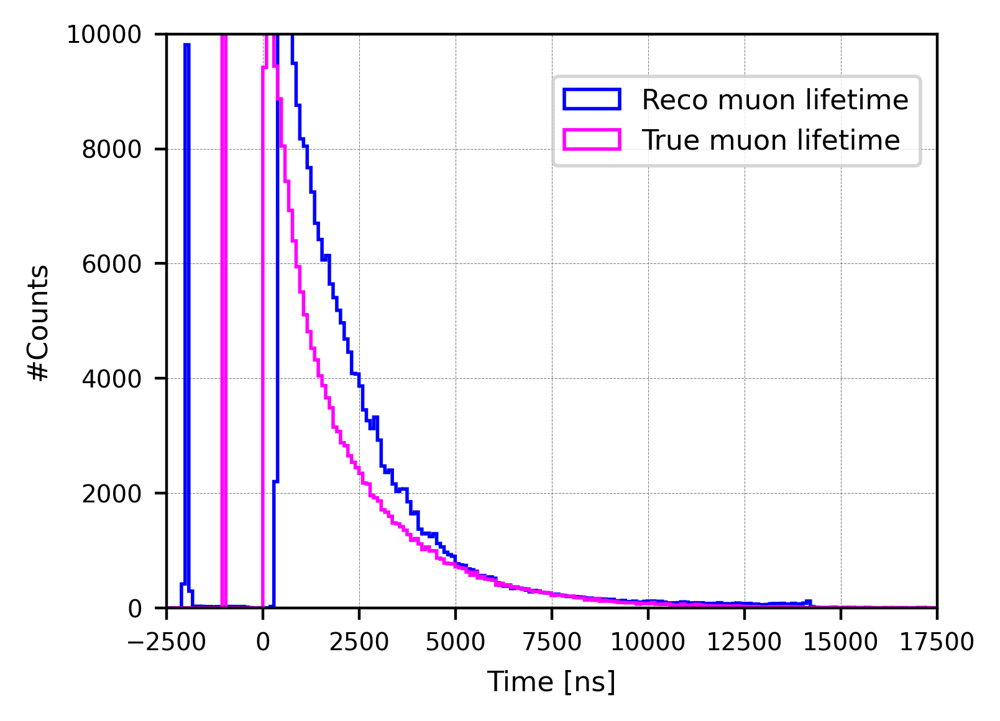

In [8]:
events_reco_update1 = []
events_true_update1 = []

lifetime_reco_update1 = []

for ev in events_reco_initial:
    muTime = ev.muon_time
    miTime = ev.michel_time
    energy = ev.energy

    if 120 <= muTime <= 130:
        events_reco_update1.append(ev)
        t = miTime-muTime
        lifetime_reco_update1.append(t)

        if energy > 0:
            events_true_update1.append(ev)


print("Muon events selection (mu peak constrained to [120, 130]):")
print("Updated Muon events: ", len(events_reco_update1), "/ ", len(events_reco_initial), 
       "({:.2f}%)".format(len(events_reco_update1)/len(events_reco_initial)*100))

# Element-wise subtraction: (mi - mu) for each corresponding element
print("Length of time_difference (Updated): ", len(lifetime_reco_update1))

print("\nMichel purity: ", len(events_true_update1), "/ ", len(events_reco_update1), 
      "({:.2f}%)".format(len(events_true_update1)/len(events_reco_update1)*100)) 









#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

muTime_update = [ev.muon_time for ev in events_reco_update1]
miTime_update = [ev.michel_time for ev in events_reco_update1]


# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muTime_update, bins=bins, alpha=0.6, label='Muon candidates')
plt.hist(miTime_update, bins=bins, alpha=0.6, label='Michel candidates')

plt.xlabel('Time [tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.yscale('log')
plt.xlim(-20, 1024)
#plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)


plt.show()










# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Convert to ns (assuming mu_lifetime is already defined)
timdeDiff_update_ns = [value * 16 for value in lifetime_reco_update1]#reco lifetime---

lifetime_true_update1 = [ev.lifetime for ev in events_reco_update1]
lifetime_update_ns = [value * 1000 for value in lifetime_true_update1]#True lifetime---


print("\n\n\nLifetime distribution (Updated):")
print("# Initial Candidates [-16000, 16000]: ", len(timdeDiff_update_ns))

# Define histogram parameters
bin_width =96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(timdeDiff_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')

plt.hist(lifetime_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')


plt.xlim(-2500, 17500)
plt.ylim(0, 10000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






<br />
<br />
<br />
<br />


### Purification / cut 3: remove events with unphysical lifetime (constrain lifetime to [500, inf))

#### (20251022): lifetime cut should be >0 here (we know later that 500 is NOT a good standard)




Lifetime distribution (Updated)

After lifetime cut (cut 3):
# Updated Candidates [0, 16000]:  230076
Efficiency (cut3 / cut2):  230076 / 240930 (95.49%)

#Purity:  186900 / 230076 (81.23%)


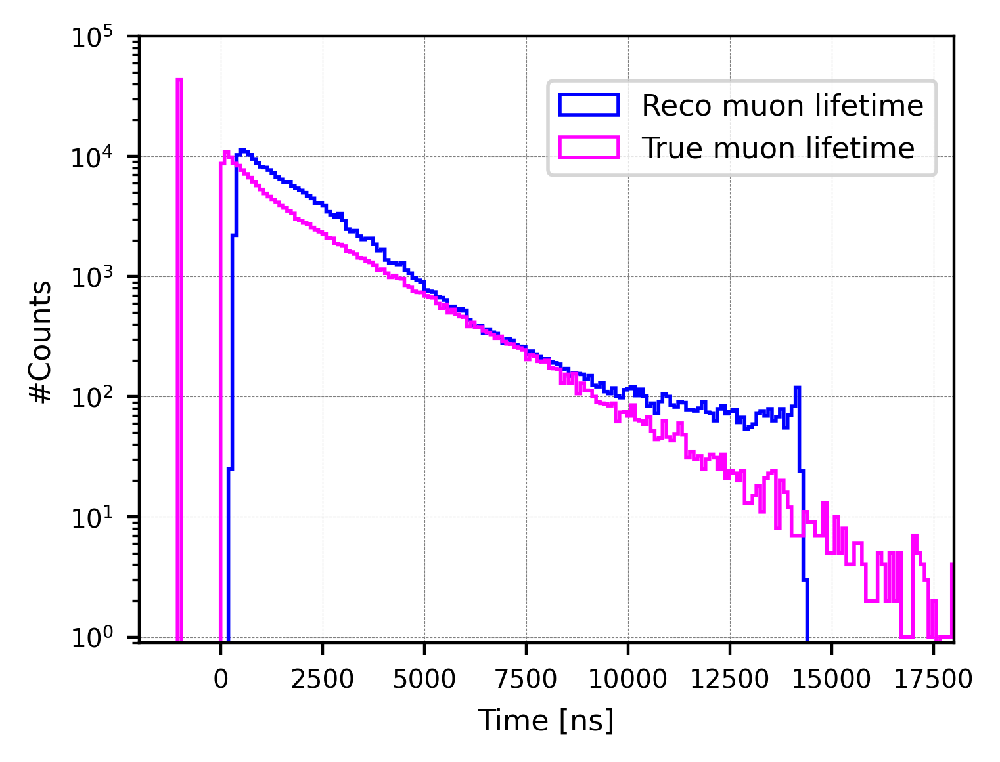

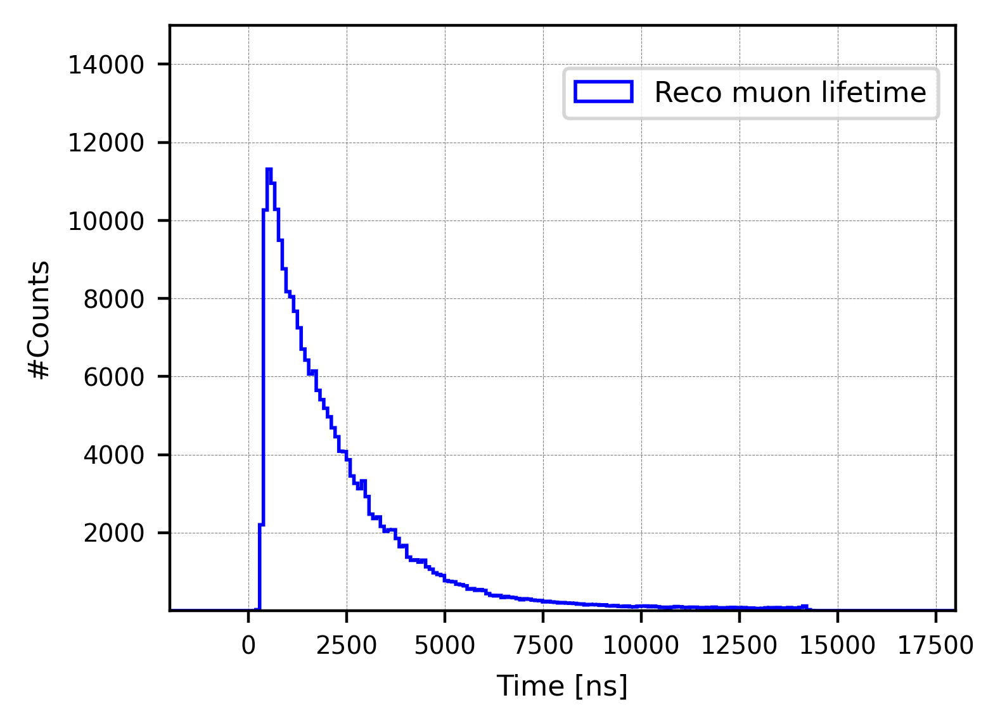

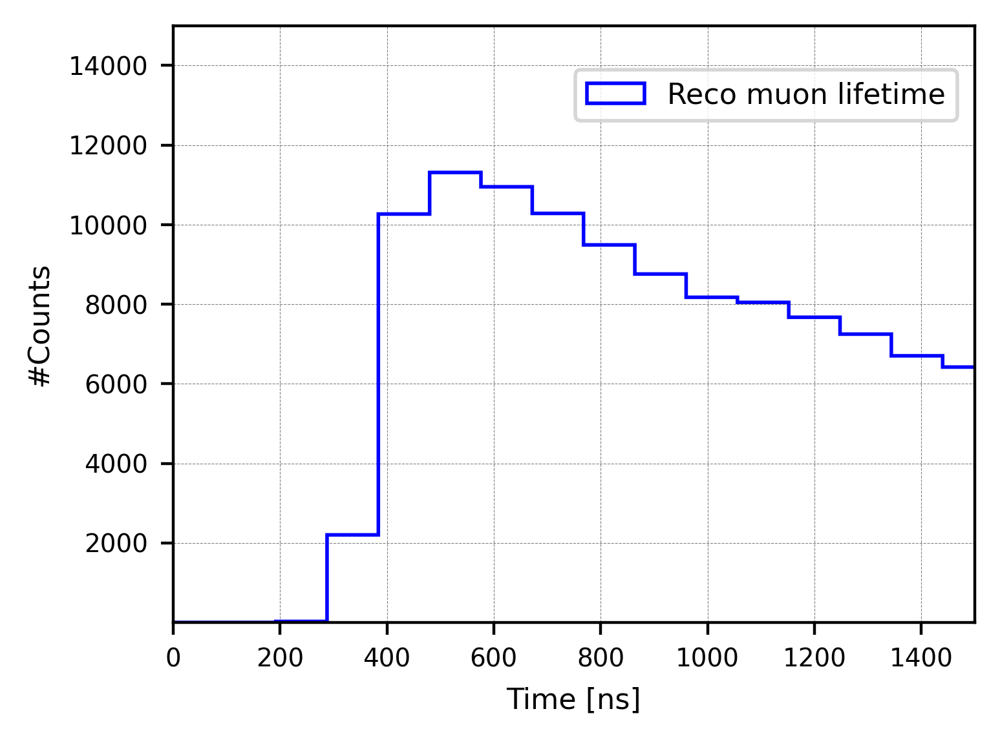

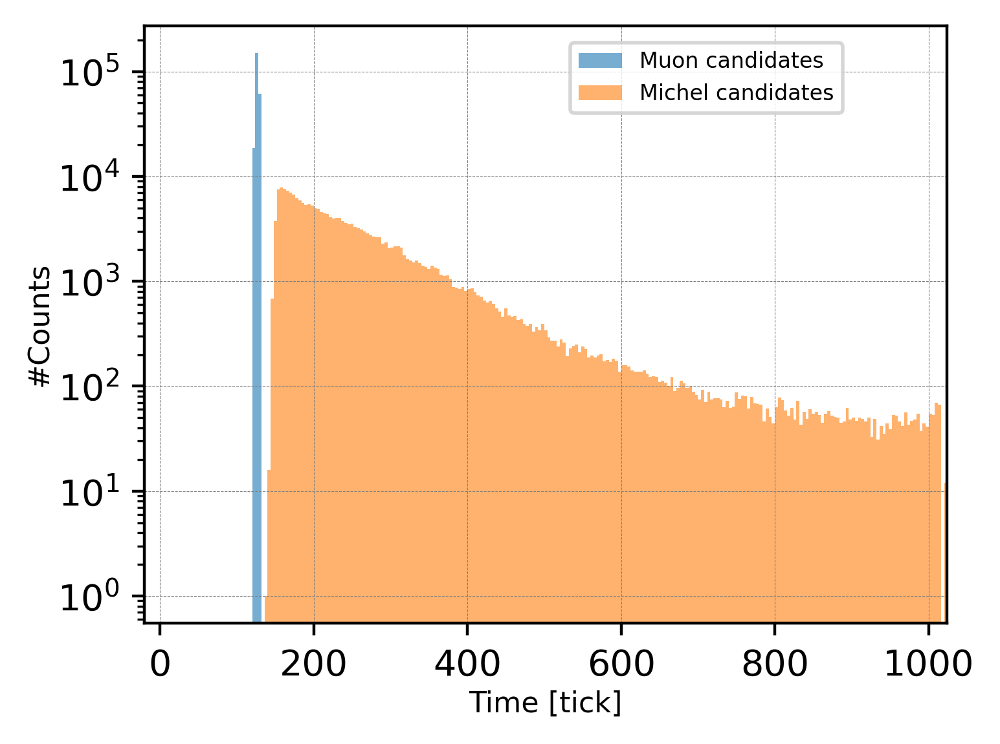

In [9]:
events_reco_update2 = []#Dataset after Purification 2---
events_true_update2 = []
lifetime_reco_update2 = []

for ev in events_reco_update1:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---
    e = ev.energy

    if 0 <= timeDiff: #keep physical events here---
        events_reco_update2.append(ev)
        lifetime_reco_update2.append(timeDiff)

        if e > 0:
            events_true_update2.append(ev)





print("\n\n\nLifetime distribution (Updated)")
print("\nAfter lifetime cut (cut 3):")
print("# Updated Candidates [0, 16000]: ", len(events_reco_update2))
print("Efficiency (cut3 / cut2): ", len(events_reco_update2), "/", len(events_reco_update1),
      "({:.2f}%)".format(len(events_reco_update2)/len(events_reco_update1)*100))
print("\n#Purity: ", len(events_true_update2), "/", len(events_reco_update2), 
     "({:.2f}%)".format(len(events_true_update2)/len(events_reco_update2)*100))





# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(lifetime_reco_update2, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')


lifetime_update_ns2 = [ev.lifetime * 1000 for ev in events_reco_update2]#True lifetime (contain false)---
plt.hist(lifetime_update_ns2, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')


plt.xlim(-2000, 18000)
plt.ylim(0.9, 100000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})

plt.savefig('ch8_pds_lifetimeRecoIni2_MC.png', dpi=600, bbox_inches='tight')

plt.show()









# Muon Lifetime distribution (reco only)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(lifetime_reco_update2, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')


plt.xlim(-2000, 18000)
plt.ylim(0.9, 15000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})

plt.savefig('ch8_pds_lifetimeRecoIni_MC.png', dpi=600, bbox_inches='tight')

plt.show()






#Lifetime distribution (reco only)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(lifetime_reco_update2, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')


plt.xlim(0, 1500)
plt.ylim(0.9, 15000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})

plt.savefig('ch8_pds_lifetimeRecoIni_MC.png', dpi=600, bbox_inches='tight')

plt.show()







#--------------------------------------------------------------
#Mu time & Mi time distribution after reco>0:
muTime_update_ns2 = [ev.muon_time for ev in events_reco_update2]
miTime_update_ns2 = [ev.michel_time for ev in events_reco_update2]

plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muTime_update_ns2, bins=bins, alpha=0.6, label='Muon candidates')
plt.hist(miTime_update_ns2, bins=bins, alpha=0.6, label='Michel candidates')

plt.xlabel('Time [tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.yscale('log')
plt.xlim(-20, 1024)
#plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.savefig('ch8_pds_MuMiTime2_MC.png', dpi=600, bbox_inches='tight')

plt.show()








--------------------------------------
[-500, 500]:  111918 / 230076 (48.64%)


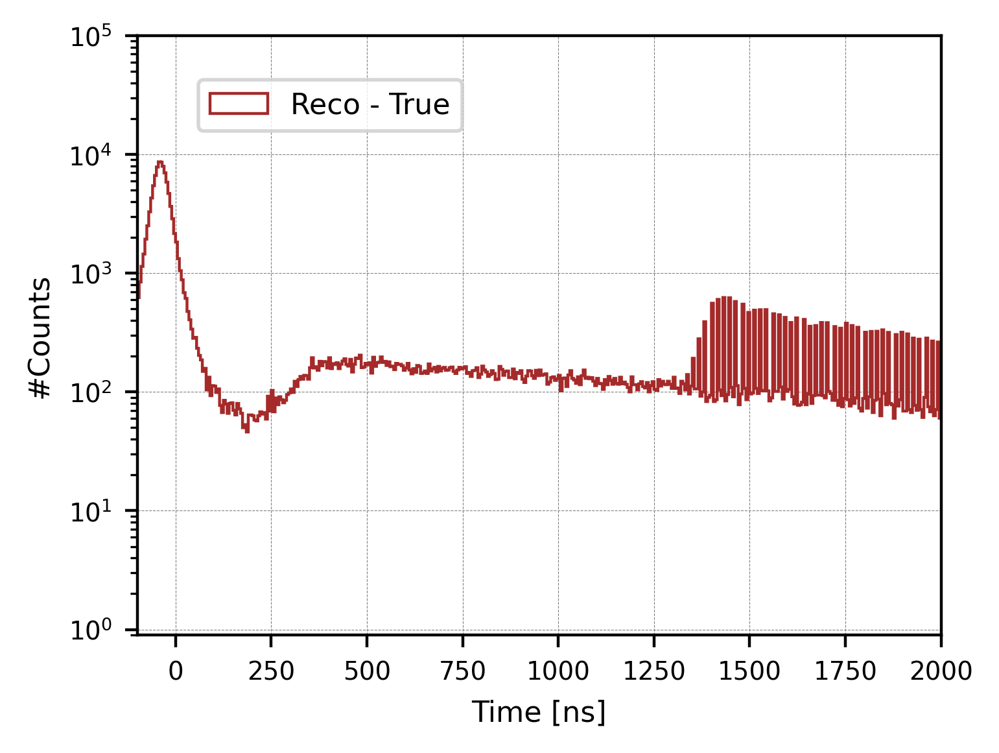



Explore the peak------


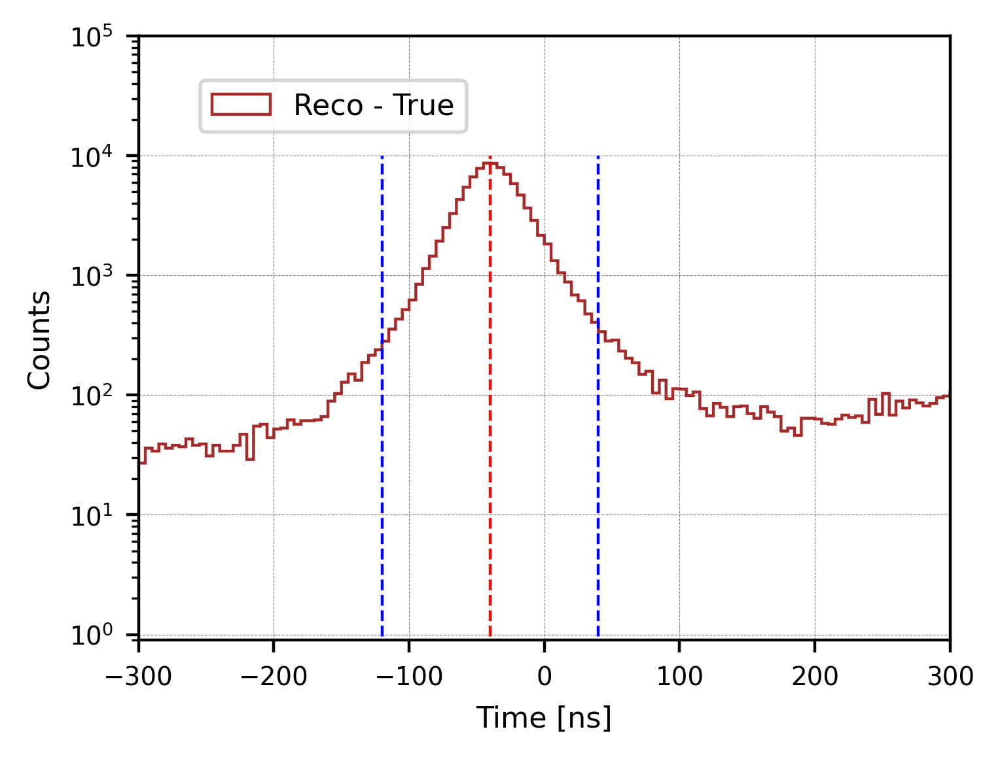

In [10]:
#---------------------------------------------------------------
#Reco True difference-------------------------------------------

diff_reco_true = []
for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---
    lifetime = ev.lifetime * 1000 #convert to ns---

    diff_reco_true.append(timeDiff-lifetime)


reco_true_count_500 = sum(-500 <= x <= 500 for x in diff_reco_true)
print("\n--------------------------------------")
print("[-500, 500]: ", reco_true_count_500, "/", len(diff_reco_true), 
     "({:.2f}%)".format(reco_true_count_500/len(diff_reco_true)*100))


#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 5
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

#plt.xlim(-16000, 16000)
plt.xlim(-100, 2000)
plt.ylim(0.9, 100000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})

plt.savefig('ch8_pds_timeDiff_MC.png', dpi=600, bbox_inches='tight')

plt.show()





#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

print("\n\nExplore the peak------")

# Plot histogram-----------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

# The peak
plt.plot([-40, -40], [0, 10000], color="red", linewidth=0.8, linestyle='--')
#+-5 ticks
plt.plot([-120, -120], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([40, 40], [0, 10000], color="blue", linewidth=0.8, linestyle='--')

plt.xlim(-300, 300)
plt.ylim(0.9, 100000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Counts', fontsize=8)
#plt.title('Ex=')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()





#### Gaussian fitting of (Reco - True) peak:



Explore the peak------

First-pass fit:
    mu    = -39.04 ns
    sigma = 22.37 ns

Second-pass fit:
    mu    = -39.04 ns
    sigma = 22.28 ns
    fit window = [-106.1, 28.1] ns

Goodness-of-fit:
    chi2 = 2695.9
    ndf  = 24
    chi2/ndf = 112.33

Comment from Shu: The Gaussian fitting result is not reliable...


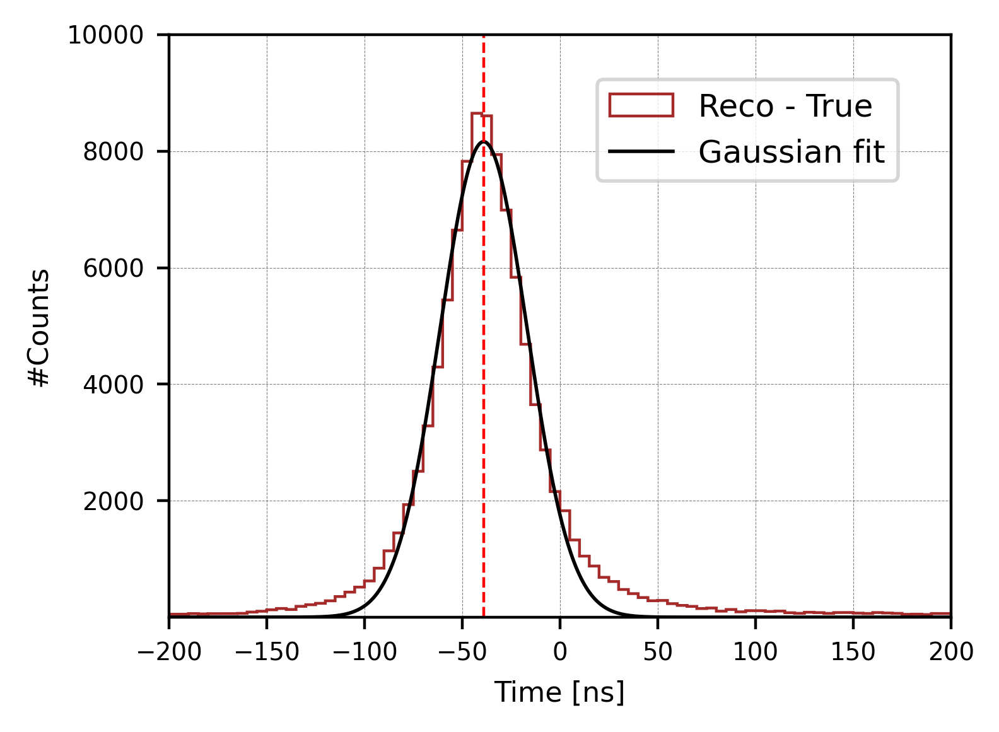

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

plt.figure(figsize=(4, 3), dpi=400)

print("\n\nExplore the peak------")

counts, edges = np.histogram(diff_reco_true, bins=bins, range=(range_min, range_max))
centers = 0.5 * (edges[:-1] + edges[1:])

def gaussian(x, A, mu, sigma):
    sigma = abs(sigma) + 1e-12
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# -------------------------
# First-pass fit
# -------------------------
fit_mask1 = (centers > -150) & (centers < 100)

x_fit1 = centers[fit_mask1]
y_fit1 = counts[fit_mask1]

A0 = np.max(y_fit1)
mu0 = x_fit1[np.argmax(y_fit1)]
sigma0 = 30.0

popt1, pcov1 = curve_fit(gaussian, x_fit1, y_fit1, p0=[A0, mu0, sigma0])

A1, mu1, sigma1 = popt1
sigma1 = abs(sigma1)

print("\nFirst-pass fit:")
print(f"    mu    = {mu1:.2f} ns")
print(f"    sigma = {sigma1:.2f} ns")

# -------------------------
# Second-pass fit (core region)
# -------------------------
low2 = mu1 - 3 * sigma1
high2 = mu1 + 3 * sigma1

fit_mask2 = (centers > low2) & (centers < high2)

x_fit2 = centers[fit_mask2]
y_fit2 = counts[fit_mask2]

if len(y_fit2) < 5:
    print("Warning: second-pass window too small, using first-pass window")
    x_fit2 = x_fit1
    y_fit2 = y_fit1

popt2, pcov2 = curve_fit(gaussian, x_fit2, y_fit2, p0=[A1, mu1, sigma1])

A_fit, mu_fit, sigma_fit = popt2
sigma_fit = abs(sigma_fit)

print("\nSecond-pass fit:")
print(f"    mu    = {mu_fit:.2f} ns")
print(f"    sigma = {sigma_fit:.2f} ns")
print(f"    fit window = [{low2:.1f}, {high2:.1f}] ns")

# -------------------------
# Goodness of fit (chi2)
# -------------------------
model = gaussian(x_fit2, A_fit, mu_fit, sigma_fit)

mask = y_fit2 > 0
chi2 = np.sum((y_fit2[mask] - model[mask])**2 / y_fit2[mask])
ndf = np.sum(mask) - 3

print("\nGoodness-of-fit:")
print(f"    chi2 = {chi2:.1f}")
print(f"    ndf  = {ndf}")
print(f"    chi2/ndf = {chi2/ndf:.2f}")


print("\nComment from Shu: The Gaussian fitting result is not reliable...")


# -------------------------
# Plot
# -------------------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

x_dense = np.linspace(-300, 300, 800)
y_dense = gaussian(x_dense, A_fit, mu_fit, sigma_fit)

plt.plot(x_dense, y_dense, color="black", linewidth=1.0, label="Gaussian fit")

plt.axvline(mu_fit, color="red", linestyle="--", linewidth=0.8)
#plt.axvline(mu_fit - 3*sigma_fit, color="blue", linestyle="--", linewidth=0.8)
#plt.axvline(mu_fit + 3*sigma_fit, color="blue", linestyle="--", linewidth=0.8)
#plt.axvline(-120, color="blue", linestyle="--", linewidth=0.8)
#plt.axvline(40, color="blue", linestyle="--", linewidth=0.8)

plt.xlim(-200, 200)
plt.ylim(0.9, 10000)
#plt.yscale('log')

plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)

plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95),
           fontsize=12, markerscale=6, ncol=1, prop={'size':9})

plt.savefig('ch8_pds_timeDiffZoomed_MC.png', dpi=600, bbox_inches='tight')

plt.show()



<br />
<br />
<br />
<br />
<br />
<br />
<br />

## Explore Dataset After purification 3 [RecoT>0]:

In [12]:
@dataclass
class PdsEventNew: #new class containing reco lifetime, true lifetime & diff
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    energy: Optional[float] = None
    lifetime: Optional[float] = None #in unit of us---
    pdg: Optional[int] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None 
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None 
    reco_lifetime: Optional[float] = None
    true_lifetime: Optional[float] = None # in unit of ns---
    diff_lifetime: Optional[float] = None
    michel_rise: Optional[float] = None
    michel_drop: Optional[float] = None



#Test print---------------
print("Size of events_reco_update2 (previous class): ", len(events_reco_update2))

#New calculated reco & true lifetime lists:
recoLife_update2 = []
trueLife_update2 = []  
diffLife_update2 = []

michel_rise_slope = []
michel_drop_slope = []

for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---

    recoLife_update2.append(timeDiff)
    trueLife_update2.append(ev.lifetime * 1000)
    diffLife_update2.append(timeDiff - ev.lifetime * 1000)

    left_slope = ev.mi_leftHeight / (miTime - ev.mi_leftTurn)
    right_slope = ev.mi_rightHeight / (ev.mi_rightTurn - miTime)

#    left_slope = (miTime - ev.mi_leftTurn)
#    right_slope = (ev.mi_rightTurn - miTime)

    michel_rise_slope.append(left_slope)
    michel_drop_slope.append(right_slope)

print("Size of lifetime_reco_update2               : ", len(recoLife_update2))
print("Size of lifetime_update_ns2                 : ", len(trueLife_update2))



#Final events with new features----------
events_newClass = []
for ev, reco_life, true_life, diff_life, rise, drop in zip(
    events_reco_update2, 
    recoLife_update2, 
    trueLife_update2, 
    diffLife_update2,
    michel_rise_slope,
    michel_drop_slope
    ):
    new_ev = PdsEventNew(
        muon_time=ev.muon_time,
        michel_time=ev.michel_time,
        muon_intensity=ev.muon_intensity,
        michel_intensity=ev.michel_intensity,
        third_intensity=ev.third_intensity,
        posX=ev.posX,
        posY=ev.posY,
        posZ=ev.posZ,
        energy=ev.energy,
        lifetime=ev.lifetime,
        pdg=ev.pdg,
        eventID=ev.eventID,
        trackID=ev.trackID,
        date=ev.date,
        michel_score=ev.michel_score,
        michel_hits=ev.michel_hits, 
        reco_lifetime=reco_life,
        true_lifetime=true_life,
        diff_lifetime=diff_life,
        michel_rise=rise,
        michel_drop=drop
    )
    events_newClass.append(new_ev)

print("\nLength of final dataset in format of new class: ", len(events_newClass))


events_diff500 = []
events_diff0 = []
true_newClass = []
for ev in events_newClass:
    if ev.energy > 0:
        true_newClass.append(ev)

#===========================================================================
    if ev.diff_lifetime > 40 or ev.diff_lifetime < -120:
        events_diff500.append(ev)
    if -120 <= ev.diff_lifetime <= 40:
        events_diff0.append(ev)
#===========================================================================

print("\nLength of final true in format of new class: ", len(true_newClass))

print("\nEvents with diff [-120, 40] : ", len(events_diff0), "/", len(true_newClass),
       "({:.2f}%)".format(len(events_diff0)/len(true_newClass)*100))
print("\nEvents with diff OTHERS: ", len(events_diff500), "/", len(events_newClass),
       "({:.2f}%)".format(len(events_diff500)/len(events_newClass)*100))


Size of events_reco_update2 (previous class):  230076
Size of lifetime_reco_update2               :  230076
Size of lifetime_update_ns2                 :  230076

Length of final dataset in format of new class:  230076

Length of final true in format of new class:  186900

Events with diff [-120, 40] :  96212 / 186900 (51.48%)

Events with diff OTHERS:  133864 / 230076 (58.18%)


### Save muInt and miInt:

Length of muInt_total: 230076
Length of thirdInt_total: 230076
Length of miInt_diff500: 133864
Length of miInt_diff0: 96212

Saved!


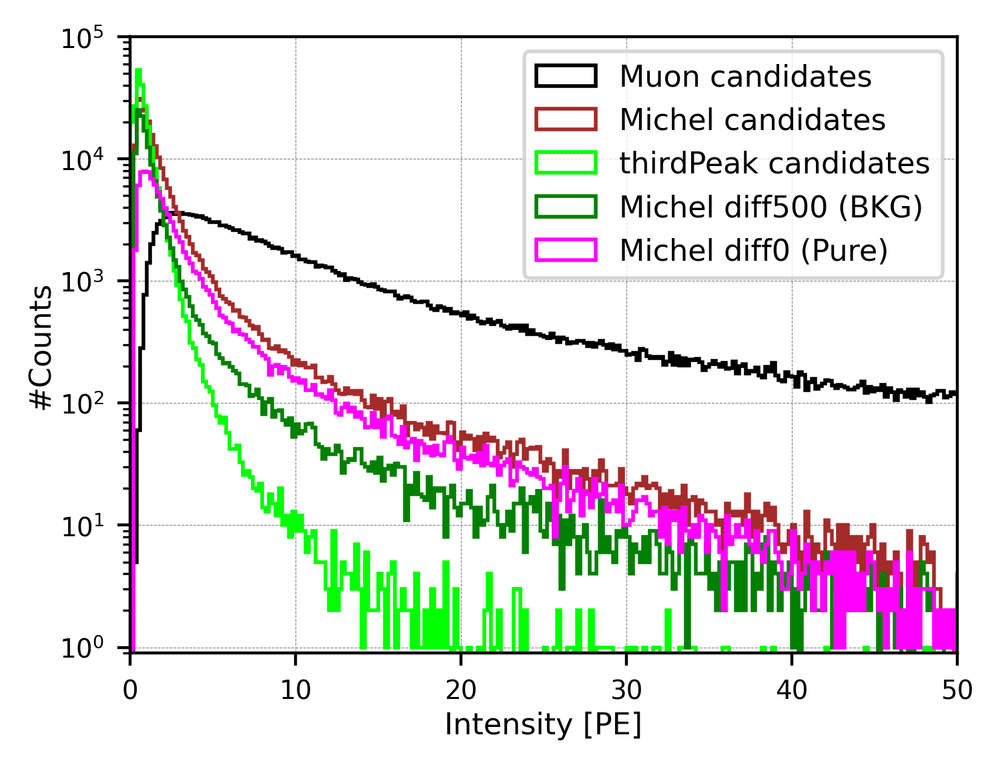

In [13]:
#Save lists:

muInt_total = [ev.muon_intensity for ev in events_newClass]
miInt_total = [ev.michel_intensity for ev in events_newClass]
miInt_diff0 = [ev.michel_intensity for ev in events_diff0]
miInt_diff500 = [ev.michel_intensity for ev in events_diff500]
thirdInt_total = [ev.third_intensity for ev in events_newClass]

np.save("muInt_total_MC.npy", np.array(muInt_total))
np.save("miInt_total_MC.npy", np.array(miInt_total))
np.save("thirdInt_total_MC.npy", np.array(thirdInt_total))
np.save("miInt_diff0_MC.npy", np.array(miInt_diff0))
np.save("miInt_diff500_MC.npy", np.array(miInt_diff500))

print("Length of muInt_total:", len(muInt_total))
print("Length of thirdInt_total:", len(thirdInt_total))
print("Length of miInt_diff500:", len(miInt_diff500))
print("Length of miInt_diff0:", len(miInt_diff0))
print("\nSaved!")



#Single Intensities===================================

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.2
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_total, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=1.0, label="Muon candidates")
plt.hist(miInt_total, bins=bins, range=(range_min, range_max), edgecolor='brown', 
         histtype='step', linewidth=1.0, label="Michel candidates")
plt.hist(thirdInt_total, bins=bins, range=(range_min, range_max), edgecolor='lime', 
         histtype='step', linewidth=1.0, label="thirdPeak candidates")
plt.hist(miInt_diff500, bins=bins, range=(range_min, range_max), edgecolor='green', 
         histtype='step', linewidth=1.0, label="Michel diff500 (BKG)")
plt.hist(miInt_diff0, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=1.0, label="Michel diff0 (Pure)")

#plt.plot([1, 1], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([4, 4], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 50)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 100000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 

### Purification 4:  Michel Intensity / Muon Intensity:

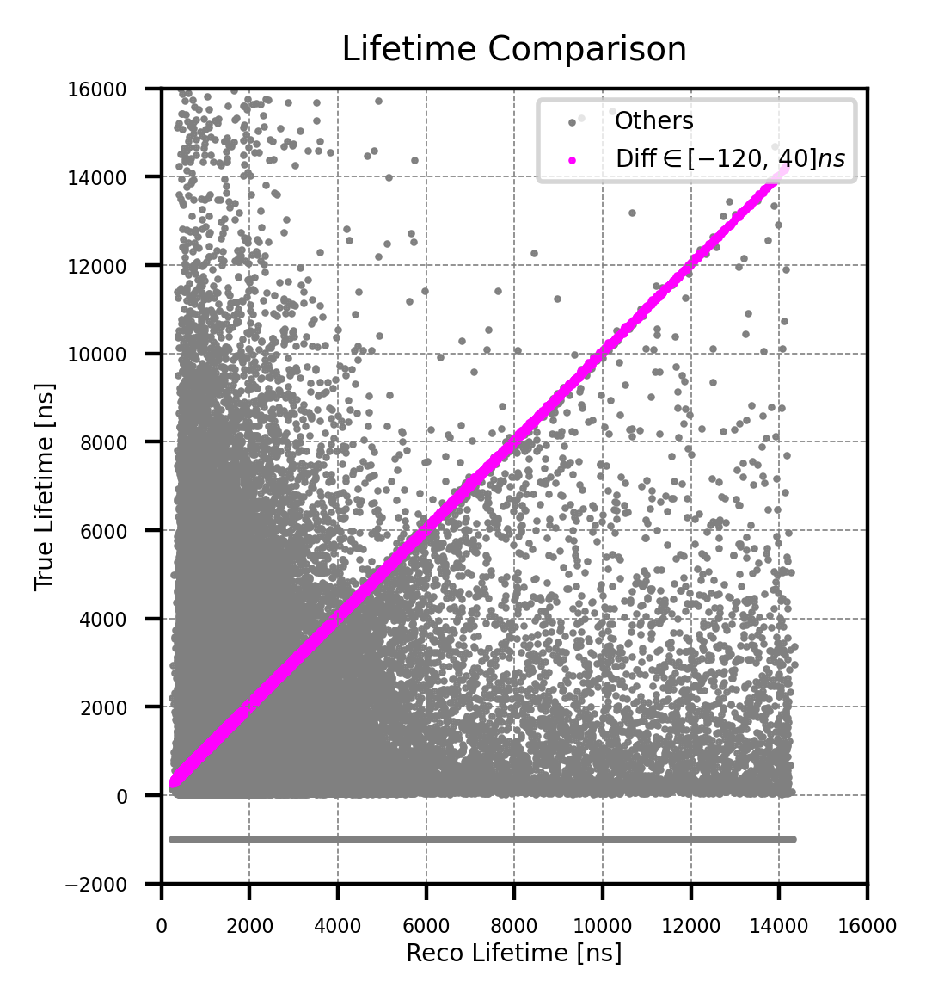

After lifetime cut (cut 3):
Purity (true / reco):  186900 / 230076 (81.23%)

(Diff [-120, 40]):  96212 / 186900 (51.48%)
(Diff OTHERS)    :  133864 / 230076 (58.18%)

Total events        = 230076
Mean Michel score   = 0.676
N(score > 0.8)      = 75254
Fraction > 0.8      = 0.327

(michel Intensity) / (muon intensity) (Cut 4):----------
Efficiency (cut4 / cut3):  98779 / 230076 (42.93%)
Purity (true / reco):  91177 / 98779 (92.30%)

(Diff [-120, 40]):  58600 / 91177 (64.27%)
(Diff Others)    :  40179 / 98779 (40.68%)

Total events        = 98779
Mean Michel score   = 0.707
N(score > 0.8)      = 37159
Fraction > 0.8      = 0.376


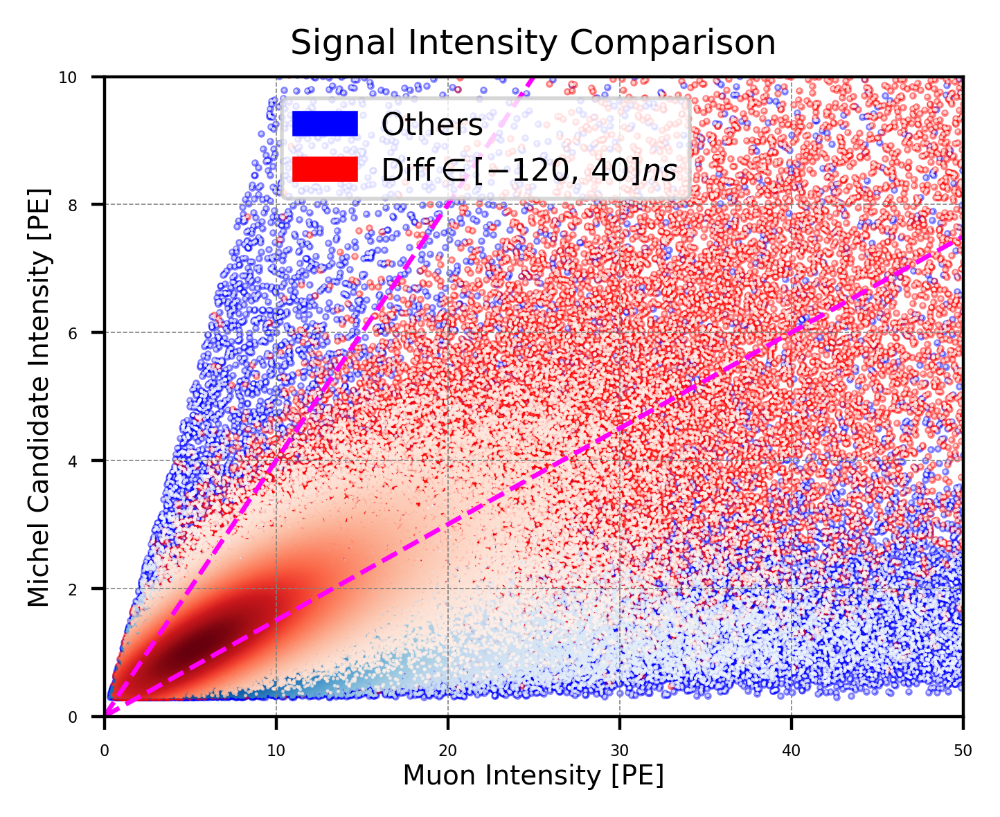

In [14]:
from scipy.stats import gaussian_kde
from matplotlib import colors 
import matplotlib.patches as mpatches

trueLife_diff500 = [ev.true_lifetime for ev in events_diff500]
recoLife_diff500 = [ev.reco_lifetime for ev in events_diff500]
muInt_diff500 = [ev.muon_intensity for ev in events_diff500]
miInt_diff500 = [ev.michel_intensity for ev in events_diff500]
X_diff500 = [ev.posX for ev in events_diff500]

trueLife_diff0 = [ev.true_lifetime for ev in events_diff0]
recoLife_diff0 = [ev.reco_lifetime for ev in events_diff0]
muInt_diff0 = [ev.muon_intensity for ev in events_diff0]
miInt_diff0 = [ev.michel_intensity for ev in events_diff0]
X_diff0 = [ev.posX for ev in events_diff0]

# Total---
muInt_total = [ev.muon_intensity for ev in events_newClass]
miInt_total = [ev.michel_intensity for ev in events_newClass]

mScore_total = [ev.michel_score for ev in events_newClass]



# ==========================================================
# TrueLife VS RecoLife
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(recoLife_diff500, trueLife_diff500, s=0.3, c='grey', alpha=1.0, label="Others")
plt.scatter(recoLife_diff0, trueLife_diff0, s=0.3, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#-----------------------

plt.axis('scaled')
plt.xlim(0, 16000)
plt.ylim(-2000, 16000)
plt.ylabel('True Lifetime [ns]', labelpad=1, fontsize=5)
plt.xlabel('Reco Lifetime [ns]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(fontsize=5, loc="upper right")
plt.show()








#Michel Intensity Cut (Cut 4)================================================
print("After lifetime cut (cut 3):")

n_valid = sum(1 for ev in events_newClass if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_newClass),
      "({:.2f}%)".format(n_valid/len(events_newClass)*100))

print("\n(Diff [-120, 40]): ", len(events_diff0), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0)/n_valid*100))
print("(Diff OTHERS)    : ", len(muInt_diff500), "/", len(events_newClass),
       "({:.2f}%)".format(len(muInt_diff500)/len(events_newClass)*100))

#Michel score:
mean_score = sum(mScore_total) / len(mScore_total)
n_high = sum(1 for s in mScore_total if s > 0.8)
frac_high = n_high / len(mScore_total)
print(f"\nTotal events        = {len(mScore_total)}")
print(f"Mean Michel score   = {mean_score:.3f}")
print(f"N(score > 0.8)      = {n_high}")
print(f"Fraction > 0.8      = {frac_high:.3f}")




thre1 = 7.5 / 50
thre2 = 40 / 100

# filter the actual events
events_diff0_purify4 = [
    ev for ev in events_diff0
    if ev.muon_intensity != 0 and thre1 < ev.michel_intensity / ev.muon_intensity < thre2
]
events_diff500_purify4 = [
    ev for ev in events_diff500
    if ev.muon_intensity != 0 and thre1 < ev.michel_intensity / ev.muon_intensity < thre2
]
#-------------------------------

print("\n(michel Intensity) / (muon intensity) (Cut 4):----------")
events_total_purify4 = events_diff0_purify4 + events_diff500_purify4

print("Efficiency (cut4 / cut3): ", len(events_total_purify4), "/", len(events_newClass),
      "({:.2f}%)".format(len(events_total_purify4)/len(events_newClass)*100))

n_valid = sum(1 for ev in events_total_purify4 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_total_purify4),
      "({:.2f}%)".format(n_valid/len(events_total_purify4)*100))

print("\n(Diff [-120, 40]): ", len(events_diff0_purify4), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify4)/n_valid*100))
print("(Diff Others)    : ", len(events_diff500_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff500_purify4)/len(events_total_purify4)*100))


mScore_purify4 = [ev.michel_score for ev in events_total_purify4]
#Michel score:
mean_score_purify4 = sum(mScore_purify4) / len(mScore_purify4)
n_high_purify4 = sum(1 for s in mScore_purify4 if s > 0.8)
frac_high_purify4 = n_high_purify4 / len(mScore_purify4)
print(f"\nTotal events        = {len(mScore_purify4)}")
print(f"Mean Michel score   = {mean_score_purify4:.3f}")
print(f"N(score > 0.8)      = {n_high_purify4}")
print(f"Fraction > 0.8      = {frac_high_purify4:.3f}")







# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff500), np.array(miInt_diff500)
x2, y2 = np.array(muInt_diff0), np.array(miInt_diff0)
x3, y3 = np.array(muInt_total), np.array(miInt_total)#total---
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Density for group total ---
xy3 = np.vstack([x3, y3])
z3 = gaussian_kde(xy3)(xy3)
idx3 = z3.argsort()
x3, y3, z3 = x3[idx3], y3[idx3], z3[idx3]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
#plt.scatter(x3, y3, s=0.8, color="orange", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#plt.scatter(x3, y3, c=z3, s=0.8, cmap="Oranges", alpha=0.8, edgecolors="none", label="MC Reco Total")
#---------------------------------

plt.plot([0, 500], [0, 75], color="magenta", linewidth=1.2, linestyle='--')
plt.plot([0, 1000], [0, 400], color="magenta", linewidth=1.2, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50)#(-5, 400)
plt.ylim(0, 10)#(-5, 60)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparison', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

#orange_patch = mpatches.Patch(color="orange", label="Total MC Reco")
#plt.legend(handles=[orange_patch], loc="upper right", frameon=True, 
#           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()









Purify 4----------------------


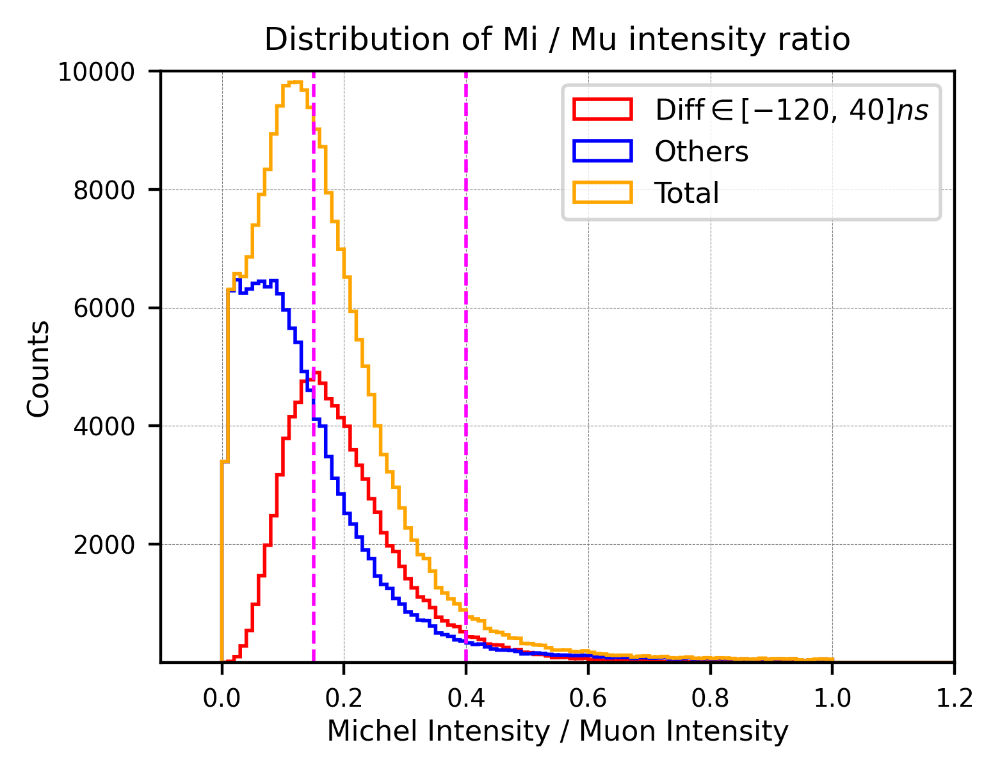

=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===
x=0.005, Ratio=678.8000
x=0.015, Ratio=299.3810
x=0.025, Ratio=64.0891
x=0.035, Ratio=22.0671
x=0.045, Ratio=11.6317
x=0.055, Ratio=6.5163
x=0.065, Ratio=4.3917
x=0.075, Ratio=3.2010
x=0.085, Ratio=2.6001
x=0.095, Ratio=1.9641
x=0.105, Ratio=1.5729
x=0.115, Ratio=1.3593
x=0.125, Ratio=1.2307
x=0.135, Ratio=1.0343
x=0.145, Ratio=0.9630
x=0.155, Ratio=0.8389
x=0.165, Ratio=0.8465
x=0.175, Ratio=0.7804
x=0.185, Ratio=0.7174
x=0.195, Ratio=0.6882
x=0.205, Ratio=0.6310
x=0.215, Ratio=0.6508
x=0.225, Ratio=0.6361
x=0.235, Ratio=0.6135
x=0.245, Ratio=0.6344
x=0.255, Ratio=0.5751
x=0.265, Ratio=0.6018
x=0.275, Ratio=0.6351
x=0.285, Ratio=0.5777
x=0.295, Ratio=0.6073
x=0.305, Ratio=0.6032
x=0.315, Ratio=0.6361
x=0.325, Ratio=0.6462
x=0.335, Ratio=0.6752
x=0.345, Ratio=0.6652
x=0.355, Ratio=0.6519
x=0.365, Ratio=0.6686
x=0.375, Ratio=0.6945
x=0.385, Ratio=0.6295
x=0.395, Ratio=0.6998
x=0.405, Ratio=0.7661
x=0.415, Ratio=0.7179
x=0.425, Ratio=0.7

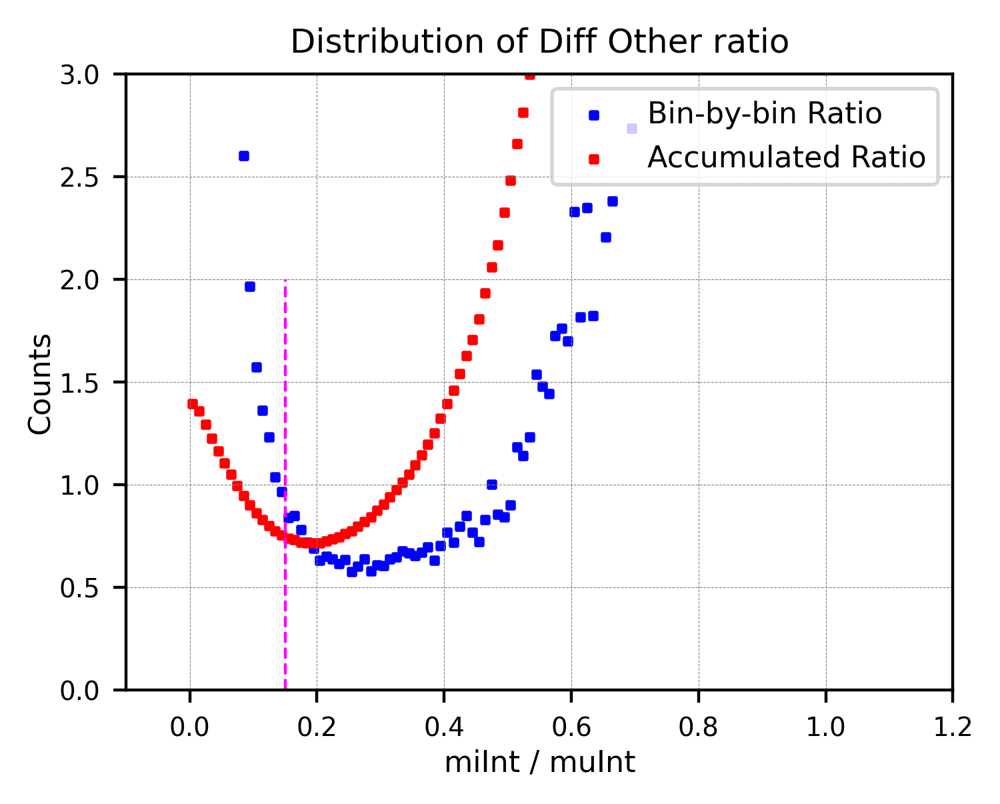

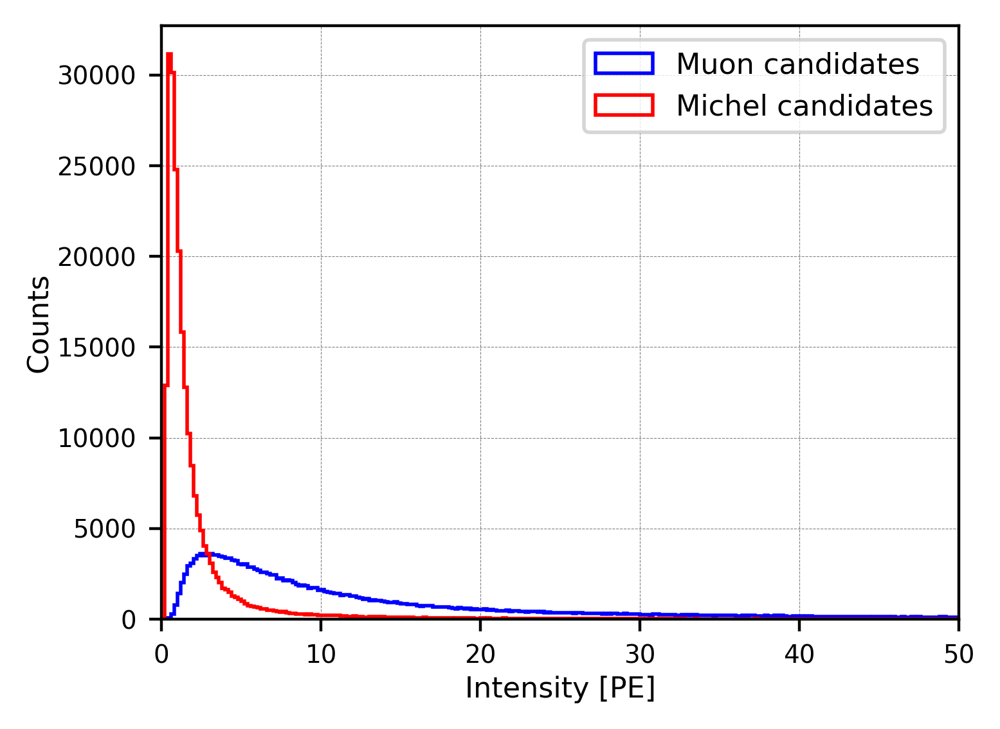

In [15]:
#Ratio distribution===================================
print("\nPurify 4----------------------")

ratio_diff500_purify3 = [mi / mu for mi, mu in zip(miInt_diff500, muInt_diff500) if mu != 0]
ratio_diff0_purify3 = [mi / mu for mi, mu in zip(miInt_diff0, muInt_diff0) if mu != 0]
ratio_total_purify3 = [mi / mu for mi, mu in zip(miInt_total, muInt_total) if mu != 0]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff0_purify3, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(ratio_diff500_purify3, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")
plt.hist(ratio_total_purify3, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='step', linewidth=1.0, label="Total")

plt.plot([0.15, 0.15], [0, 40000], color="magenta", linewidth=1.0, linestyle='--')
plt.plot([0.4, 0.4], [0, 40000], color="magenta", linewidth=1.0, linestyle='--')

plt.xlim(-0.1, 1.2)
plt.xlabel('Michel Intensity / Muon Intensity', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 10000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 







# Bin-by-bin ratio & Accumulated ratio of ratio distribution================

# --- Your original binning ---
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])

hist_diff, _  = np.histogram(ratio_diff0_purify3, bins=bins)
hist_other, _ = np.histogram(ratio_diff500_purify3, bins=bins)

# Avoid division by zero
hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)

ratio_bin = hist_other / hist_diff_safe

# Print bin-by-bin ratios
print("=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator=0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")

cum_diff  = np.cumsum(hist_diff[::-1])[::-1]
cum_other = np.cumsum(hist_other[::-1])[::-1]
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)

plt.figure(figsize=(4,3), dpi=400)

# --- Scatter points: bin-by-bin ratio (blue) ---
plt.scatter(x_centers, ratio_bin, marker='s',
            color='blue', s=3, label="Bin-by-bin Ratio")

# --- Scatter points: accumulated ratio (red) ---
plt.scatter(x_centers, cum_ratio, marker='s',
            color='red', s=3, label="Accumulated Ratio")

plt.plot([0.15, 0.15], [0, 2], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 1.2)
plt.xlabel('miInt / muInt', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
plt.ylim(0.0, 3.0)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Diff Other ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 









#Single Intensities===================================

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.2
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_total, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Muon candidates")
plt.hist(miInt_total, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="Michel candidates")

#plt.plot([1, 1], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([4, 4], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 50)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 30000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 

#### Cut 5: Michel intensity & Muon intensity: 

After cut 4):
Purity (true / reco):  91177 / 98779 (92.30%)

(Diff [-120, 40]:  58600 / 91177 (64.27%)
(Diff Others     :  40179 / 98779 (40.68%)

Michel Intensity Cut (Cut 5):--------------
Efficiency (cut5 / cut4):  59175 / 98779 (59.91%)
Purity (true / reco)    :  54632 / 59175 (92.32%)

(Diff [-120, 40]:  45339 / 54632 (82.99%)
(Diff OTHERS    :  13836 / 59175 (23.38%)


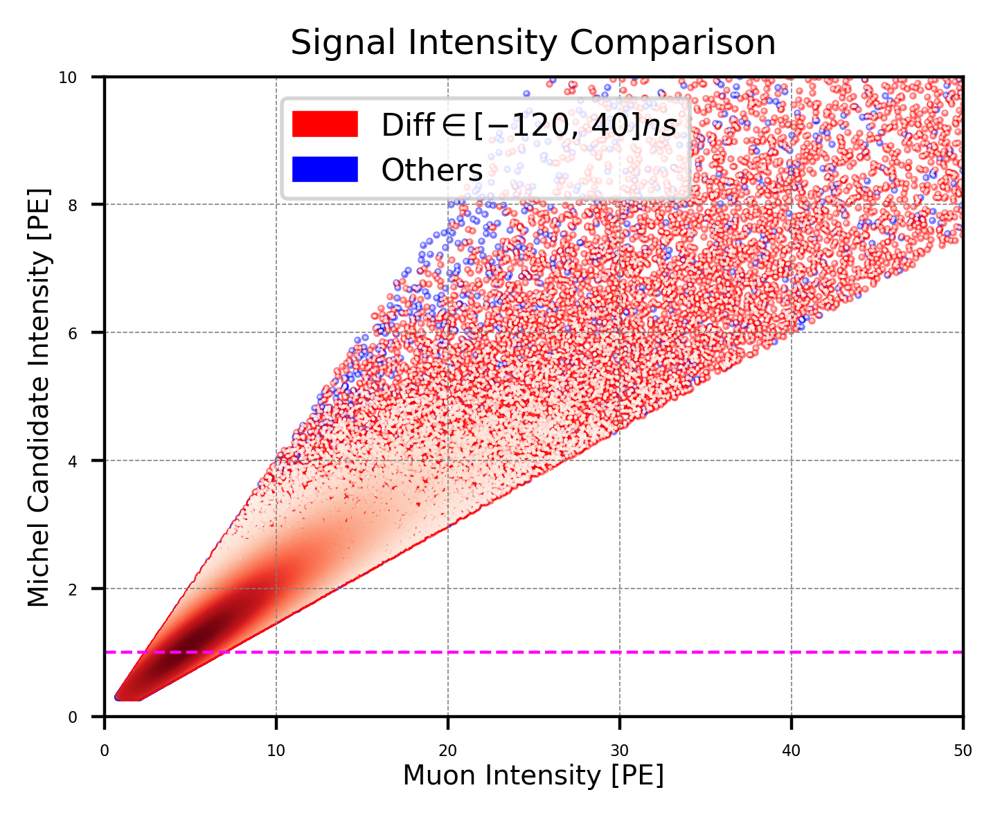


Purify 5----------------------
Saved miInt_Total_purify4_MC.npz 


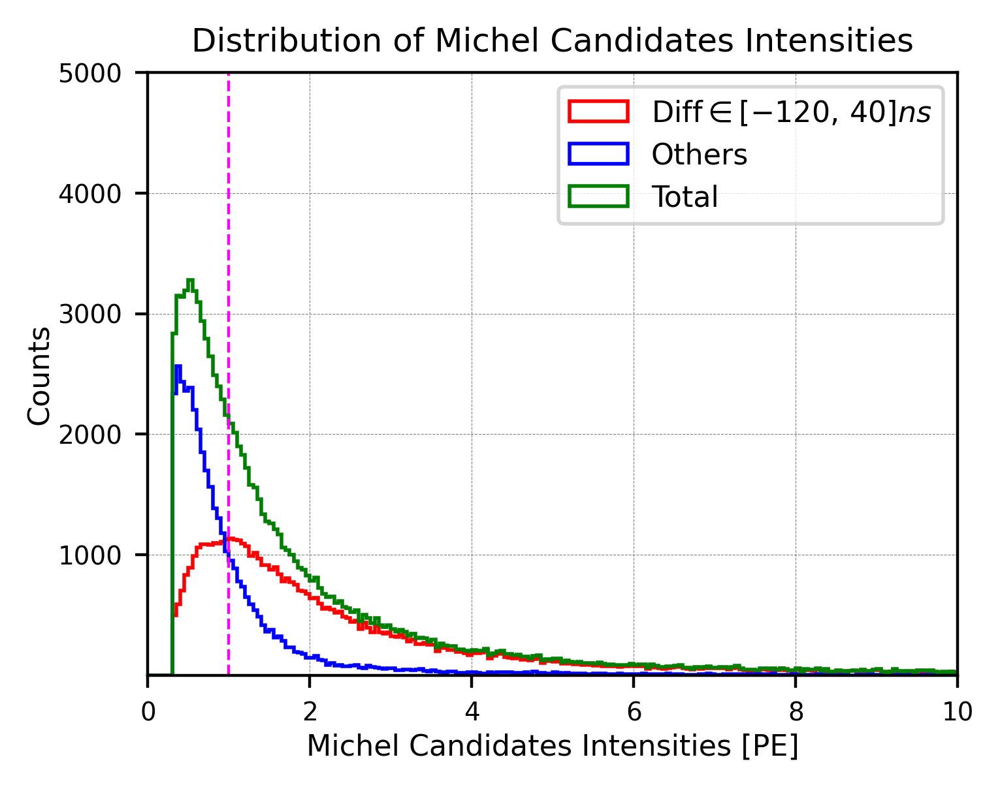

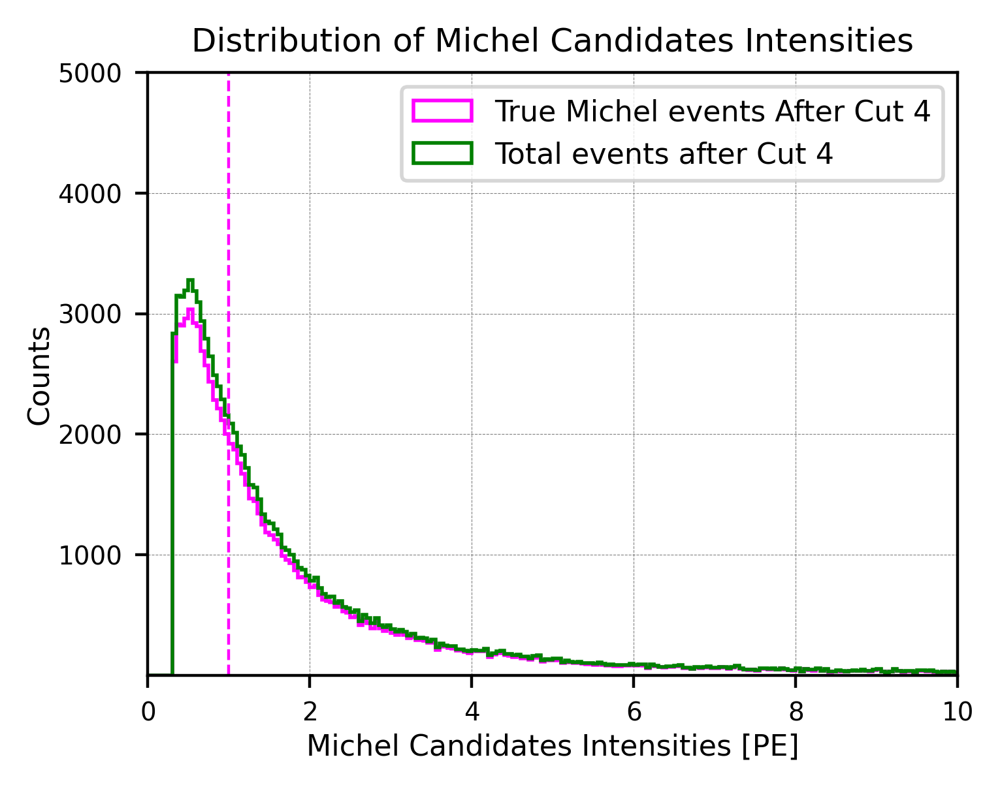

In [16]:
#Michel & Muon Intensities Cut (Cut 5)================================================
print("After cut 4):")

n_valid = sum(1 for ev in events_total_purify4 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_total_purify4),
      "({:.2f}%)".format(n_valid/len(events_total_purify4)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify4), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify4)/n_valid*100))
print("(Diff Others     : ", len(events_diff500_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff500_purify4)/len(events_total_purify4)*100))



thre_muInt = 0.3 # mu Int will automatically higher than mi---
thre_miInt = 1.0

# filter the actual events
events_diff0_purify5 = [
    ev for ev in events_diff0_purify4
    if thre_miInt < ev.michel_intensity and thre_muInt < ev.muon_intensity
]
events_diff500_purify5 = [
    ev for ev in events_diff500_purify4
    if thre_miInt < ev.michel_intensity and thre_muInt < ev.muon_intensity
]
#-------------------------------

print("\nMichel Intensity Cut (Cut 5):--------------")

events_total_purify5 = events_diff0_purify5 + events_diff500_purify5


print("Efficiency (cut5 / cut4): ", len(events_total_purify5), "/", len(events_total_purify4),
      "({:.2f}%)".format(len(events_total_purify5)/len(events_total_purify4)*100))

n_valid = sum(1 for ev in events_total_purify5 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5),
      "({:.2f}%)".format(n_valid/len(events_total_purify5)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify5), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify5)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff500_purify5)/len(events_total_purify5)*100))







# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
muInt_diff500_purify4 = [ev.muon_intensity for ev in events_diff500_purify4]#Events after purification 4---
miInt_diff500_purify4 = [ev.michel_intensity for ev in events_diff500_purify4]

muInt_diff0_purify4 = [ev.muon_intensity for ev in events_diff0_purify4]
miInt_diff0_purify4 = [ev.michel_intensity for ev in events_diff0_purify4]



plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff500_purify4), np.array(miInt_diff500_purify4)
x2, y2 = np.array(muInt_diff0_purify4), np.array(miInt_diff0_purify4)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")

#---------------------------------

plt.plot([0, 100], [1.0, 1.0], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50)
plt.ylim(0, 10)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparison', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
blue_patch = mpatches.Patch(color="blue", label="Others")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()







#Michel Intensity distribution===================================
print("\nPurify 5----------------------")

#miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
#miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]



miInt_Total_purify4 = miInt_diff0_purify4 + miInt_diff500_purify4
np.savez_compressed("miInt_Total_purify4_MC.npz", 
                    events=np.array(miInt_Total_purify4, dtype=object))
print("Saved miInt_Total_purify4_MC.npz ")



plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(miInt_diff0_purify4, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(miInt_diff500_purify4, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")
plt.hist(miInt_Total_purify4, bins=bins, range=(range_min, range_max), edgecolor='green', 
         histtype='step', linewidth=1.0, label="Total")

plt.axvline(x=1.0, color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 10)
plt.xlabel('Michel Candidates Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 3000)
plt.ylim(0.9, 5000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Michel Candidates Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  






#Cut 4 effect on True Michel events=========================
#True Michel events after purification 4---
events_trueM_purify4 = [ev for ev in events_total_purify4 if ev.energy > 0]
miInt_trueM_purify4 = [ev.michel_intensity for ev in events_trueM_purify4]
miInt_Total2_purify4 = [ev.michel_intensity for ev in events_total_purify4]


plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(miInt_trueM_purify4, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=1.0, label="True Michel events After Cut 4")
plt.hist(miInt_Total2_purify4, bins=bins, range=(range_min, range_max), edgecolor='green', 
         histtype='step', linewidth=1.0, label="Total events after Cut 4")

plt.axvline(x=1.0, color='magenta', linestyle='--', linewidth=0.8)

plt.xlim(0, 10)
plt.xlabel('Michel Candidates Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 3000)
plt.ylim(0.9, 5000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Michel Candidates Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  




#### Mu & Michel intensity distributions after Cut 5:

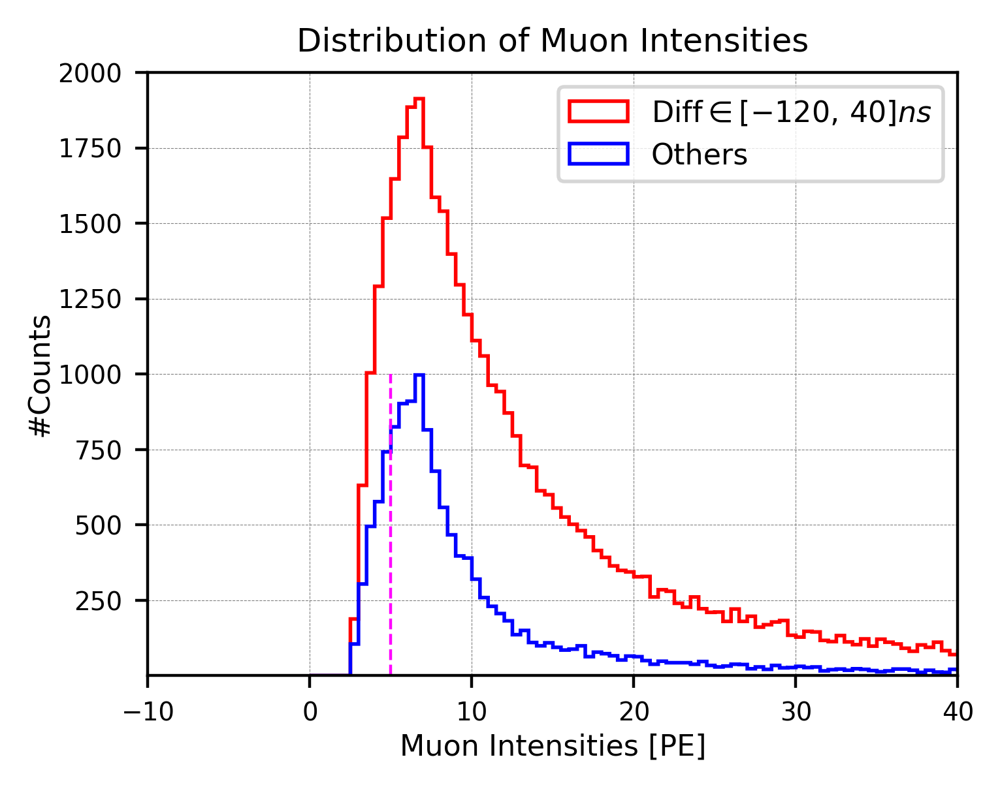

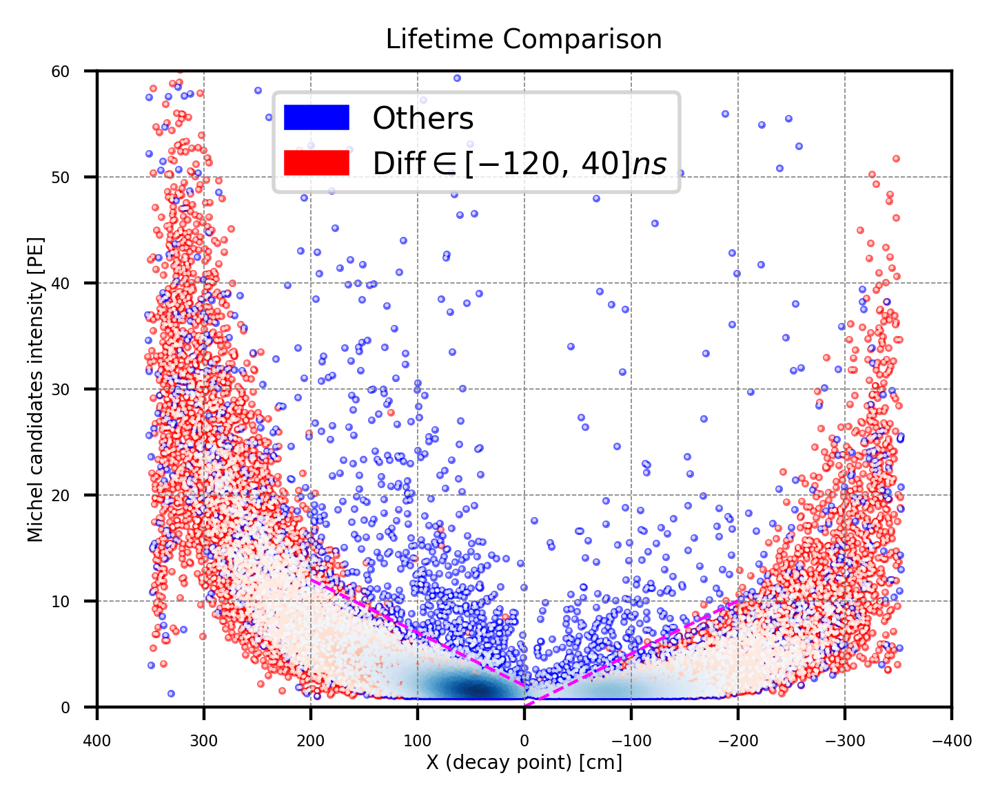

In [17]:
#Muon Intensity distribution===================================

muInt_diff500_purify5 = [ev.muon_intensity for ev in events_diff500_purify5]
muInt_diff0_purify5 = [ev.muon_intensity for ev in events_diff0_purify5]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = 0
range_max = 300
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_diff0_purify5, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(muInt_diff500_purify5, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([5, 5], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-10, 40)
plt.xlabel('Muon Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 2000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Muon Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 





#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_diff500_purify5 = [ev.posX for ev in events_diff500_purify5]
posX_diff0_purify5 = [ev.posX for ev in events_diff0_purify5]
miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]

# Scatter plot----------
# --- Diff<500 (red group) ---
x0 = np.array(posX_diff0_purify5, dtype=float)
y0 = np.array(miInt_diff0_purify5, dtype=float)
xy0 = np.vstack([x0, y0])
z0 = gaussian_kde(xy0)(xy0)

# --- 500<Diff (blue group) ---
x1 = np.array(posX_diff500_purify5, dtype=float)
y1 = np.array(miInt_diff500_purify5, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x0, y0, s=1, color="red", alpha=0.6, label="_nolegend_")
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x0, y0, c=z0, s=1, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [0, 10], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()

#### Cut 5': Michel signal VS Distance cut:

After cut 5:---------
Purity (true / reco)    :  54632 / 59175 (92.32%)

(Diff [-120, 40]:  45339 / 54632 (82.99%)
(Diff OTHERS    :  13836 / 59175 (23.38%)

After Cut 5' (Michel vs Distance):--------------
Efficiency (cut5' / cut5):  57855 / 59175 (97.77%)
Purity (true / reco)    :  53725 / 57855 (92.86%)

(Diff [-120, 40]:  45149 / 53725 (84.04%)
(Diff OTHERS    :  12706 / 57855 (21.96%)


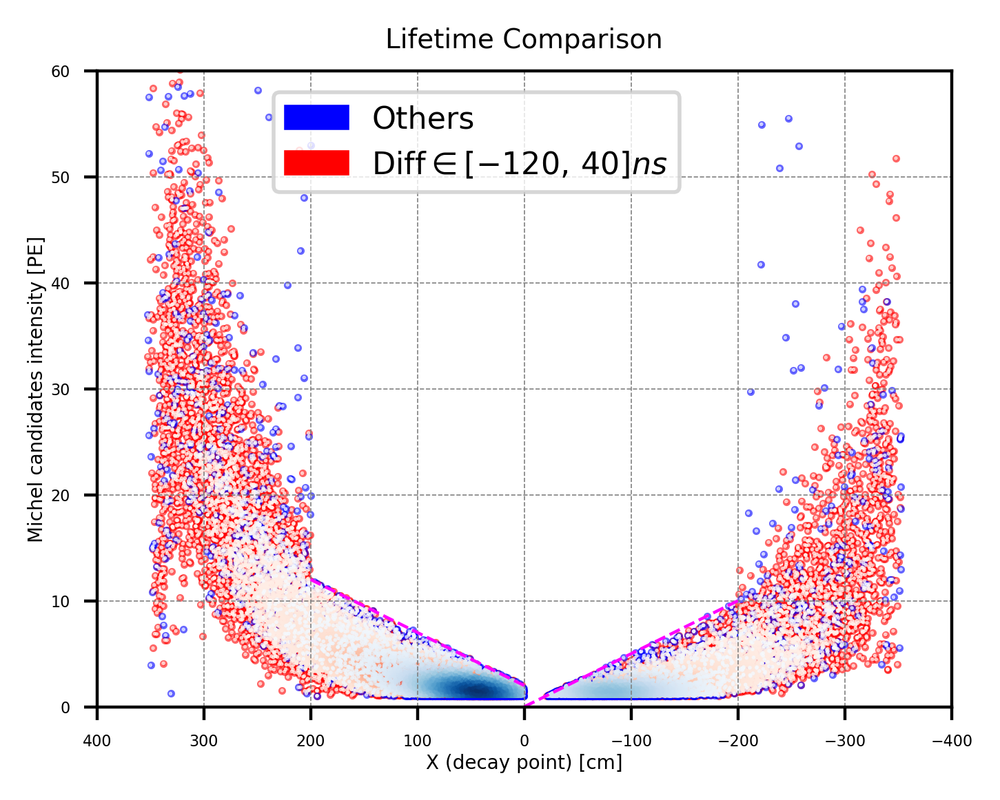

In [18]:
print("After cut 5:---------")

n_valid = sum(1 for ev in events_total_purify5 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5),
      "({:.2f}%)".format(n_valid/len(events_total_purify5)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify5), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify5)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff500_purify5)/len(events_total_purify5)*100))


#Michel Peak rise & drop Cut (Cut 5')--------
# --- Define slopes and intercepts for both cuts ---
slope_pos = (7 - 2) / 100.0      # = 0.05
intercept_pos = 2.0

slope_neg = (10 - 0) / (-200 - 0.0)  # = -0.05
intercept_neg = 0.0

def below_line_cut(ev):
    """Return True if event passes both (posX, michel_intensity) cuts."""
    x = ev.posX
    y = ev.michel_intensity

    # Region 1: positive side [0, 100]
    if 0 <= x <= 200:
        return y <= intercept_pos + slope_pos * x

    # Region 2: negative side [-200, 0]
    elif -200 <= x <= 0:
        return y <= intercept_neg + slope_neg * x

    # Outside both ranges: no cut
    else:
        return True

# --- Apply the geometric cut to both event classes ---
events_diff0_purify5P = [ev for ev in events_diff0_purify5 if below_line_cut(ev)]
events_diff500_purify5P = [ev for ev in events_diff500_purify5 if below_line_cut(ev)]
#-------------------------------





print("\nAfter Cut 5' (Michel vs Distance):--------------")

events_total_purify5P = events_diff0_purify5P + events_diff500_purify5P

print("Efficiency (cut5' / cut5): ", len(events_total_purify5P), "/", len(events_total_purify5),
      "({:.2f}%)".format(len(events_total_purify5P)/len(events_total_purify5)*100))

n_valid = sum(1 for ev in events_total_purify5P if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5P),
      "({:.2f}%)".format(n_valid/len(events_total_purify5P)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify5P), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify5P)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff500_purify5P)/len(events_total_purify5P)*100))






#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_diff500_purify5P = [ev.posX for ev in events_diff500_purify5P]
posX_diff0_purify5P = [ev.posX for ev in events_diff0_purify5P]
miInt_diff500_purify5P = [ev.michel_intensity for ev in events_diff500_purify5P]
miInt_diff0_purify5P = [ev.michel_intensity for ev in events_diff0_purify5P]

# Scatter plot----------
# --- Diff<500 (red group) ---
x0 = np.array(posX_diff0_purify5P, dtype=float)
y0 = np.array(miInt_diff0_purify5P, dtype=float)
xy0 = np.vstack([x0, y0])
z0 = gaussian_kde(xy0)(xy0)

# --- 500<Diff (blue group) ---
x1 = np.array(posX_diff500_purify5P, dtype=float)
y1 = np.array(miInt_diff500_purify5P, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x0, y0, s=1, color="red", alpha=0.6, label="_nolegend_")
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x0, y0, c=z0, s=1, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [0, 10], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#### Cut 6: Michel peak rise and drop slope: 

After cut 5':---------
Purity (true / reco)    :  53725 / 57855 (92.86%)

(Diff [-120, 40]:  45149 / 53725 (84.04%)
(Diff Others    :  12706 / 57855 (21.96%)

Michel Peak Rise Drop Slope (Cut 6):--------------
Efficiency (cut6 / cut5P):  43830 / 57855 (75.76%)
Purity (true / reco)    :  40699 / 43830 (92.86%)

(Diff [-120, 40]:  36136 / 40699 (88.79%)
(Diff OTHERS    :  7694 / 43830 (17.55%)


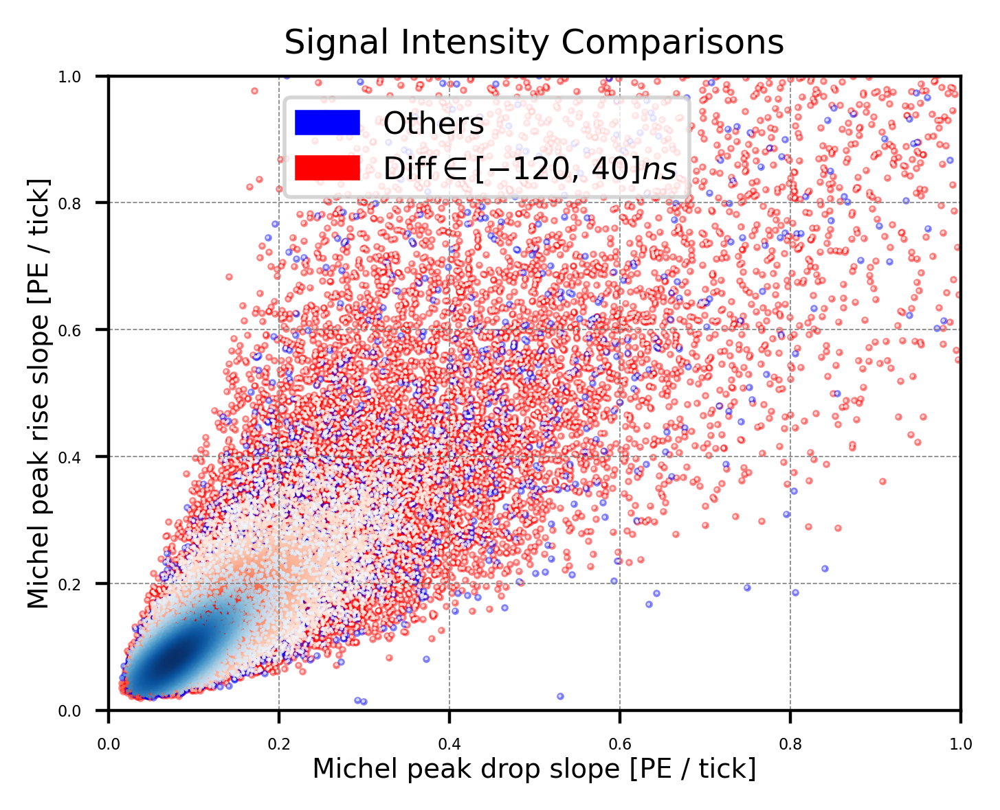

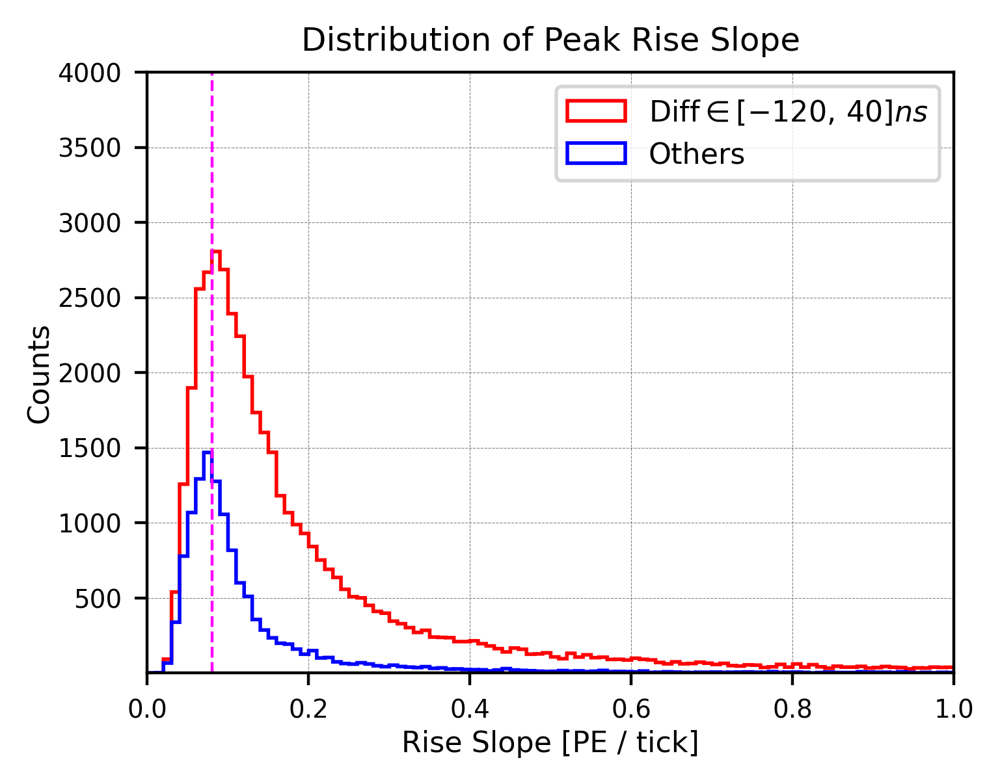

=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===
x=0.005, Ratio=NaN (denominator=0)
x=0.015, Ratio=1.0000
x=0.025, Ratio=0.7174
x=0.035, Ratio=0.6271
x=0.045, Ratio=0.6189
x=0.055, Ratio=0.5627
x=0.065, Ratio=0.5053
x=0.075, Ratio=0.5502
x=0.085, Ratio=0.4547
x=0.095, Ratio=0.3931
x=0.105, Ratio=0.3416
x=0.115, Ratio=0.2676
x=0.125, Ratio=0.2585
x=0.135, Ratio=0.2053
x=0.145, Ratio=0.1786
x=0.155, Ratio=0.1593
x=0.165, Ratio=0.1678
x=0.175, Ratio=0.1799
x=0.185, Ratio=0.1609
x=0.195, Ratio=0.1346
x=0.205, Ratio=0.1770
x=0.215, Ratio=0.1330
x=0.225, Ratio=0.1493
x=0.235, Ratio=0.1164
x=0.245, Ratio=0.1131
x=0.255, Ratio=0.1161
x=0.265, Ratio=0.1360
x=0.275, Ratio=0.1333
x=0.285, Ratio=0.1171
x=0.295, Ratio=0.1055
x=0.305, Ratio=0.1507
x=0.315, Ratio=0.1311
x=0.325, Ratio=0.1291
x=0.335, Ratio=0.1333
x=0.345, Ratio=0.1479
x=0.355, Ratio=0.1297
x=0.365, Ratio=0.1435
x=0.375, Ratio=0.1106
x=0.385, Ratio=0.1292
x=0.395, Ratio=0.1100
x=0.405, Ratio=0.1028
x=0.415, Ratio=0.1077
x=0.425, Rat

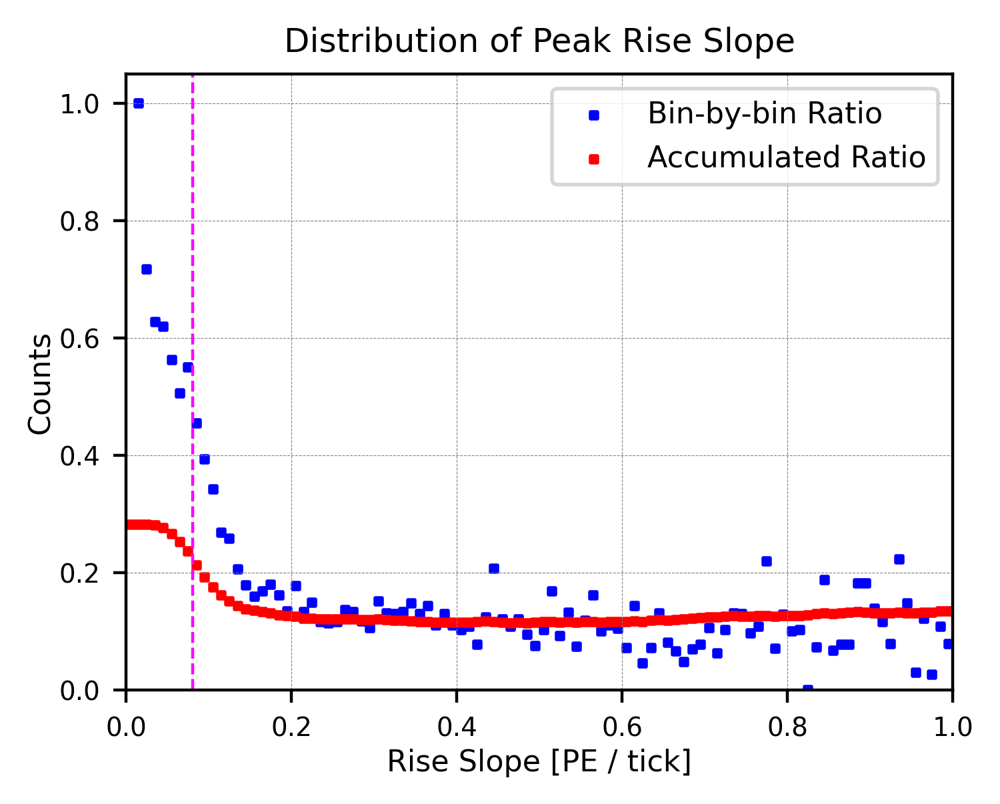

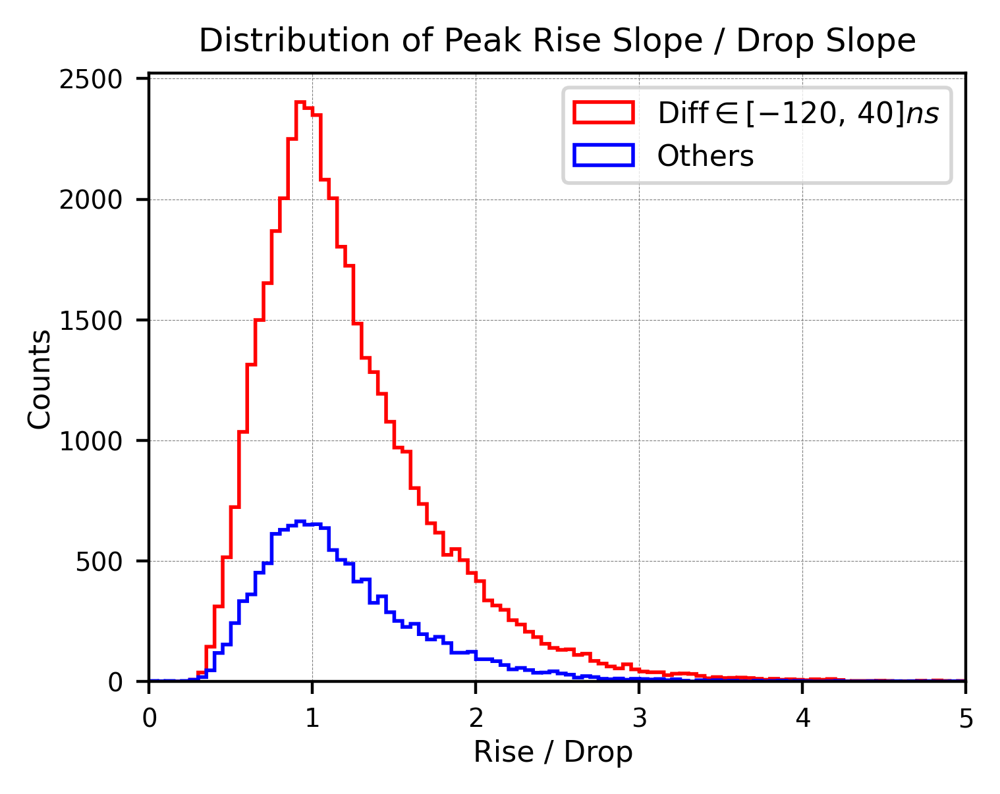

In [19]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 5':---------")

n_valid = sum(1 for ev in events_total_purify5P if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5P),
      "({:.2f}%)".format(n_valid/len(events_total_purify5P)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify5P), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify5P)/n_valid*100))
print("(Diff Others    : ", len(events_diff500_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff500_purify5P)/len(events_total_purify5P)*100))


rise_diff0_purity5P = [ev.michel_rise for ev in events_diff0_purify5P]
drop_diff0_purity5P = [ev.michel_drop for ev in events_diff0_purify5P]

ratios_diff0_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_diff0_purity5P, drop_diff0_purity5P)
]

rise_diff500_purity5P = [ev.michel_rise for ev in events_diff500_purify5P]
drop_diff500_purity5P = [ev.michel_drop for ev in events_diff500_purify5P]

ratios_diff500_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_diff500_purity5P, drop_diff500_purity5P)
]



thre_rise = 0.08 # mu Int will automatically higher than mi---


# filter the actual events
events_diff0_purify6 = [
    ev for ev in events_diff0_purify5P
    if thre_rise < ev.michel_rise
]
events_diff500_purify6 = [
    ev for ev in events_diff500_purify5P
    if thre_rise < ev.michel_rise 
]
#-------------------------------



print("\nMichel Peak Rise Drop Slope (Cut 6):--------------")

events_total_purify6 = events_diff0_purify6 + events_diff500_purify6

print("Efficiency (cut6 / cut5P): ", len(events_total_purify6), "/", len(events_total_purify5P),
      "({:.2f}%)".format(len(events_total_purify6)/len(events_total_purify5P)*100))

n_valid = sum(1 for ev in events_total_purify6 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify6),
      "({:.2f}%)".format(n_valid/len(events_total_purify6)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify6), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify6)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff500_purify6)/len(events_total_purify6)*100))








# ==========================================================
# Michel Rise VS Michel Drop
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(drop_diff500_purity5P), np.array(rise_diff500_purity5P)
x2, y2 = np.array(drop_diff0_purity5P), np.array(rise_diff0_purity5P)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")


#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xlabel('Michel peak drop slope [PE / tick]', labelpad=1, fontsize=7)
plt.ylabel('Michel peak rise slope [PE / tick]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#Michel Rise Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(rise_diff0_purity5P, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(rise_diff500_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.08, 0.08], [0, 4000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 1.0)
plt.xlabel('Rise Slope [PE / tick]', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 4000)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





# Bin-by-bin ratio & Accumulated ratio distribution================


# --- Your original binning ---
bin_width = 0.01
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])

hist_diff, _  = np.histogram(rise_diff0_purity5P, bins=bins)
hist_other, _ = np.histogram(rise_diff500_purity5P, bins=bins)

# Avoid division by zero
hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)

ratio_bin = hist_other / hist_diff_safe

# Print bin-by-bin ratios
print("=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator=0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")

cum_diff  = np.cumsum(hist_diff[::-1])[::-1]
cum_other = np.cumsum(hist_other[::-1])[::-1]
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)

plt.figure(figsize=(4,3), dpi=400)

# --- Scatter points: bin-by-bin ratio (blue) ---
plt.scatter(x_centers, ratio_bin, marker='s',
            color='blue', s=3, label="Bin-by-bin Ratio")

# --- Scatter points: accumulated ratio (red) ---
plt.scatter(x_centers, cum_ratio, marker='s',
            color='red', s=3, label="Accumulated Ratio")

plt.plot([0.08, 0.08], [0, 2], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 1.0)
plt.xlabel('Rise Slope [PE / tick]', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
plt.ylim(0.0, 1.05)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 











#Michel Rise & Drop Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

#plt.hist(drop_diff0_purity1, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
#         histtype='step', linewidth=1.0, label="Drop for Diff0")
#plt.hist(drop_diff500_purity1, bins=bins, range=(range_min, range_max), edgecolor='green', 
#         histtype='step', linewidth=1.0, label="Drop for Diff500")
plt.hist(ratios_diff0_purity5P, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(ratios_diff500_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")


plt.xlim(0, 5)
plt.xlabel('Rise / Drop ', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope / Drop Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 







#Apply Cut======================================




### Cut 7: 2nd 3rd peak intensity diff cut

After cut 6:---------
Purity (true / reco)    :  40699 / 43830 (92.86%)

(Diff [-120, 40]:  36136 / 40699 (88.79%)
(Diff OTHERS    :  7694 / 43830 (17.55%)

Third / Second peak intensity (Cut 7):--------------
Efficiency (cut7 / cut6):  37818 / 43830 (86.28%)
Purity (true / reco)    :  35140 / 37818 (92.92%)

(Diff [-120, 40]:  32407 / 35140 (92.22%)
(Diff OTHERS    :  5411 / 37818 (14.31%)


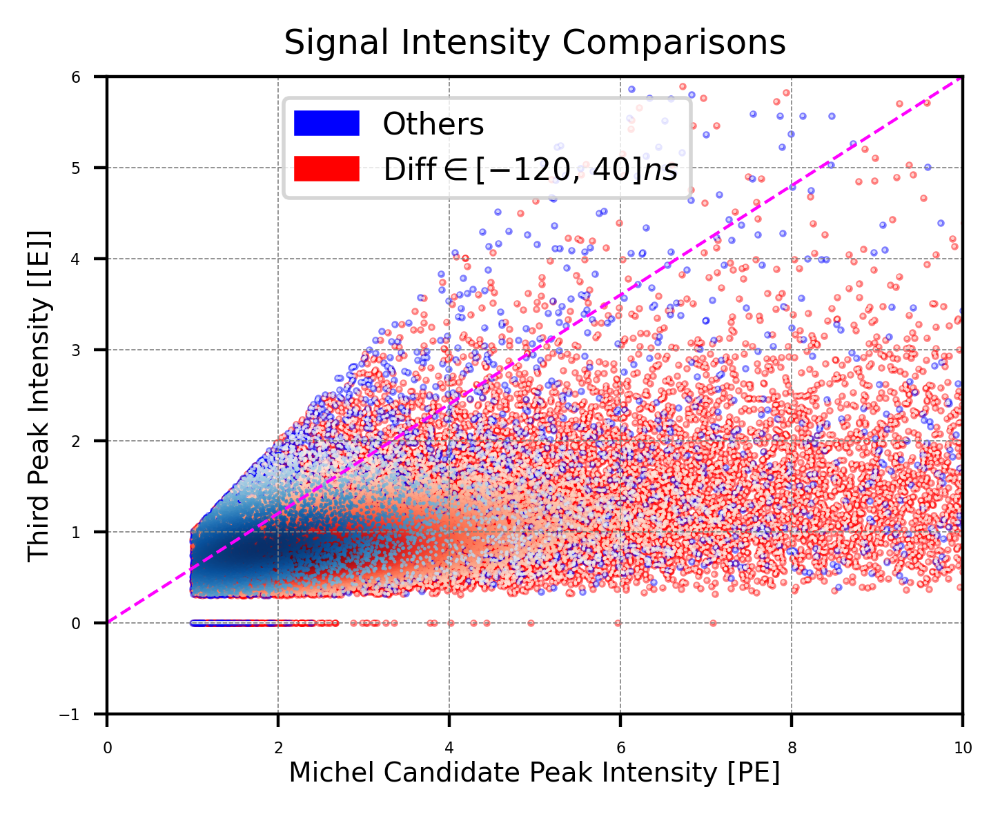

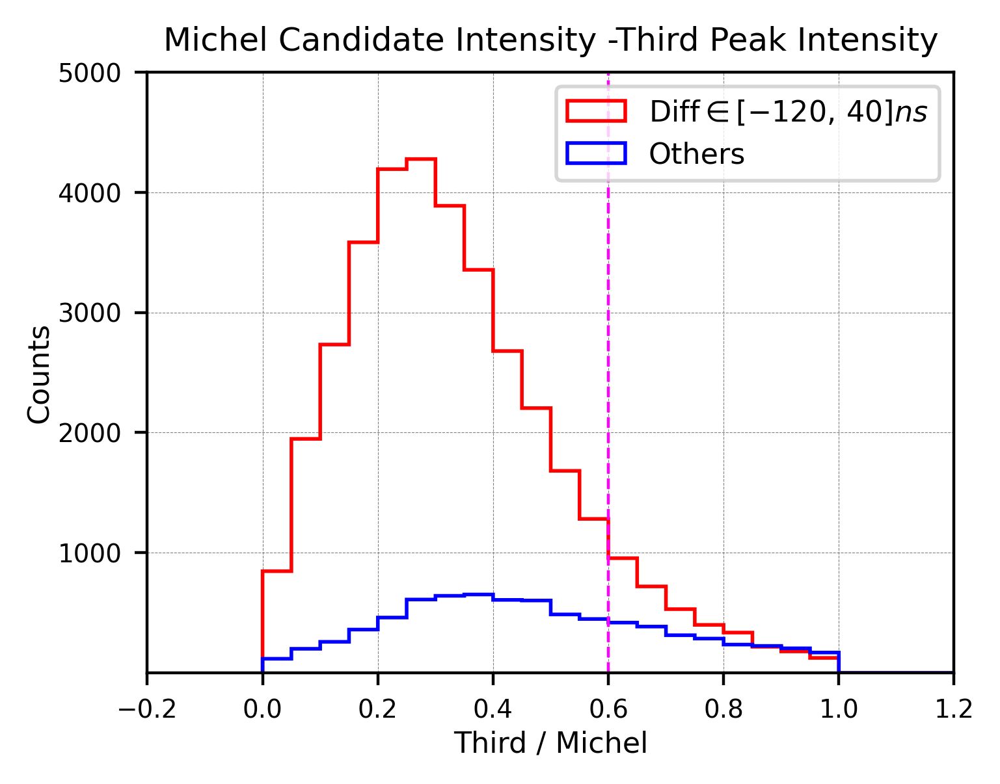

=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===
x=0.025, Ratio=0.1393
x=0.075, Ratio=0.1032
x=0.125, Ratio=0.0948
x=0.175, Ratio=0.1007
x=0.225, Ratio=0.1099
x=0.275, Ratio=0.1429
x=0.325, Ratio=0.1651
x=0.375, Ratio=0.1946
x=0.425, Ratio=0.2270
x=0.475, Ratio=0.2736
x=0.525, Ratio=0.2895
x=0.575, Ratio=0.3502
x=0.625, Ratio=0.4387
x=0.675, Ratio=0.5361
x=0.725, Ratio=0.5913
x=0.775, Ratio=0.7150
x=0.825, Ratio=0.7024
x=0.875, Ratio=1.0321
x=0.925, Ratio=1.1453
x=0.975, Ratio=1.3600
x=1.025, Ratio=NaN (denominator = 0)
x=1.075, Ratio=NaN (denominator = 0)
x=1.125, Ratio=NaN (denominator = 0)
x=1.175, Ratio=NaN (denominator = 0)
x=1.225, Ratio=NaN (denominator = 0)
x=1.275, Ratio=NaN (denominator = 0)
x=1.325, Ratio=NaN (denominator = 0)
x=1.375, Ratio=NaN (denominator = 0)
x=1.425, Ratio=NaN (denominator = 0)
x=1.475, Ratio=NaN (denominator = 0)
x=1.525, Ratio=NaN (denominator = 0)
x=1.575, Ratio=NaN (denominator = 0)
x=1.625, Ratio=NaN (denominator = 0)
x=1.675, Ratio=NaN (denomina

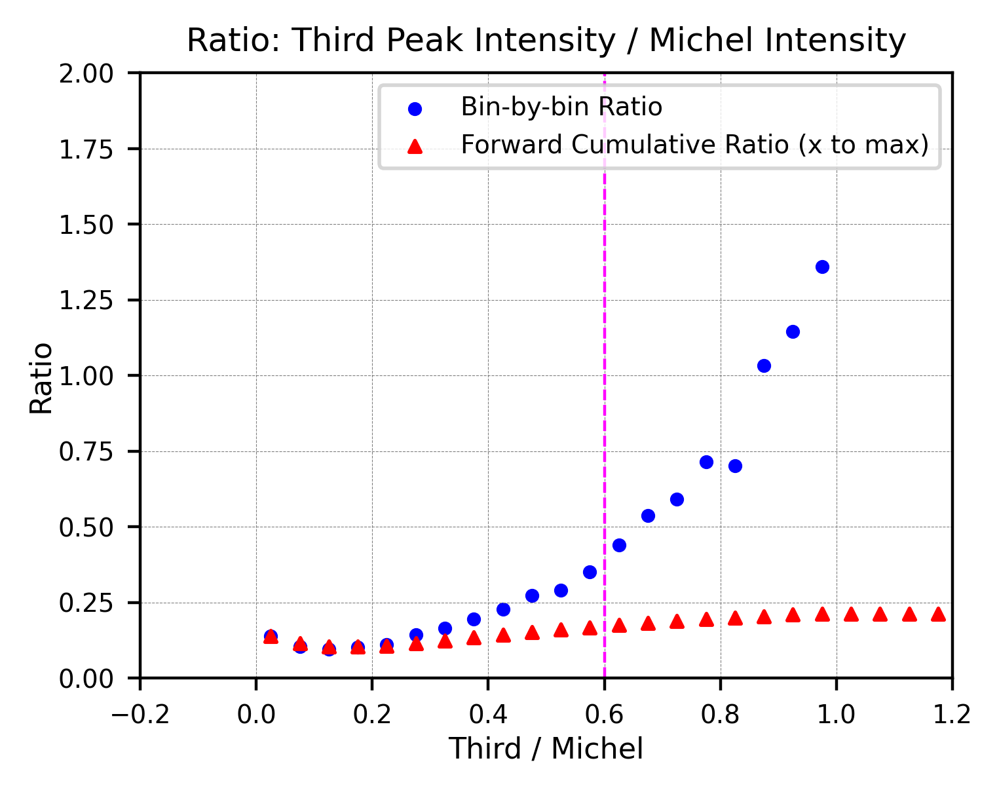

In [20]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 6:---------")

n_valid = sum(1 for ev in events_total_purify6 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify6),
      "({:.2f}%)".format(n_valid/len(events_total_purify6)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify6), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify6)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff500_purify6)/len(events_total_purify6)*100))



miInt_diff0_purity6 = [ev.michel_intensity for ev in events_diff0_purify6]
thInt_diff0_purity6 = [ev.third_intensity for ev in events_diff0_purify6]

miInt_diff500_purity6 = [ev.michel_intensity for ev in events_diff500_purify6]
thInt_diff500_purity6 = [ev.third_intensity for ev in events_diff500_purify6]



# Element-by-element ratio (thInt / miInt)
ratio_diff0_purity6 = [th / mi for th, mi in zip(thInt_diff0_purity6, miInt_diff0_purity6)]
ratio_diff500_purity6 = [th / mi for th, mi in zip(thInt_diff500_purity6, miInt_diff500_purity6)]


thre1 = 0.0
thre2 = 0.6

# filter the actual events
events_diff0_purify7 = [
    ev for ev in events_diff0_purify6
    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
]
events_diff500_purify7 = [
    ev for ev in events_diff500_purify6
    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
]
#-------------------------------


print("\nThird / Second peak intensity (Cut 7):--------------")

events_total_purify7 = events_diff0_purify7 + events_diff500_purify7

print("Efficiency (cut7 / cut6): ", len(events_total_purify7), "/", len(events_total_purify6),
      "({:.2f}%)".format(len(events_total_purify7)/len(events_total_purify6)*100))

n_valid = sum(1 for ev in events_total_purify7 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify7),
      "({:.2f}%)".format(n_valid/len(events_total_purify7)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify7), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify7)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff500_purify7)/len(events_total_purify7)*100))








# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_diff500_purity6), np.array(thInt_diff500_purity6) #(x, y)
x2, y2 = np.array(miInt_diff0_purity6), np.array(thInt_diff0_purity6)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 100], [0, 60], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()






#Third / Michel Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff0_purity6, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(ratio_diff500_purity6, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.6, 0.6], [0, 5000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.2, 1.2)
plt.xlabel('Third / Michel', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 5000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 






# ============================================================
# Ratio Plot for Third/Michel Distributions (scatter only)
# ============================================================


# --- Binning (same as your histogram) ---
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])


hist_diff, _  = np.histogram(ratio_diff0_purity6, bins=bins)
hist_other, _ = np.histogram(ratio_diff500_purity6, bins=bins)

hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)


ratio_bin = hist_other / hist_diff_safe

print("=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator = 0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")



# forward cumulative ratio
cum_diff  = np.cumsum(hist_diff)
cum_other = np.cumsum(hist_other)
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)



plt.figure(figsize=(4,3), dpi=400)

# --- Scatter: bin-by-bin ratio (blue circles) ---
plt.scatter(x_centers, ratio_bin,
            color='blue', s=8, marker='o',
            label="Bin-by-bin Ratio")

# --- Scatter: accumulated ratio (red triangles) ---
plt.scatter(x_centers, cum_ratio,
            color='red', s=10, marker='^',
            label="Forward Cumulative Ratio (x to max)")

plt.plot([0.6, 0.6], [0, 4000], color="magenta", linewidth=0.8, linestyle='--')


plt.xlim(-0.2, 1.2)
plt.ylim(0, 2.0)

plt.xlabel('Third / Michel', labelpad=2, fontsize=8)
plt.ylabel('Ratio', labelpad=1, fontsize=8)

plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.tick_params(labelsize=7)
plt.title('Ratio: Third Peak Intensity / Michel Intensity', fontsize=9)

plt.legend(fontsize=7, loc="upper right")

plt.show()


### Cut 8: Third second peak intensity ratio cut


After Cut 7:--------------
Purity (true / reco)    :  35140 / 37818 (92.92%)

(Diff [-120, 40]:  32407 / 35140 (92.22%)
(Diff OTHERS    :  5411 / 37818 (14.31%)

Michel 3rd Peaks intensity Diff (Cut 8):--------------
Efficiency (cut8 / cut7):  35968 / 37818 (95.11%)
Purity (true / reco)    :  33425 / 35968 (92.93%)

(Diff [-120, 40]:  31148 / 33425 (93.19%)
(Diff OTHERS    :  4820 / 35968 (13.40%)


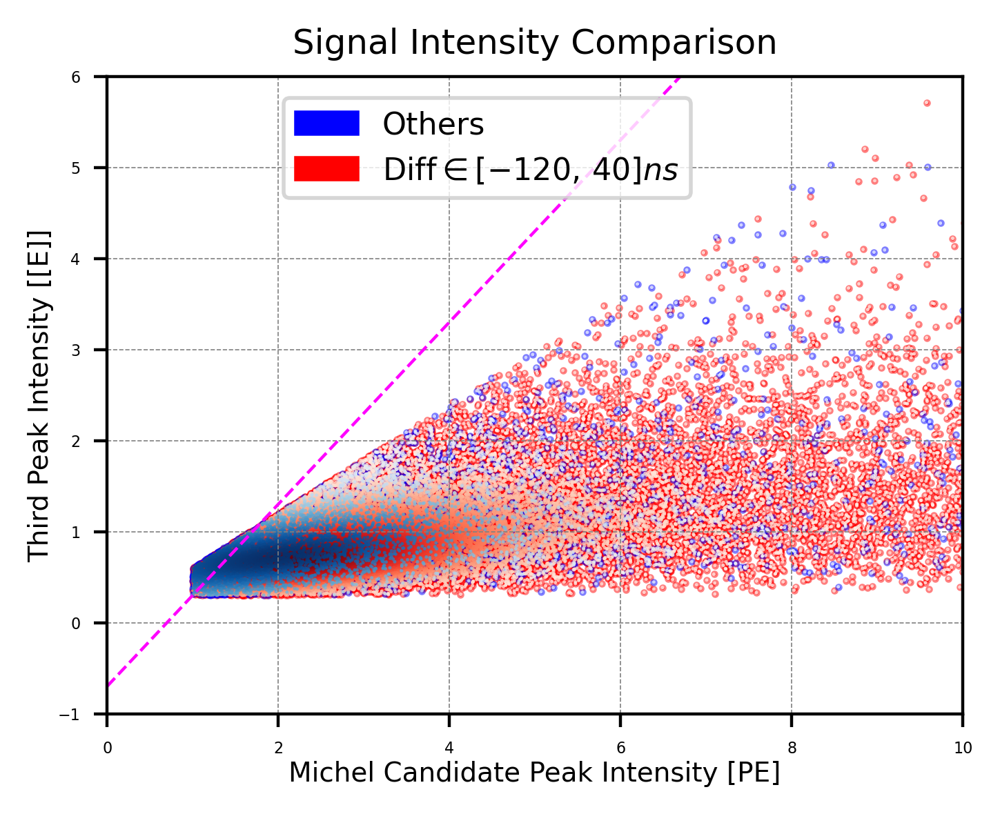

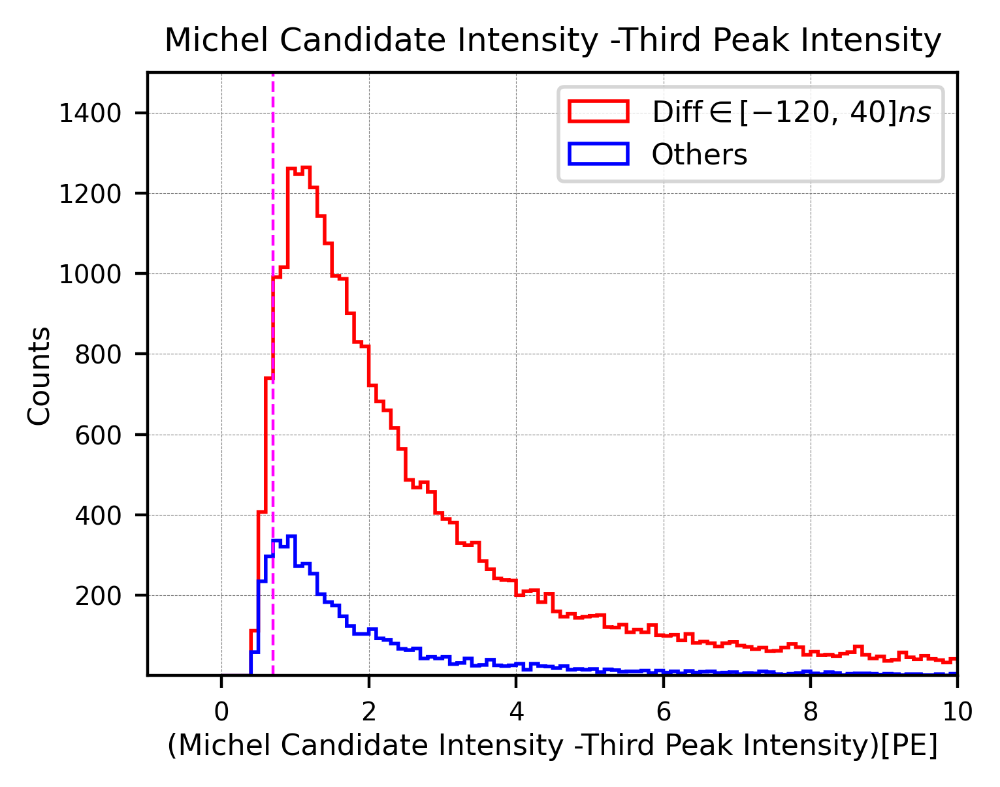

In [21]:
print("\nAfter Cut 7:--------------")

n_valid = sum(1 for ev in events_total_purify7 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify7),
      "({:.2f}%)".format(n_valid/len(events_total_purify7)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify7), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify7)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff500_purify7)/len(events_total_purify7)*100))


miInt_diff0_purity7 = [ev.michel_intensity for ev in events_diff0_purify7]
thInt_diff0_purity7 = [ev.third_intensity for ev in events_diff0_purify7]

miInt_diff500_purity7 = [ev.michel_intensity for ev in events_diff500_purify7]
thInt_diff500_purity7 = [ev.third_intensity for ev in events_diff500_purify7]

# Element-by-element difference (thInt - miInt)
subtract_diff0_purity7 = [mi - th for th, mi in zip(thInt_diff0_purity7, miInt_diff0_purity7)]
subtract_diff500_purity7 = [mi - th for th, mi in zip(thInt_diff500_purity7, miInt_diff500_purity7)]


thre_diff = 0.7

# filter the actual events
events_diff0_purify8 = [
    ev for ev in events_diff0_purify7
    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
]
events_diff500_purify8 = [
    ev for ev in events_diff500_purify7
    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
]
#-------------------------------


print("\nMichel 3rd Peaks intensity Diff (Cut 8):--------------")

events_total_purify8 = events_diff0_purify8 + events_diff500_purify8

print("Efficiency (cut8 / cut7): ", len(events_total_purify8), "/", len(events_total_purify7),
      "({:.2f}%)".format(len(events_total_purify8)/len(events_total_purify7)*100))

n_valid = sum(1 for ev in events_total_purify8 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify8),
      "({:.2f}%)".format(n_valid/len(events_total_purify8)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify8), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify8)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff500_purify8)/len(events_total_purify8)*100))










# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_diff500_purity7), np.array(thInt_diff500_purity7) #(x, y)
x2, y2 = np.array(miInt_diff0_purity7), np.array(thInt_diff0_purity7)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#---------------------------------

plt.plot([0, 10], [-0.7, 9.3], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparison', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()









#(Michel Candidate Intensity -Third Peak Intensity) Distributions====================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.1
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(subtract_diff0_purity7, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(subtract_diff500_purity7, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.7, 0.7], [0, 1500], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-1, 10)
plt.xlabel('(Michel Candidate Intensity -Third Peak Intensity)[PE]', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 1500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  

### Cut 9: Space Cut along drift direction


After Cut 8:--------------
Purity (true / reco)    :  33425 / 35968 (92.93%)

(Diff [-120, 40]:  31148 / 33425 (93.19%)
(Diff OTHERS    :  4820 / 35968 (13.40%)

Drift Direction Cut (Cut 9):--------------
Efficiency (cut9 / cut8):  33532 / 35968 (93.23%)
Purity (true / reco)    :  31278 / 33532 (93.28%)

(Diff [-120, 40]:  29511 / 31278 (94.35%)
(Diff OTHERS    :  4021 / 33532 (11.99%)

Decay points distribution: 


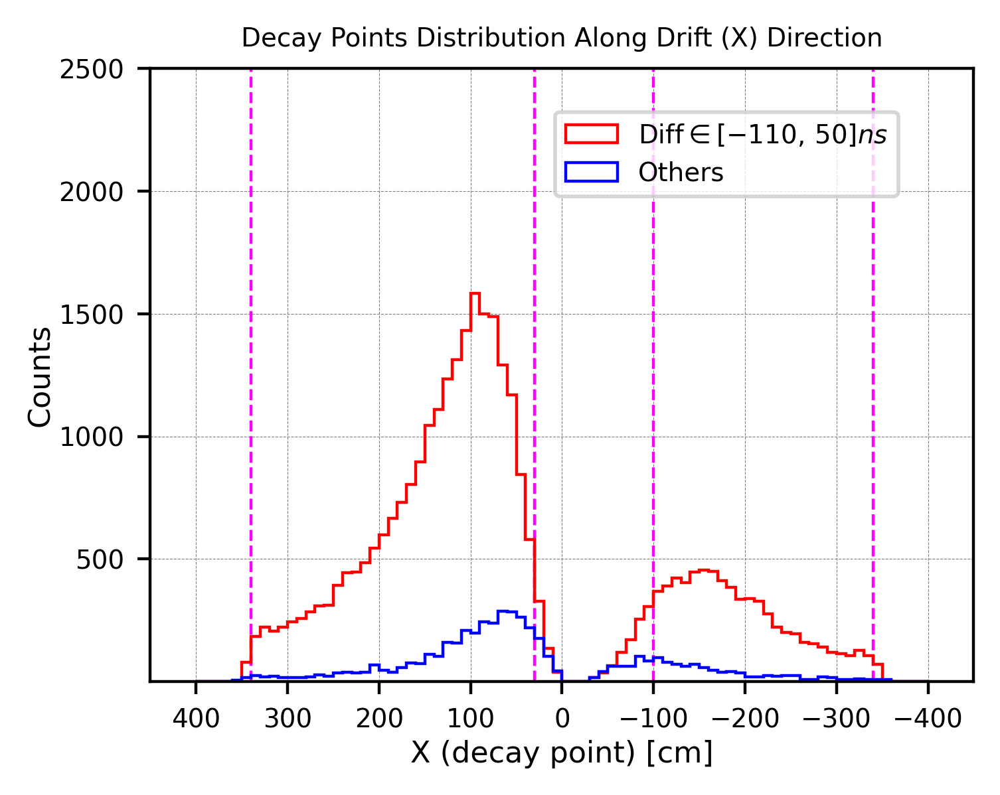

In [22]:
print("\nAfter Cut 8:--------------")

n_valid = sum(1 for ev in events_total_purify8 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify8),
      "({:.2f}%)".format(n_valid/len(events_total_purify8)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify8), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify8)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff500_purify8)/len(events_total_purify8)*100))





posX_cut1 = 30
posX_cut2 = 340
negX_cut1 = -100
negX_cut2 = -340

# filter the actual events
events_diff0_purify9 = [
    ev for ev in events_diff0_purify8
    if posX_cut1 < ev.posX < posX_cut2 or negX_cut2 < ev.posX < negX_cut1
]
events_diff500_purify9 = [
    ev for ev in events_diff500_purify8
    if posX_cut1 < ev.posX < posX_cut2 or negX_cut2 < ev.posX < negX_cut1
]
#-------------------------------


print("\nDrift Direction Cut (Cut 9):--------------")

events_total_purify9 = events_diff0_purify9 + events_diff500_purify9

print("Efficiency (cut9 / cut8): ", len(events_total_purify9), "/", len(events_total_purify8),
      "({:.2f}%)".format(len(events_total_purify9)/len(events_total_purify8)*100))

n_valid = sum(1 for ev in events_total_purify9 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify9),
      "({:.2f}%)".format(n_valid/len(events_total_purify9)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify9), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify9)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify9), "/", len(events_total_purify9),
       "({:.2f}%)".format(len(events_diff500_purify9)/len(events_total_purify9)*100))









posX_diff500_purify8 = [ev.posX for ev in events_diff500_purify8]

posX_diff0_purify8 = [ev.posX for ev in events_diff0_purify8]

posX_total_purify8 = posX_diff500_purify8 + posX_diff0_purify8


#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
#plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
#plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([30, 30], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-100, -100], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([340, 340], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-340, -340], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify8, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(posX_diff500_purify8, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#plt.hist(posX_total_purify8, bins=bins, range=(range_min, range_max), edgecolor='orange', 
#          histtype='step', linewidth=0.8, label="Total")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel('X (decay point) [cm]', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 2500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (X) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  





Decay points distribution: 


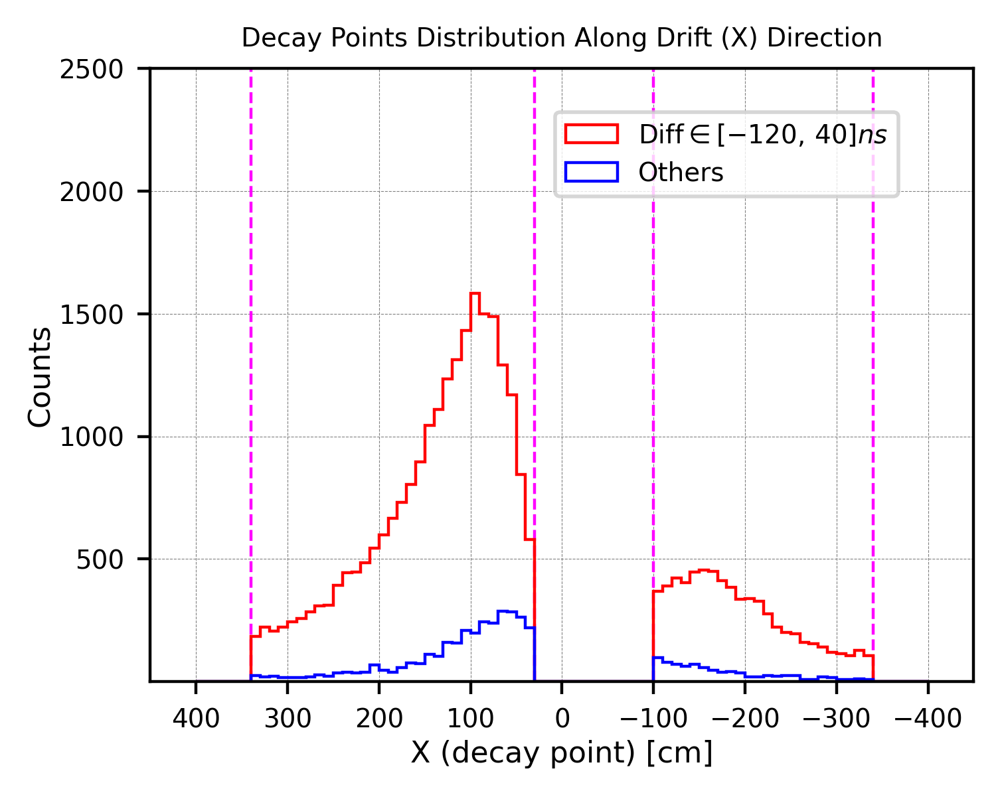

In [23]:
posX_diff500_purify9 = [ev.posX for ev in events_diff500_purify9]

posX_diff0_purify9 = [ev.posX for ev in events_diff0_purify9]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
#plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
#plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([30, 30], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-100, -100], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([340, 340], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-340, -340], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(posX_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel('X (decay point) [cm]', labelpad=2, fontsize=8)
plt.ylabel('Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 2500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (X) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  

<br />

### Explore Validaty of $-120<Diff<40$ [ns] standard: 

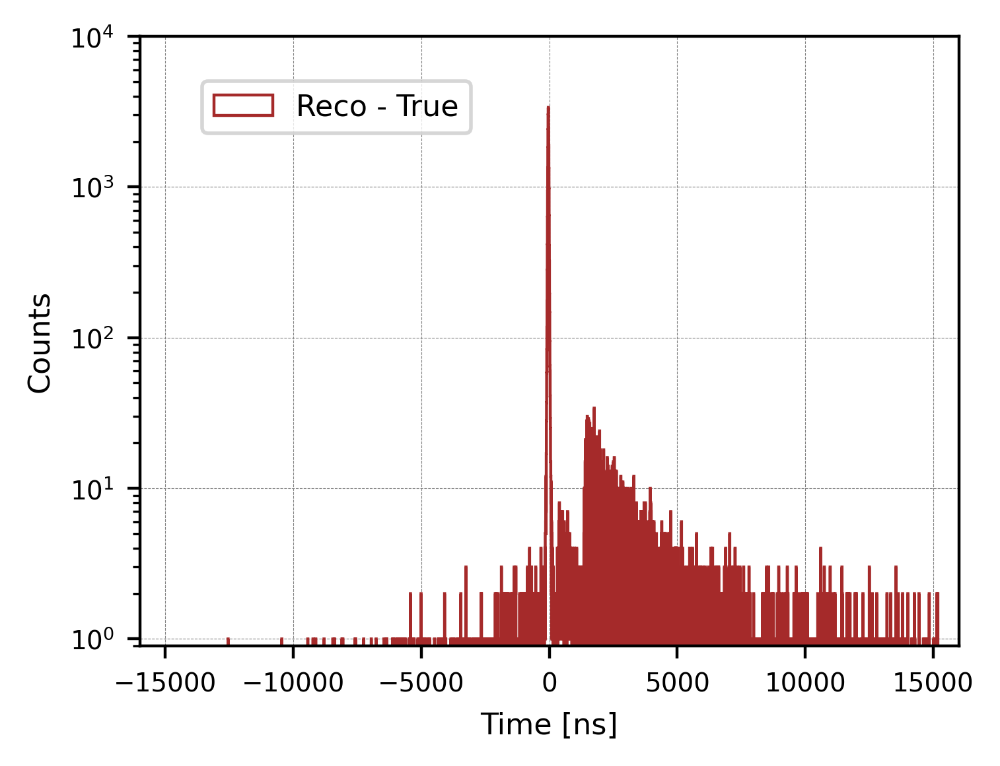

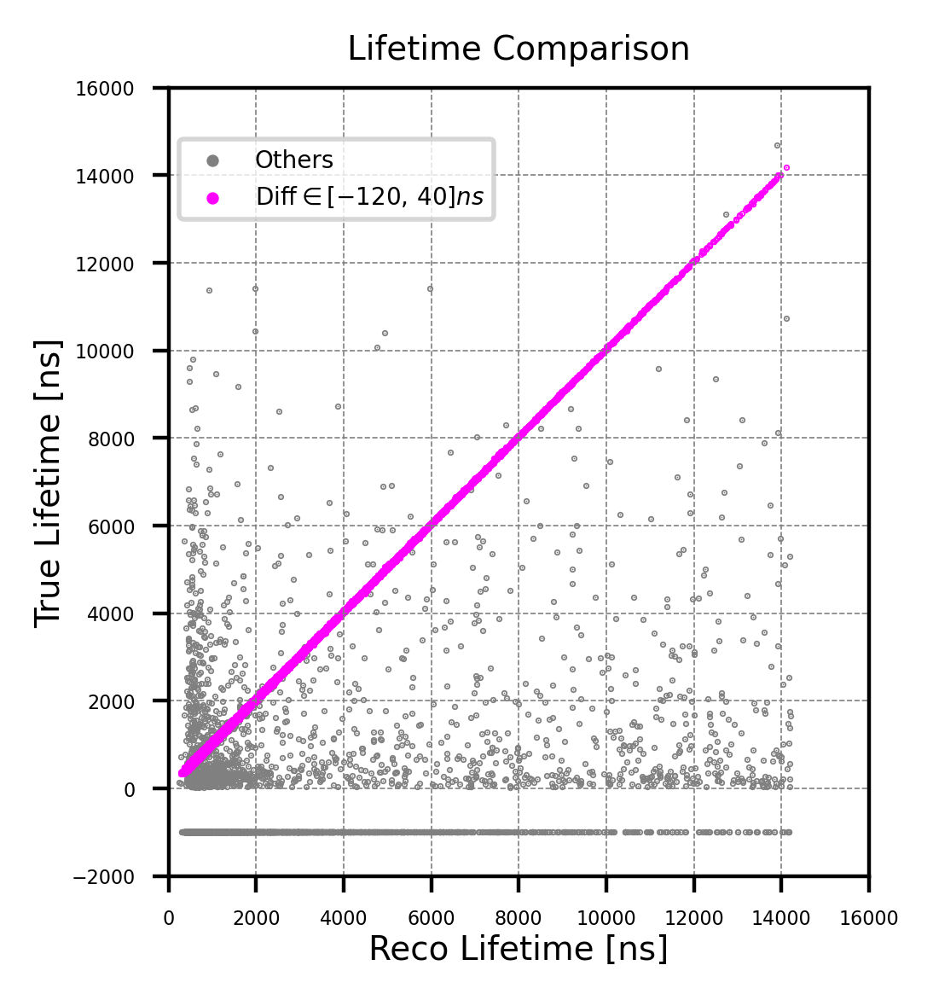

In [24]:
#The final dataset: events_diff500_purify9

diffTime_diff500_purify9 = [ev.diff_lifetime for ev in events_diff500_purify9]
trueTime_diff500_purify9 = [ev.true_lifetime for ev in events_diff500_purify9]
recoTime_diff500_purify9 = [ev.reco_lifetime for ev in events_diff500_purify9]

#Group of diff<500
diffTime_diff0_purify9 = [ev.diff_lifetime for ev in events_diff0_purify9]
trueTime_diff0_purify9 = [ev.true_lifetime for ev in events_diff0_purify9]
recoTime_diff0_purify9 = [ev.reco_lifetime for ev in events_diff0_purify9]

events_total_purify9 = events_diff0_purify9 + events_diff500_purify9
diffTime_total_purify9 = diffTime_diff500_purify9 + diffTime_diff0_purify9

#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 5
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(diffTime_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

#plt.plot([-40, -40], [0, 30000], color="red", linewidth=1.1, linestyle='--')
#plt.plot([-120, -120], [0, 30000], color="blue", linewidth=1.1, linestyle='--')
#plt.plot([40, 40], [0, 30000], color="blue", linewidth=1.1, linestyle='--')

#plt.xlim(-500, 500)
plt.xlim(-16000, 16000)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()







# ==========================================================
# TrueLife VS RecoLife
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(recoTime_diff500_purify9, trueTime_diff500_purify9, s=0.1, c='grey', alpha=1.0, label="Others")
plt.scatter(recoTime_diff0_purify9, trueTime_diff0_purify9, s=0.1, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#-----------------------

plt.axis('scaled')
plt.xlim(0, 16000)
plt.ylim(-2000, 16000)
plt.ylabel('True Lifetime [ns]', labelpad=1, fontsize=7)
plt.xlabel('Reco Lifetime [ns]', labelpad=1, fontsize=7)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=6, markerscale=5, ncol=1, prop={'size':5})
plt.show()





<br />

#### Single Event Inspection:

In [25]:
# "Signal"
for ev in events_diff0_purify9:
    if ev.diff_lifetime < -96:
        print(ev)

print("\n--------------------")
for i, ev in enumerate(events_diff0_purify9[:100]):
    print(f"Event {i}: {ev}")



# "Background"
print("\n\n=======================================")
for i, ev in enumerate(events_diff500_purify9[:100]):
    print(f"Event {i}: {ev}")



PdsEventNew(muon_time=127, michel_time=217, muon_intensity=10.8953, michel_intensity=2.85155, third_intensity=0.472496, posX=-127.971, posY=219.988, posZ=306.532, energy=50.641, lifetime=1.5464, pdg=-11, eventID=1048, trackID=1, date=20250627, michel_score=0.978584, michel_hits=14, reco_lifetime=1440, true_lifetime=1546.4, diff_lifetime=-106.40000000000009, michel_rise=0.13366521739130435, michel_drop=0.15008157894736843)
PdsEventNew(muon_time=127, michel_time=166, muon_intensity=16.0529, michel_intensity=2.48326, third_intensity=1.1629, posX=153.105, posY=328.597, posZ=384.036, energy=26.3369, lifetime=0.736098, pdg=11, eventID=564, trackID=0, date=20250627, michel_score=0.728111, michel_hits=18, reco_lifetime=624, true_lifetime=736.0980000000001, diff_lifetime=-112.09800000000007, michel_rise=0.15520375, michel_drop=0.1517242105263158)
PdsEventNew(muon_time=127, michel_time=156, muon_intensity=12.6038, michel_intensity=2.1444, third_intensity=0.862888, posX=77.3057, posY=307.842, pos

<br />
<br />
<br />
<br />

### Features of FINAL dataset (after purification 9):

In [26]:
events_total_purify9 = events_diff500_purify9 + events_diff0_purify9

events_pM_purify9 = []#e^+---
events_nM_purify9 = []

for i in range(0, len(events_total_purify9)):
    pdg = events_total_purify9[i].pdg

    if pdg < 0:
        events_pM_purify9.append(events_total_purify9[i])

    elif pdg > 0:
        events_nM_purify9.append(events_total_purify9[i])



print("\nMichel e^+: ", len(events_pM_purify9), "/", len(events_total_purify9), 
      "({:.2f}%)".format(len(events_pM_purify9)/len(events_total_purify9)*100))
print("Michel e^-: ", len(events_nM_purify9), "/", len(events_total_purify9), 
      "({:.2f}%)".format(len(events_nM_purify9)/len(events_total_purify9)*100))

print("\n#e^+ / #e^-: ", len(events_pM_purify9), "/", len(events_nM_purify9), 
      "({:.2f}%)".format(len(events_pM_purify9)/len(events_nM_purify9)*100))

print("Comment [20260415]: the ratio change (4.6 -> 7.5) might be important; We have less e^- events left")


Michel e^+:  27540 / 33532 (82.13%)
Michel e^-:  3738 / 33532 (11.15%)

#e^+ / #e^-:  27540 / 3738 (736.76%)
Comment [20260415]: the ratio change (4.6 -> 7.5) might be important; We have less e^- events left



Decay points distribution: 


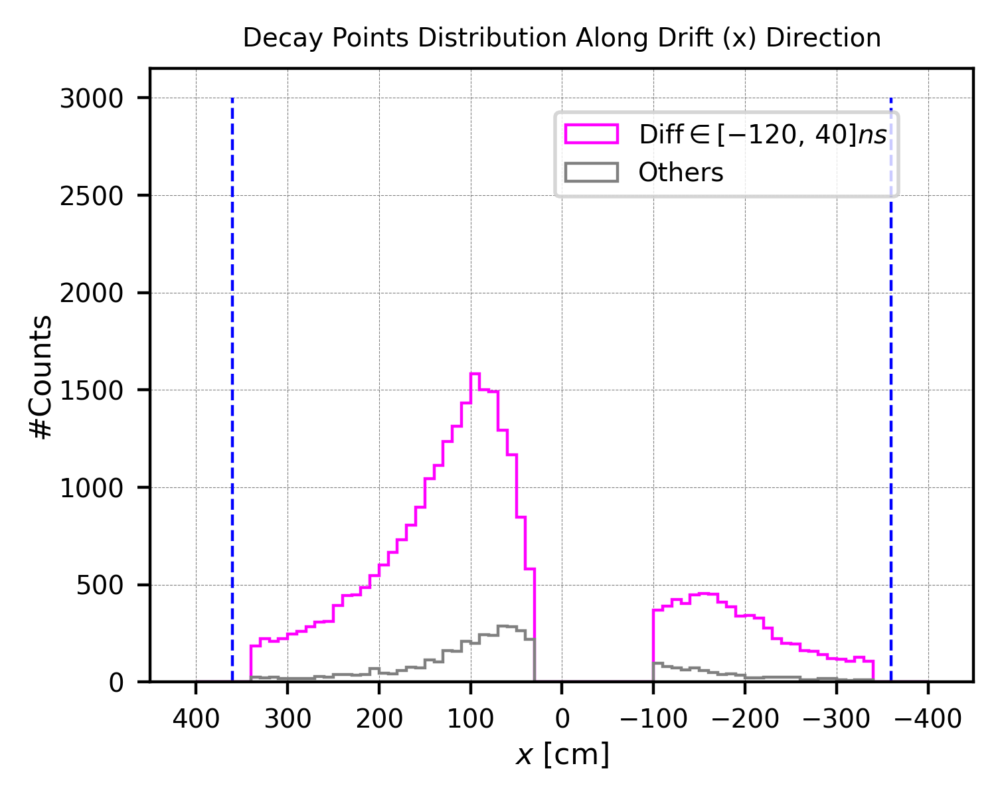

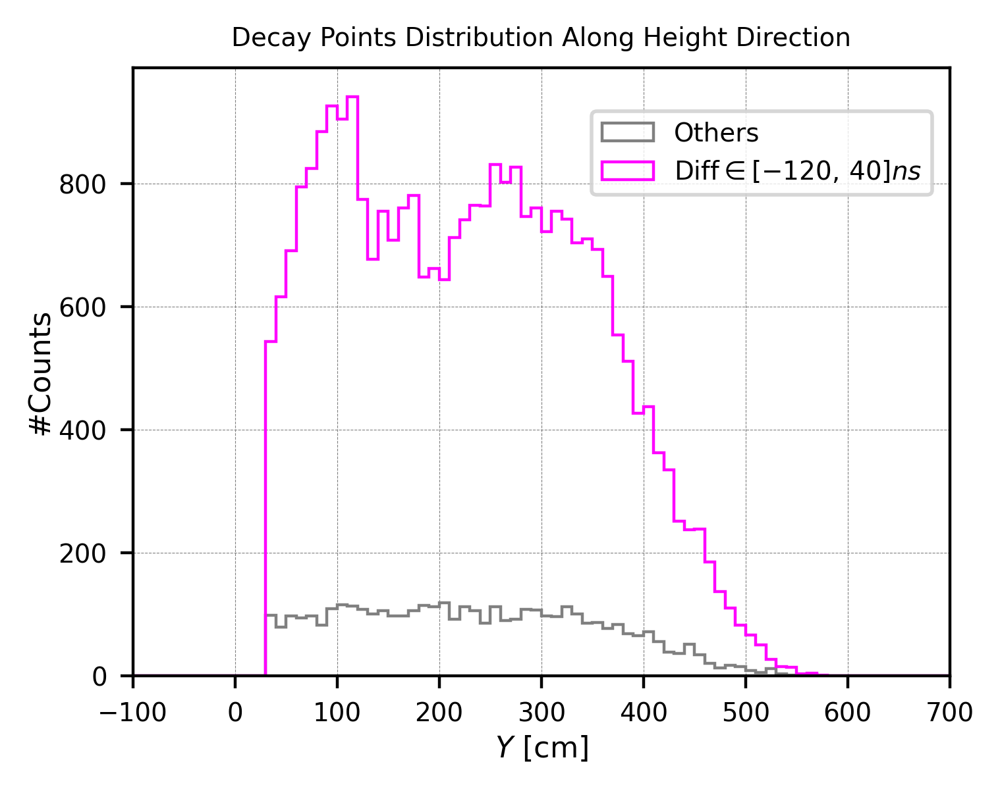

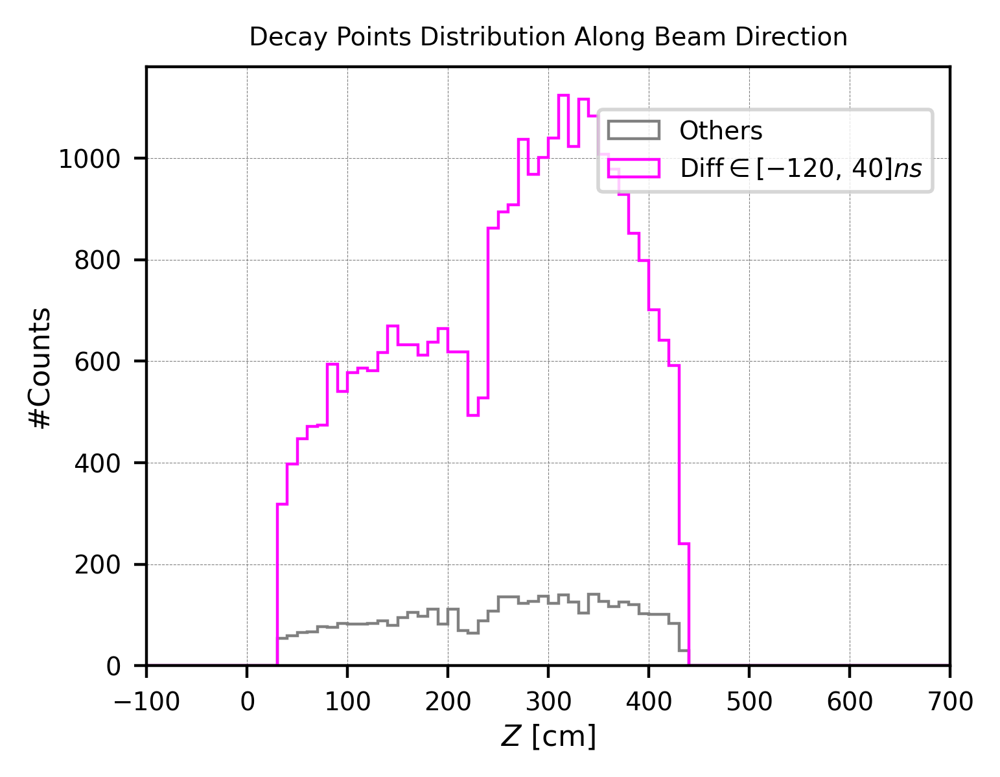

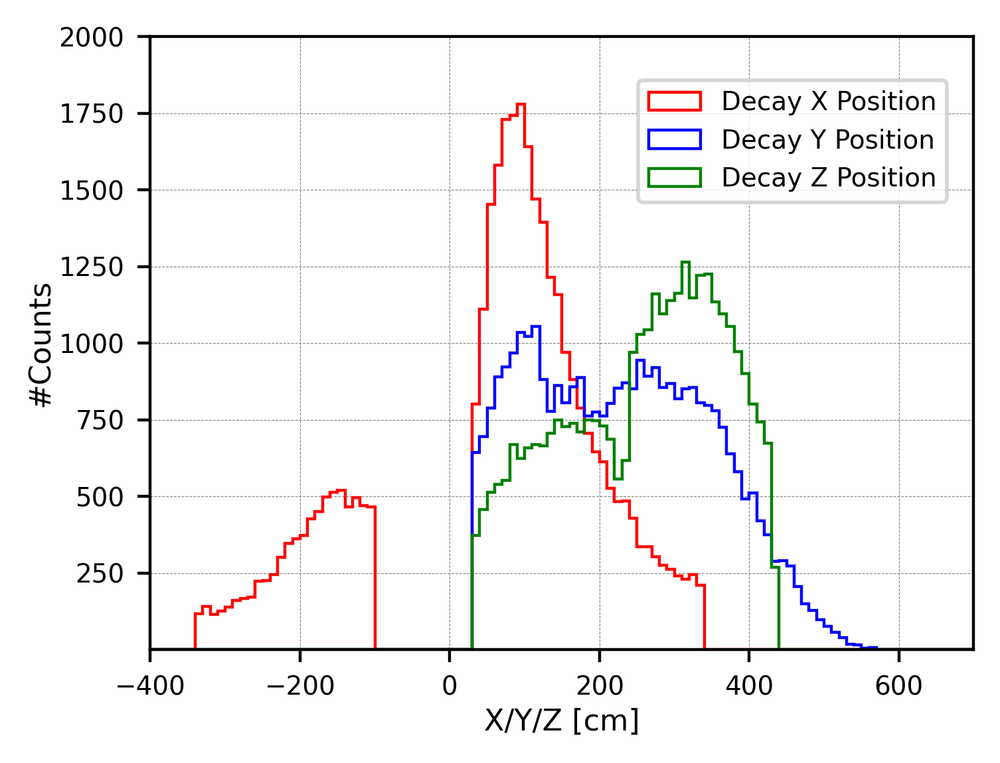

In [60]:

posX_diff500_purify9 = [ev.posX for ev in events_diff500_purify9]
posY_diff500_purify9 = [ev.posY for ev in events_diff500_purify9]
posZ_diff500_purify9 = [ev.posZ for ev in events_diff500_purify9]

posX_diff0_purify9 = [ev.posX for ev in events_diff0_purify9]
posY_diff0_purify9 = [ev.posY for ev in events_diff0_purify9]
posZ_diff0_purify9 = [ev.posZ for ev in events_diff0_purify9]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(posX_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.9, 500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Y distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posY_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
plt.hist(posY_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Y$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Height Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posZ_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
plt.hist(posZ_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Z$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 









#X/Y/Z in one plotting:==========================================
posX_total_purify9 = posX_diff500_purify9 + posX_diff0_purify9
posY_total_purify9 = posY_diff500_purify9 + posY_diff0_purify9
posZ_total_purify9 = posZ_diff500_purify9 + posZ_diff0_purify9

# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label="Decay X Position")
plt.hist(posY_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Decay Y Position")
plt.hist(posZ_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='green', 
          histtype='step', linewidth=0.8, label="Decay Z Position")
#--------------------------------

plt.xlim(-400, 700)
plt.xlabel('X/Y/Z [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.1, 2000)
#plt.yscale('log')
#plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.78, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 











# Set the limits of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

# Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


# ==========================================================
# Y–X plane plotting (Front View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line for field cage
# aux2 = [0, 610, 610, 0, 0]
# aux1 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posX_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posX_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posX_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posX_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posX_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(xmin, xmax)
# plt.ylim(-50, 660)
# plt.gca().invert_xaxis()  # Flip x-axis
# plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Front View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()


# ==========================================================
# Z–X plane plotting (Top View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux1 = [0, 465, 465, 0, 0]
# aux2 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posX_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posX_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posX_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posX_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posX_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.ylim(xmin, xmax)
# plt.xlim(-50, 515)
# plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.title('Top View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()




# ==========================================================
# Y–Z plane plotting (Side View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux2 = [cageMinY, cageMaxY, cageMaxY, cageMinY, cageMinY]
# aux1 = [cageMinZ, cageMinZ, cageMaxZ, cageMaxZ, cageMinZ]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(-50, 515)
# plt.ylim(-50, 660)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Side View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()


#### Energy and Reco Hits:


Energy Distribution: 


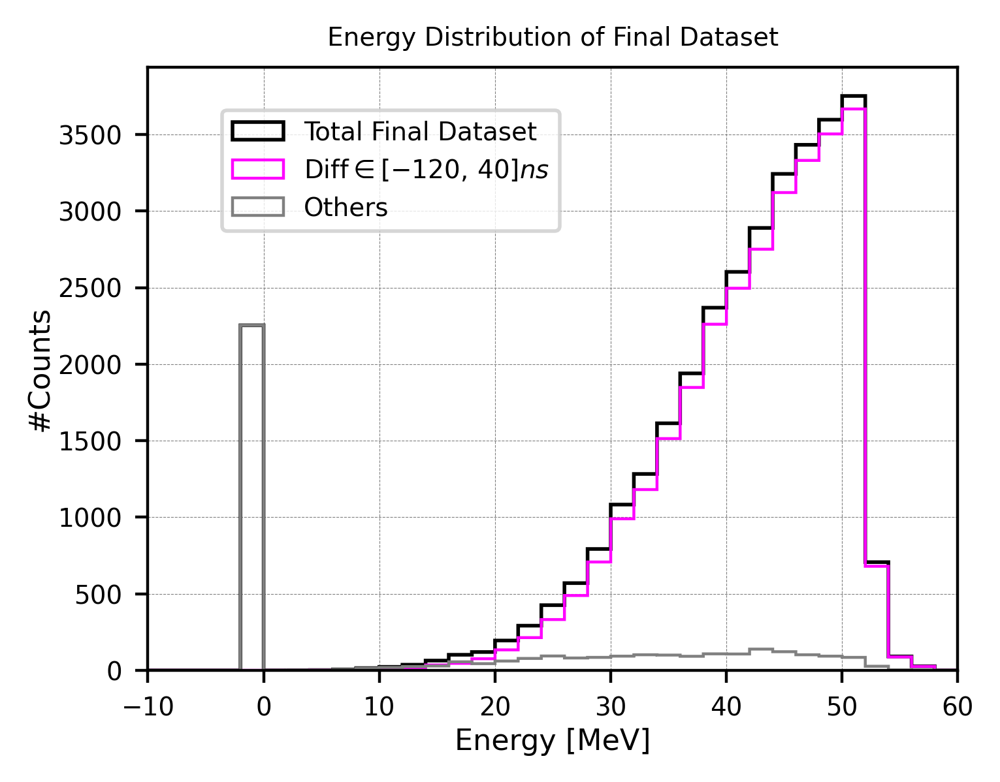


Michel Score Distribution: 


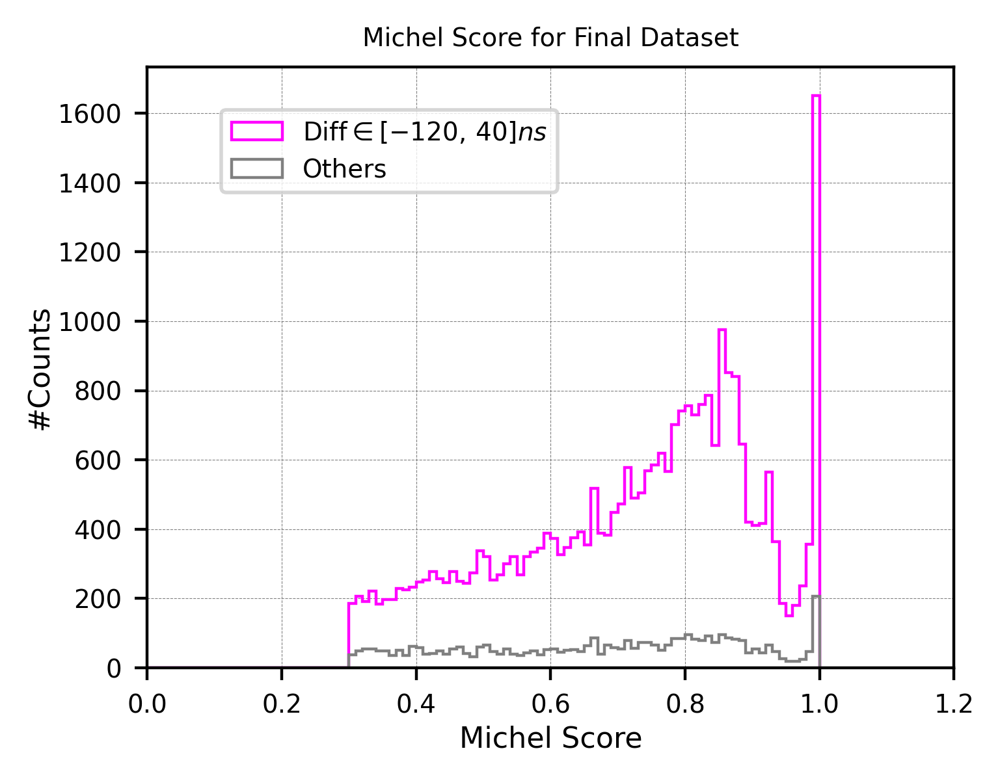


Michel Hits Distribution: 


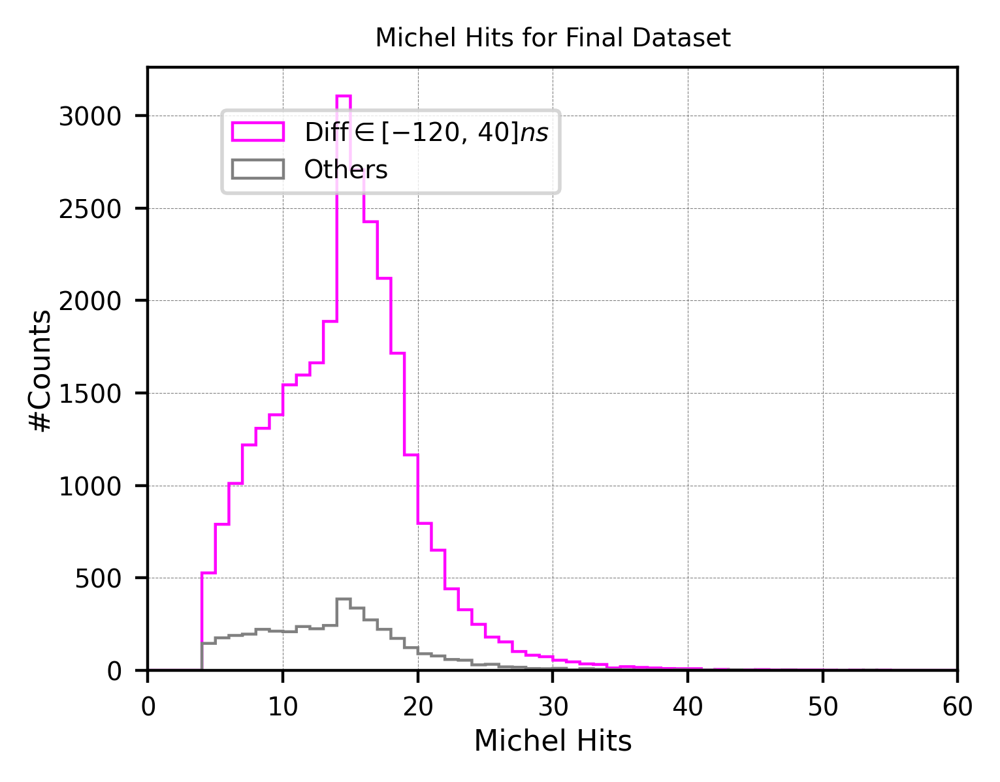

In [28]:
energy_diff500_purify9 = [ev.energy for ev in events_diff500_purify9]
energy_diff0_purify9 = [ev.energy for ev in events_diff0_purify9]
energy_total_purify9 = [ev.energy for ev in events_total_purify9]

hits_diff500_purify9 = [ev.michel_hits for ev in events_diff500_purify9]
hits_diff0_purify9 = [ev.michel_hits for ev in events_diff0_purify9]

score_diff500_purify9 = [ev.michel_score for ev in events_diff500_purify9]
score_diff0_purify9 = [ev.michel_score for ev in events_diff0_purify9]




#Decay points distribution:==========================================
print("\nEnergy Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 2
range_min =-1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(energy_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='black', 
          histtype='step', linewidth=1.0, label="Total Final Dataset")
plt.hist(energy_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(energy_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------


plt.xlim(-10, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 2000)
#plt.yscale('log')
plt.title('Energy Distribution of Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 











#Michel Score distribution:==========================================
print("\nMichel Score Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 0.01
range_min =-1
range_max = 1
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(score_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(score_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 1.2)
plt.xlabel('Michel Score', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Score for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 







#Michel Hits distribution:==========================================
print("\nMichel Hits Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 1
range_min =0
range_max = 600
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(hits_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(hits_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 60)
plt.xlabel('Michel Hits', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Hits for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 





<br />
<br />
<br />

### Properties of Final True Michel electrons:

#(Final true Michel):  31278
#( Michel p) / #(Michel p):  27540 / 3738 (736.76%)


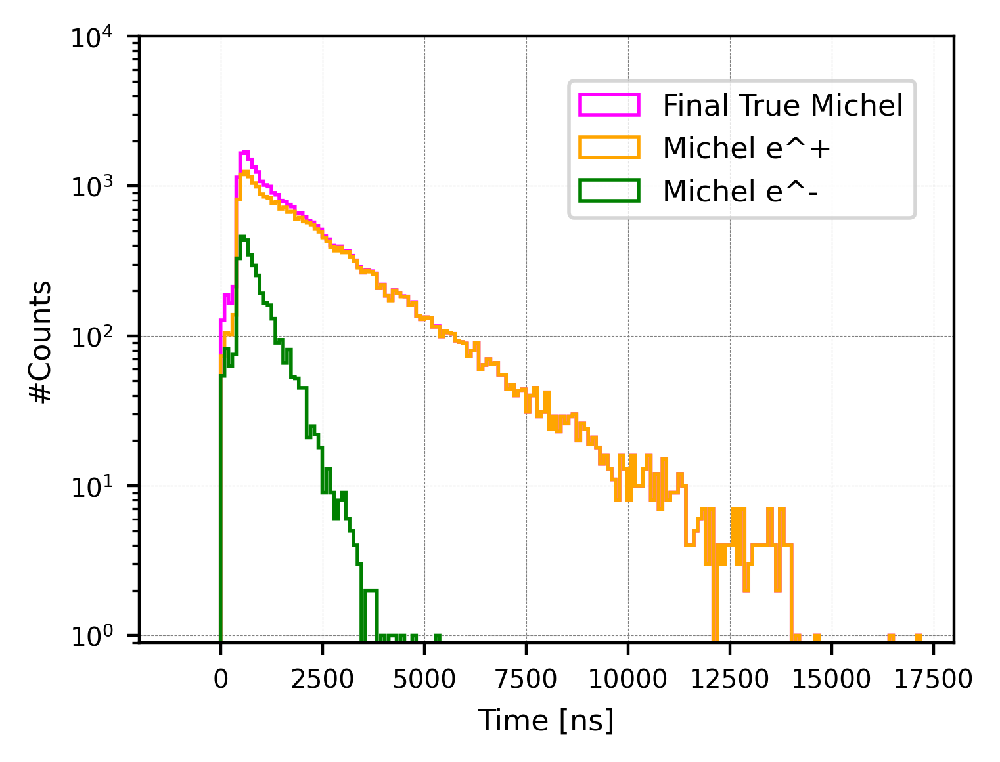

Reminder [20260415]: Make the spetrum difference for e^+ and e^- clear; decay in orbit can have MeV-scale effect?


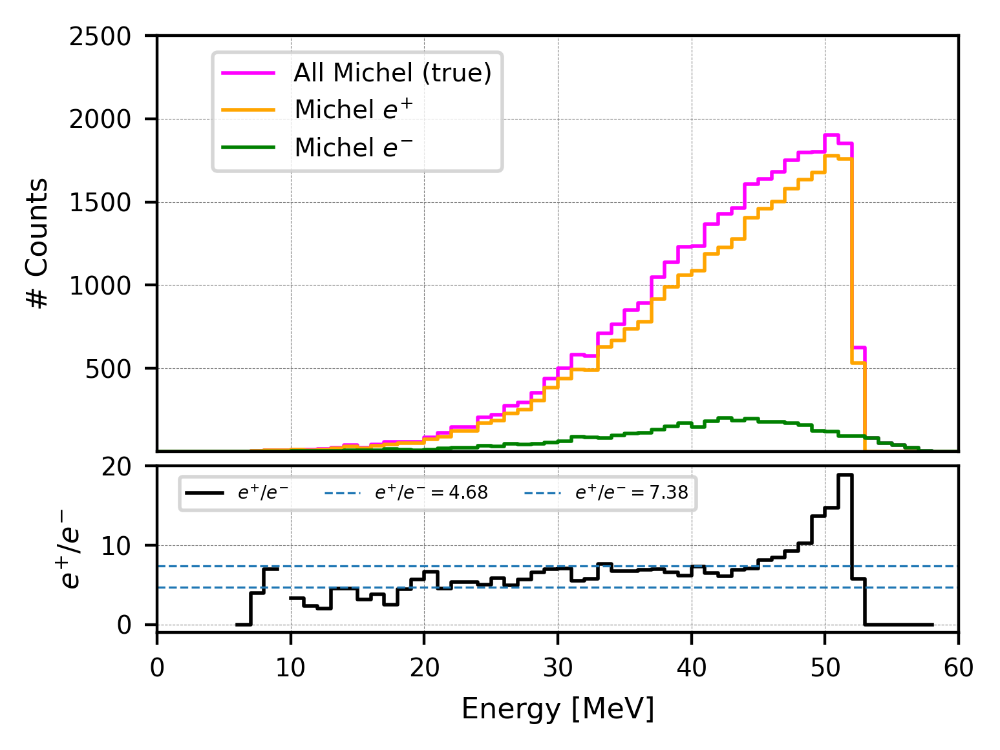

In [78]:
trueM_purify9 = []
trueMp_purify9 = []
trueMn_purify9 = []

for ev in events_total_purify9:
    life = ev.true_lifetime
    pdgCode = ev.pdg

    if life > 0:
        trueM_purify9.append(ev)

        if pdgCode < 0:
            trueMp_purify9.append(ev)
        if pdgCode > 0:
            trueMn_purify9.append(ev)

print("#(Final true Michel): ", len(trueM_purify9))
print("#( Michel p) / #(Michel p): ", len(trueMp_purify9), "/", len(trueMn_purify9),
      "({:.2f}%)".format(len(trueMp_purify9)/len(trueMn_purify9)*100))



#Lifetime distributions================================================
trueM_life = [ev.true_lifetime for ev in trueM_purify9]
trueMp_life = [ev.true_lifetime for ev in trueMp_purify9]
trueMn_life = [ev.true_lifetime for ev in trueMn_purify9]


# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 96 # Advice 202602-----------------
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(trueM_life, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0, label='Final True Michel')
plt.hist(trueMp_life, bins=bins, range=(range_min, range_max),
         edgecolor='orange', histtype='step', linewidth=1.0, label='Michel e^+')
plt.hist(trueMn_life, bins=bins, range=(range_min, range_max),
         edgecolor='green', histtype='step', linewidth=1.0, label='Michel e^-')

plt.xlim(-2000, 18000)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






#Energy distributions================================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

print("Reminder [20260415]: Make the spetrum difference for e^+ and e^- clear; decay in orbit can have MeV-scale effect?")

# -------------------------------------------------
# Prepare energy arrays
# -------------------------------------------------
vals_energy_total = np.array([ev.energy for ev in trueM_purify9])
vals_energy_pM    = np.array([ev.energy for ev in trueMp_purify9])
vals_energy_nM    = np.array([ev.energy for ev in trueMn_purify9])

# -------------------------------------------------
# Binning
# -------------------------------------------------
bin_width = 1.0
range_min = -20
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)
bin_centers = 0.5 * (bins[:-1] + bins[1:])
nb = len(bin_centers)

# Counts (explicit)
h_tot, _ = np.histogram(vals_energy_total, bins=bins)
h_pM,  _ = np.histogram(vals_energy_pM,    bins=bins)
h_nM,  _ = np.histogram(vals_energy_nM,    bins=bins)

# Ratio: e+ / e- (skip bins where e- == 0)
ratio = np.full(nb, np.nan, dtype=float)
mask = h_nM > 0
ratio[mask] = h_pM[mask] / h_nM[mask]

# -------------------------------------------------
# Figure: GridSpec two panels (like your lifetime script)
# -------------------------------------------------
fig = plt.figure(figsize=(4, 3), dpi=400)
gs = GridSpec(2, 1, height_ratios=[5, 2], hspace=0.05)

ax_top = fig.add_subplot(gs[0])
ax_bot = fig.add_subplot(gs[1], sharex=ax_top)

# -------------------------------------------------
# Top panel: step histograms (use step() so it matches bins exactly)
# -------------------------------------------------
ax_top.step(bins[:-1], h_tot, where='post', color='magenta', linewidth=1.0, label='All Michel (true)')
ax_top.step(bins[:-1], h_pM,  where='post', color='orange', linewidth=1.0, label='Michel $e^{+}$')
ax_top.step(bins[:-1], h_nM,  where='post', color='green', linewidth=1.0, label='Michel $e^{-}$')

ax_top.set_xlim(0, 60)
ax_top.tick_params(labelbottom=False, bottom=False)
ax_top.set_ylim(0.9, 2500)
#ax_top.set_yscale('log')
ax_top.set_ylabel('# Counts', fontsize=8)
ax_top.tick_params(labelsize=7)
ax_top.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax_top.legend(loc='upper center', bbox_to_anchor=(0.25, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})
#ax_top.set_title('Energy Distribution of Michel True Events', fontsize=9)



# -------------------------------------------------
# Bottom panel: ratio (step-mid to match histogram bins)
# -------------------------------------------------
ax_bot.plot(bin_centers, ratio, drawstyle='steps-mid', color='black', linewidth=1.0, label='$e^{+}/e^{-}$')
ax_bot.axhline(4.68, linestyle='--', linewidth=0.6, label='$e^{+}/e^{-} = 4.68$')
ax_bot.axhline(7.38, linestyle='--', linewidth=0.6, label='$e^{+}/e^{-} = 7.38$')

ax_bot.set_xlim(0, 60)
ax_bot.set_ylim(-1, 20)
ax_bot.set_xlabel('Energy [MeV]', fontsize=8)
ax_bot.set_ylabel('$e^{+}/e^{-}$', fontsize=8)
ax_bot.tick_params(labelsize=7)

ax_bot.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax_bot.legend(loc='upper center', bbox_to_anchor=(0.35, 0.99),
           fontsize=5, markerscale=4, ncol=3, prop={'size':5})


plt.show()









<br />
<br />
<br />
<br />
<br />

### Lifetime Distribution of Final Dataset (purification 9):

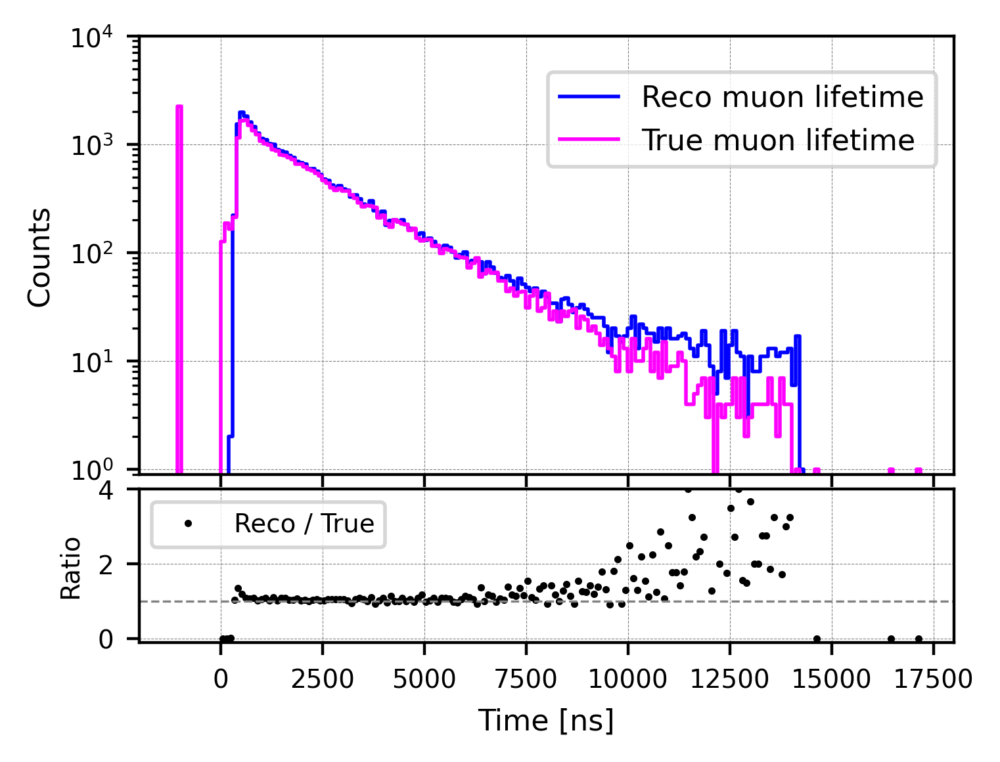



For each event, +40ns for reco time


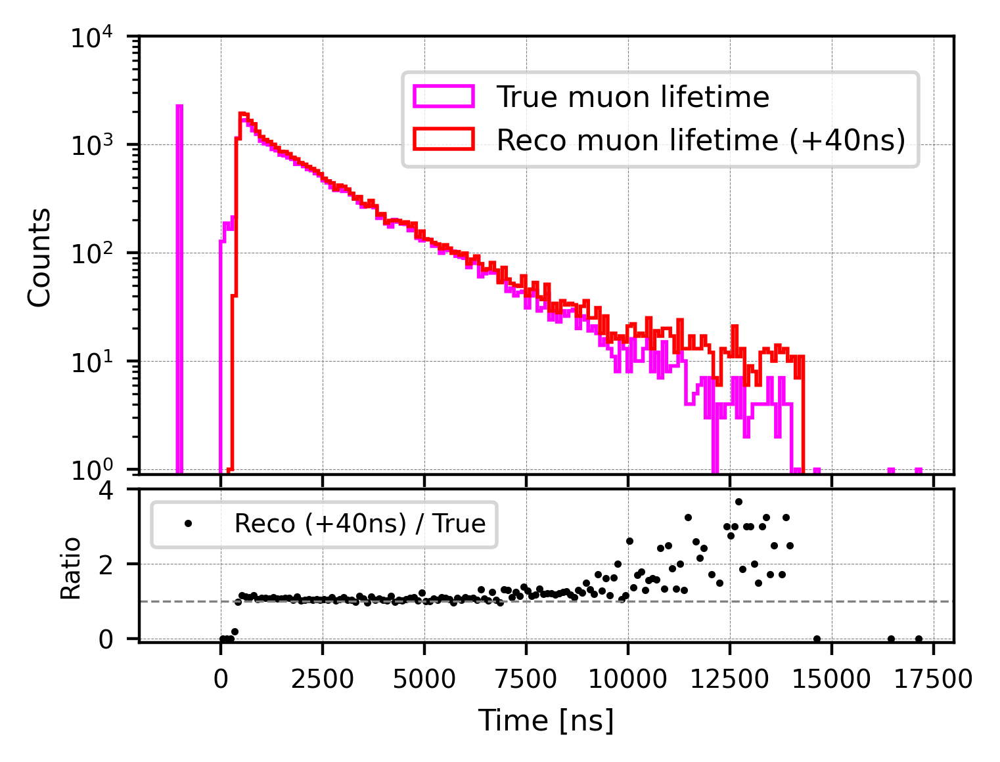

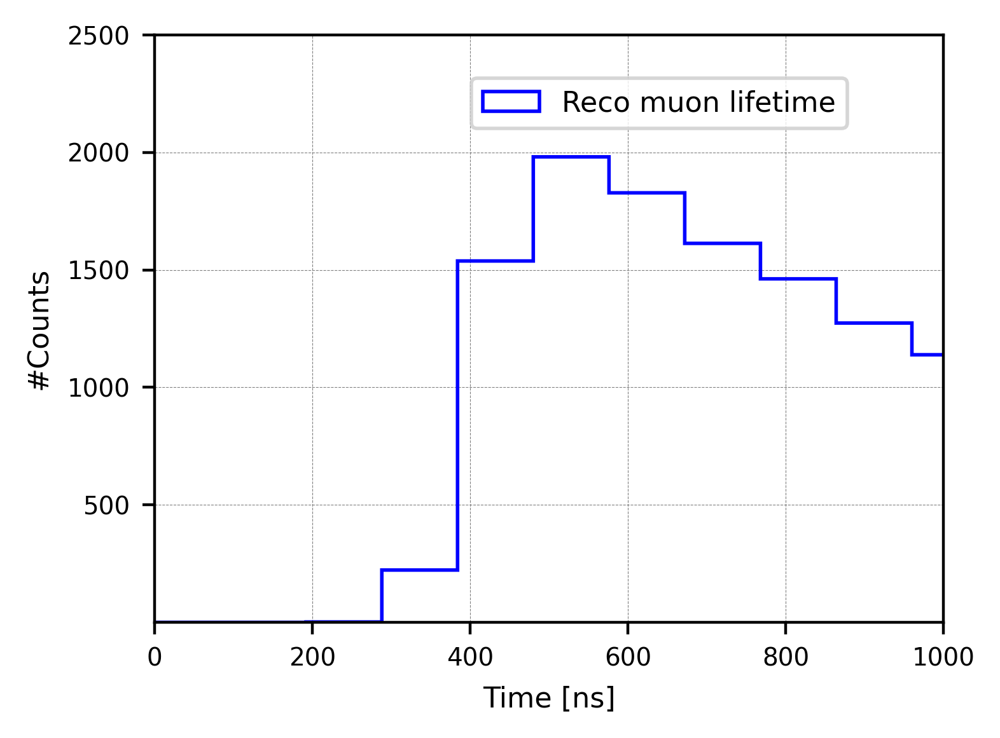



BKG distribution===========================

reco_true / reco_total:  31278 / 33532 (93.28%)


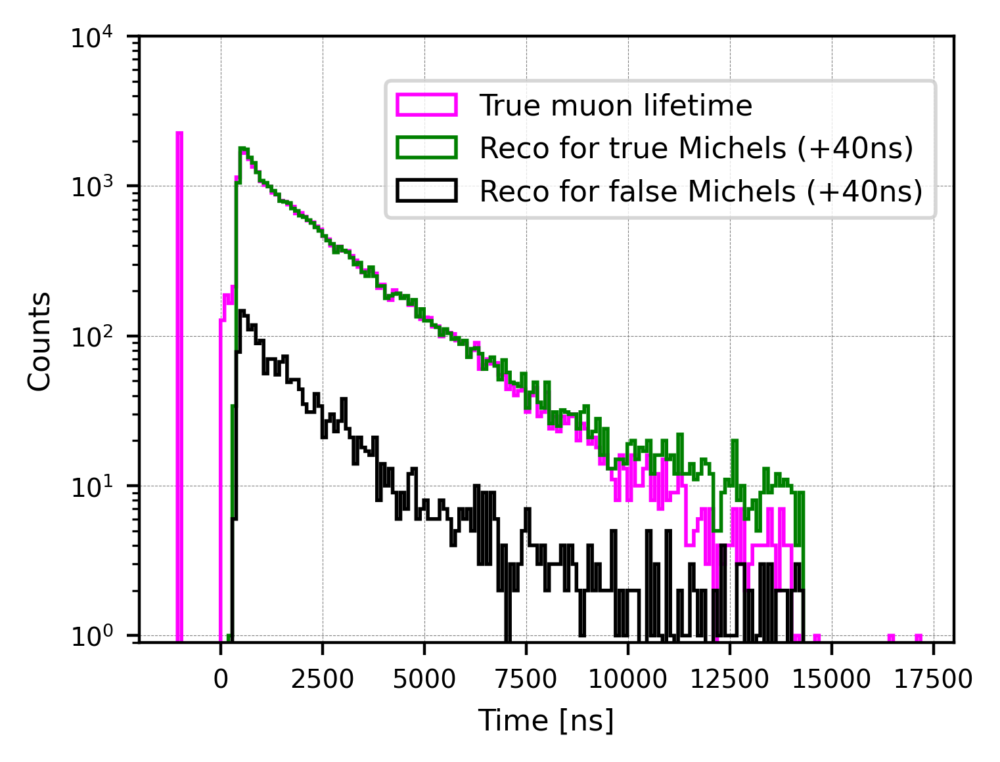

In [74]:

recoT_total_purify9 = [ev.reco_lifetime for ev in events_total_purify9]
trueT_total_purify9 = [ev.true_lifetime for ev in events_total_purify9]



# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
# Muon Lifetime distribution (INITIAL; NO fitting)----------------------

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# ============================================================
# Histogram settings
# ============================================================
bin_width = 96
range_min = -96000
range_max = 96000

bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])

# ============================================================
# Histograms
# ============================================================
hist_reco, _ = np.histogram(recoT_total_purify9, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))
ratio = np.full_like(hist_true, np.nan, dtype=float)
mask = (hist_true > 0) & (centers > 0)
ratio[mask] = hist_reco[mask] / hist_true[mask]

# ============================================================
fig = plt.figure(figsize=(4, 3), dpi=400)

gs = GridSpec(2, 1, height_ratios=[4, 1.4], hspace=0.05)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# ============================================================
# Top panel
# ============================================================
ax1.step(bins, np.append(hist_reco, 0), where='post', color='blue', linewidth=1.0, 
         label='Reco muon lifetime')
ax1.step(bins, np.append(hist_true, 0), where='post',color='magenta', linewidth=1.0,
         label='True muon lifetime')

ax1.set_xlim(-2000, 18000)
ax1.set_ylim(0.9, 10000)

ax1.set_yscale("log")
ax1.set_ylabel('Counts', fontsize=8)
ax1.tick_params(labelsize=7)
ax1.tick_params(labelbottom=False)
ax1.grid(color='gray', linestyle='--', linewidth=0.2)
ax1.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), prop={'size':8})

# ============================================================
ax2.plot(centers[mask], ratio[mask], 'o', ms=1.0, color='black', label='Reco / True')
ax2.axhline(1.0, linestyle='--', linewidth=0.6, color='gray')

ax2.set_xlim(-2000, 18000)
ax2.set_ylim(-0.1, 4)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('Ratio', fontsize=7)
ax2.tick_params(labelsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2)
ax2.legend(fontsize=7)
plt.show()








#Shift +40ns================================================================================
print("\n\n===================================")
print("For each event, +40ns for reco time")

recoT_total_purify9_shift40 = [x + 40 for x in recoT_total_purify9]

bin_width = 96
range_min = -96000
range_max = 96000

bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])

hist_true, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))
hist_reco_shift40, _ = np.histogram(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max))

ratio = np.full_like(hist_true, np.nan, dtype=float)
mask = (hist_true > 0) & (centers > 0)

ratio[mask] = hist_reco_shift40[mask] / hist_true[mask]

# ============================================================
fig = plt.figure(figsize=(4, 3), dpi=400)

gs = GridSpec(2, 1, height_ratios=[4, 1.4], hspace=0.05)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# Top panel: keep histogram drawing
ax1.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0, label='True muon lifetime')

ax1.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0, label='Reco muon lifetime (+40ns)')

ax1.set_xlim(-2000, 18000)
ax1.set_ylim(0.9, 10000)
ax1.set_yscale("log")
ax1.set_ylabel('Counts', fontsize=8)
ax1.tick_params(labelsize=7)
ax1.tick_params(labelbottom=False)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95),
           markerscale=5, ncol=1, prop={'size':8})

# Bottom panel: shifted reco / true
ax2.plot(centers[mask], ratio[mask], 'o', ms=1.0, color='black', label='Reco (+40ns) / True')

ax2.axhline(1.0, linestyle='--', linewidth=0.6, color='gray')

ax2.set_xlim(-2000, 18000)
ax2.set_ylim(-0.1, 4.0)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('Ratio', fontsize=7)
ax2.tick_params(labelsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(fontsize=7, loc='upper left')
plt.show()







#Zoomed-in plot=========================================
print("\n\n===================================")

# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

# plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
#          edgecolor='magenta', histtype='step', linewidth=1.0,
#          label='True muon lifetime')

# plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
#          edgecolor='red', histtype='step', linewidth=1.0,
#          label='Reco muon lifetime (Shifted)')

plt.hist(recoT_total_purify9, bins=bins, range=(range_min, range_max),
          edgecolor='blue', histtype='step', linewidth=1.0,
          label='Reco muon lifetime')

plt.xlim(0, 1000)
#plt.xlim(-2000, 18000)
plt.ylim(0.9, 2500)
#plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()








#BKG distribution=========================================
print("\n\nBKG distribution===========================")
reco_true_finalEvents = []
reco_false_finalEvents = []

for i in range(0, len(trueT_total_purify9)):
    true = trueT_total_purify9[i]
    reco = recoT_total_purify9_shift40[i]

    if true > 0:
        reco_true_finalEvents.append(reco)
    else:
        reco_false_finalEvents.append(reco)

print("\nreco_true / reco_total: ", len(reco_true_finalEvents), "/", len(recoT_total_purify9_shift40),
       "({:.2f}%)".format(len(reco_true_finalEvents)/len(recoT_total_purify9_shift40)*100))

# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.hist(reco_true_finalEvents, bins=bins, range=(range_min, range_max),
         edgecolor='green', histtype='step', linewidth=1.0,
         label='Reco for true Michels (+40ns)')

plt.hist(reco_false_finalEvents, bins=bins, range=(range_min, range_max),
         edgecolor='black', histtype='step', linewidth=1.0,
         label='Reco for false Michels (+40ns)')


plt.xlim(-2000, 18000)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()




#### Fitting of Current BKG Hist:


Covariance matrix (Minuit):
Parameter order: ('N', 'tau')
[[ 3.30201818e-03 -1.66114614e+00]
 [-1.66114614e+00  1.14764368e+03]]

Formatted covariance matrix:
Cov(N,N) = 0.00330202
Cov(N,tau) = -1.66115
Cov(tau,N) = -1.66115
Cov(tau,tau) = 1147.64

Correlation matrix:
[[ 1.         -0.85332521]
 [-0.85332521  1.        ]]


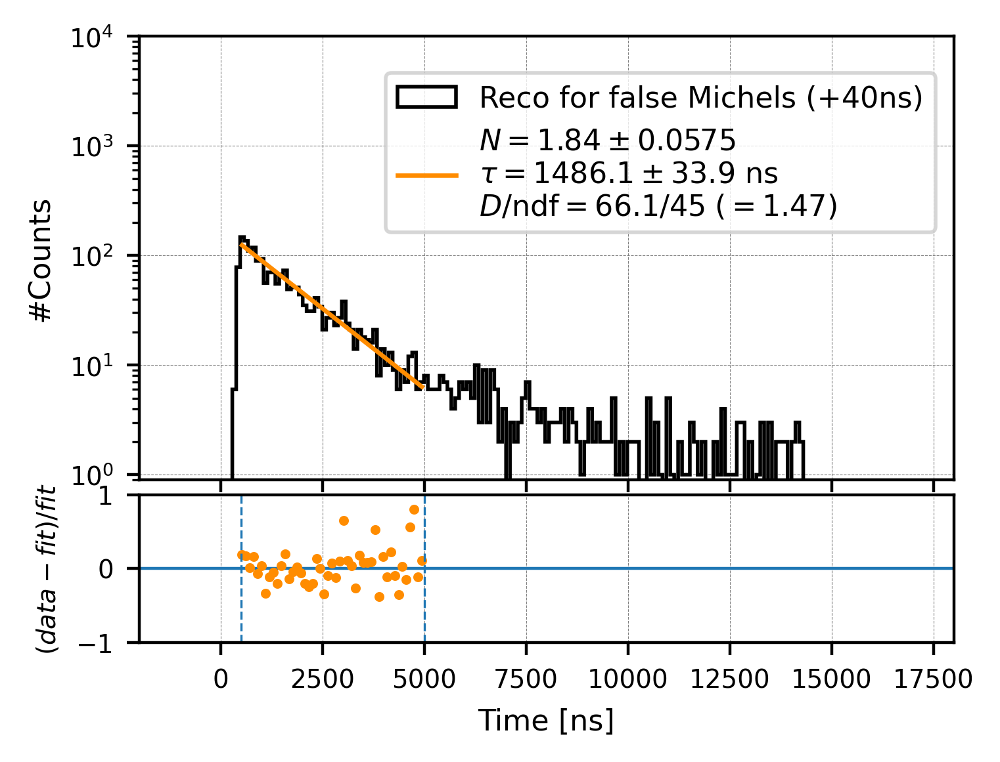

N   = 1.83859
tau = 1486.068 ± 33.877 ns
D/ndf = 66.13/45  (= 1.469)
Minuit success = True, message: valid=True, accurate=True, fmin_ok=True


In [76]:
import numpy as np
import matplotlib.pyplot as plt
from iminuit import Minuit

# ============================================================
# 1) Bin-integrated exponential: mu_i = ∫_a^b N exp(-t/tau) dt
# ============================================================
def mu_binint_exp(edges, N, tau):
    a = edges[:-1]
    b = edges[1:]
    return N * tau * (np.exp(-a / tau) - np.exp(-b / tau))

# ============================================================
# 2) Poisson deviance D = 2 Σ [ mu - n + n ln(n/mu) ]
#    For n=0, define n ln(n/mu)=0.
# ============================================================
def poisson_deviance(n, mu, eps=1e-12):
    mu = np.maximum(mu, eps)
    term = np.where(n > 0, n * np.log(n / mu), 0.0)
    return 2.0 * np.sum(mu - n + term)

# ============================================================
# 3) Fit single exp with binned Poisson MLE using Minuit
#    Returns tau uncertainty from HESSE
# ============================================================
def fit_single_exp_binned_minuit(samples, bins, hist_range, fit_range, tau0=2000.0):
    counts, edges = np.histogram(samples, bins=bins, range=hist_range)
    centers = 0.5 * (edges[:-1] + edges[1:])

    m = (centers >= fit_range[0]) & (centers <= fit_range[1])
    idx = np.where(m)[0]
    if len(idx) < 3:
        return None

    n_fit = counts[m]
    edges_fit = edges[idx[0]: idx[-1] + 2]

    # Initial guesses
    binw = edges[1] - edges[0]
    N0 = max(n_fit[0] / max(binw, 1e-12), 1.0)

    def objective(N, tau):
        if N <= 0.0 or tau <= 0.0:
            return 1e30
        mu = mu_binint_exp(edges_fit, N, tau)
        return poisson_deviance(n_fit, mu)

    minuit = Minuit(objective, N=N0, tau=tau0)

    # For likelihood / deviance-like objective
    minuit.errordef = Minuit.LIKELIHOOD

    # Bounds
    minuit.limits["N"] = (1e-12, None)
    minuit.limits["tau"] = (1e-9, None)

    # Optional: step sizes for numerical derivatives
    minuit.errors["N"] = max(0.1 * N0, 1e-6)
    minuit.errors["tau"] = max(0.1 * tau0, 1.0)

    # Run minimization and HESSE errors
    minuit.migrad()
    minuit.hesse()


    # ============================================================
    # Print covariance matrix
    # ============================================================
    print("\nCovariance matrix (Minuit):")

    if minuit.covariance is None:
        print("Covariance matrix not available.")
    else:
        cov = np.array(minuit.covariance)

        print("Parameter order:", minuit.parameters)
        print(cov)

        # Optional: print in a more readable format
        print("\nFormatted covariance matrix:")
        for i, p1 in enumerate(minuit.parameters):
            for j, p2 in enumerate(minuit.parameters):
                print(f"Cov({p1},{p2}) = {cov[i,j]:.6g}")

        # ------------------------------------------------------------
        # Correlation matrix
        # ------------------------------------------------------------
        print("\nCorrelation matrix:")
        corr = cov / np.outer(np.sqrt(np.diag(cov)), np.sqrt(np.diag(cov)))
        print(corr)


    N_fit = float(minuit.values["N"])
    tau_fit = float(minuit.values["tau"])
    sigma_N = float(minuit.errors["N"]) if np.isfinite(minuit.errors["N"]) else np.nan
    sigma_tau = float(minuit.errors["tau"]) if np.isfinite(minuit.errors["tau"]) else np.nan

    mu_fit = mu_binint_exp(edges_fit, N_fit, tau_fit)
    D = poisson_deviance(n_fit, mu_fit)
    ndf = max(len(n_fit) - 2, 1)

    return {
        "counts": counts,
        "edges": edges,
        "centers": centers,
        "mask": m,
        "edges_fit": edges_fit,
        "n_fit": n_fit,
        "mu_fit": mu_fit,
        "N_fit": N_fit,
        "tau_fit": tau_fit,
        "sigma_N": sigma_N,
        "sigma_tau": sigma_tau,
        "D": float(D),
        "ndf": int(ndf),
        "opt_success": bool(minuit.valid),
        "opt_message": f"valid={minuit.valid}, accurate={minuit.accurate}, fmin_ok={minuit.fmin.is_valid}",
        "minuit": minuit,
    }

# ============================================================
# 4) USER SETTINGS (edit these only)
# ============================================================
fit_range = (500.0, 5000.0)
xlim = (-2000.0, 18000.0)
ylim = (0.9, 10000.0)

hist_label = "Reco for false Michels (+40ns)"

# ============================================================
# 5) RUN FIT
# ============================================================
out = fit_single_exp_binned_minuit(
    samples=reco_false_finalEvents,
    bins=bins,
    hist_range=(range_min, range_max),
    fit_range=fit_range,
    tau0=2000.0
)

if out is None:
    print("[WARN] Not enough bins in fit_range for a stable fit.")
else:
    edges_fit = out["edges_fit"]
    centers_fit = 0.5 * (edges_fit[:-1] + edges_fit[1:])
    rel = (out["n_fit"] - out["mu_fit"]) / np.maximum(out["mu_fit"], 1e-12)

    # ============================================================
    # 6) PLOT (top + bottom)
    # ============================================================
    fig = plt.figure(figsize=(4, 3.0), dpi=400)
    gs = fig.add_gridspec(2, 1, height_ratios=[3.0, 1.0], hspace=0.05)
    ax = fig.add_subplot(gs[0])
    axr = fig.add_subplot(gs[1], sharex=ax)

    ax.hist(
        reco_false_finalEvents,
        bins=bins,
        range=(range_min, range_max),
        edgecolor="black",
        histtype="step",
        linewidth=1.0,
        label=hist_label
    )

    # Legend text
    if np.isfinite(out["sigma_tau"]):
        line_tau = rf"$\tau = {out['tau_fit']:.1f} \pm {out['sigma_tau']:.1f}$ ns"
    else:
        line_tau = rf"$\tau = {out['tau_fit']:.1f}$ ns"

    if "sigma_N" in out and np.isfinite(out["sigma_N"]):
        line_N = rf"$N = {out['N_fit']:.3g} \pm {out['sigma_N']:.3g}$"
    else:
        line_N = rf"$N = {out['N_fit']:.3g}$"

    line_D = rf"$D/\mathrm{{ndf}} = {out['D']:.1f}/{out['ndf']} \; (= {out['D']/out['ndf']:.2f})$"

    fit_label = line_N + "\n" + line_tau + "\n" + line_D

    ax.plot(
        centers_fit,
        out["mu_fit"],
        linewidth=1.2,
        label=fit_label,
        color="darkorange"
    )

    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_yscale("log")
    ax.set_ylabel("#Counts", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(color="gray", linestyle="--", linewidth=0.2, zorder=0)
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.64, 0.95),
        fontsize=11,
        markerscale=5,
        ncol=1,
        prop={"size": 8}
    )
    plt.setp(ax.get_xticklabels(), visible=False)

    axr.axhline(0.0, linewidth=0.8)
    axr.plot(
        centers_fit,
        rel,
        marker="o",
        markersize=1.7,
        linewidth=0.8,
        linestyle="none",
        color="darkorange"
    )
    axr.axvline(fit_range[0], linestyle="--", linewidth=0.6)
    axr.axvline(fit_range[1], linestyle="--", linewidth=0.6)

    axr.set_xlim(*xlim)
    axr.set_ylim(-1, 1)
    axr.set_xlabel("Time [ns]", fontsize=8)
    axr.set_ylabel(r"$(data-fit)/fit$", fontsize=7)
    axr.tick_params(labelsize=7)
    axr.grid(color="gray", linestyle="--", linewidth=0.2, zorder=0)

    plt.show()

    # ============================================================
    # 7) PRINT RESULTS
    # ============================================================
    print(f"N   = {out['N_fit']:.6g}")
    if np.isfinite(out["sigma_tau"]):
        print(f"tau = {out['tau_fit']:.3f} ± {out['sigma_tau']:.3f} ns")
    else:
        print(f"tau = {out['tau_fit']:.3f} ns (uncertainty unavailable)")
    print(f"D/ndf = {out['D']:.2f}/{out['ndf']}  (= {out['D']/out['ndf']:.3f})")
    print(f"Minuit success = {out['opt_success']}, message: {out['opt_message']}")

### Spatial Distribution of False Michel Electrons:


#(Final False Michel):  2254

Decay points distribution: 


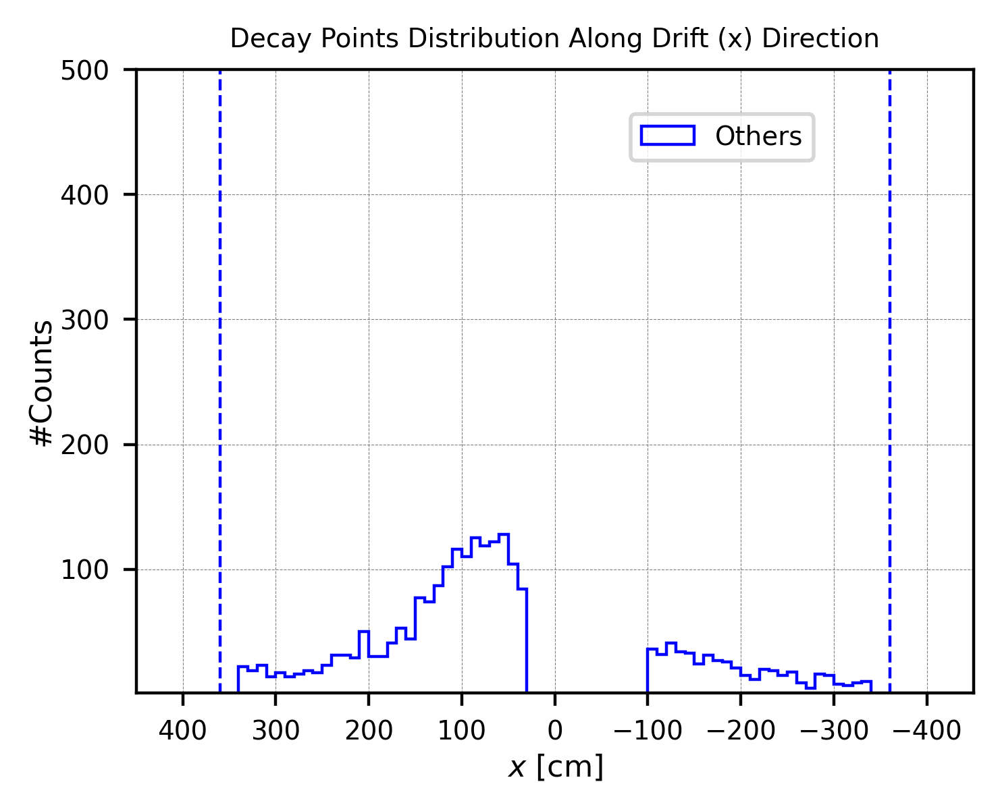

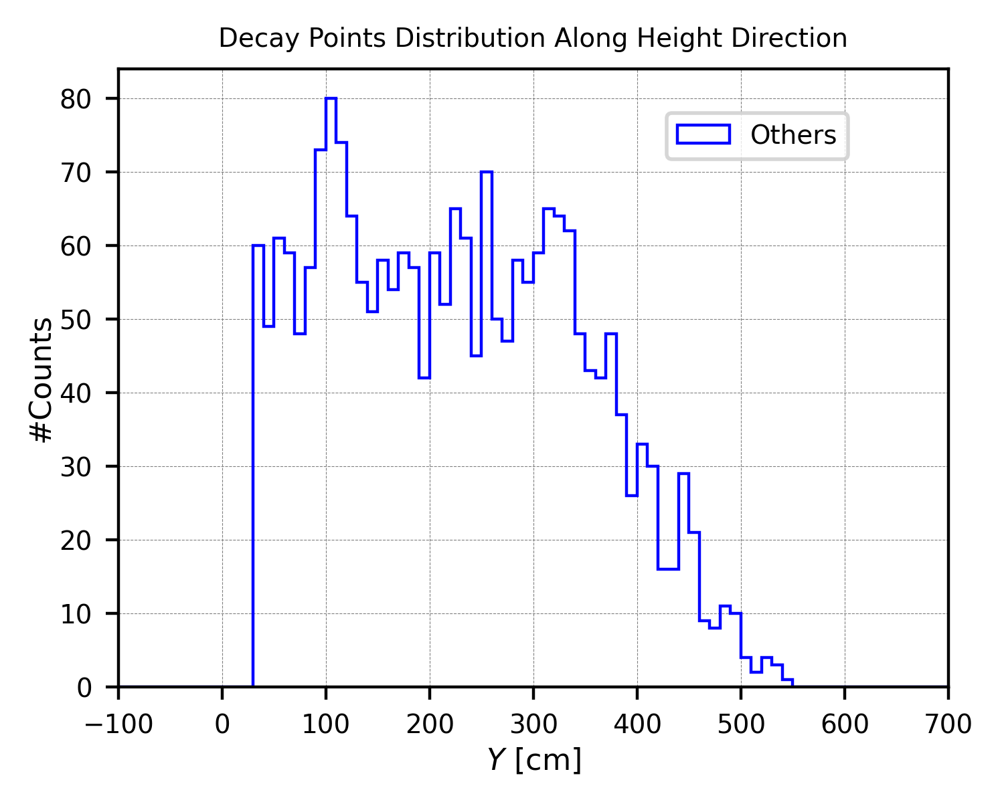

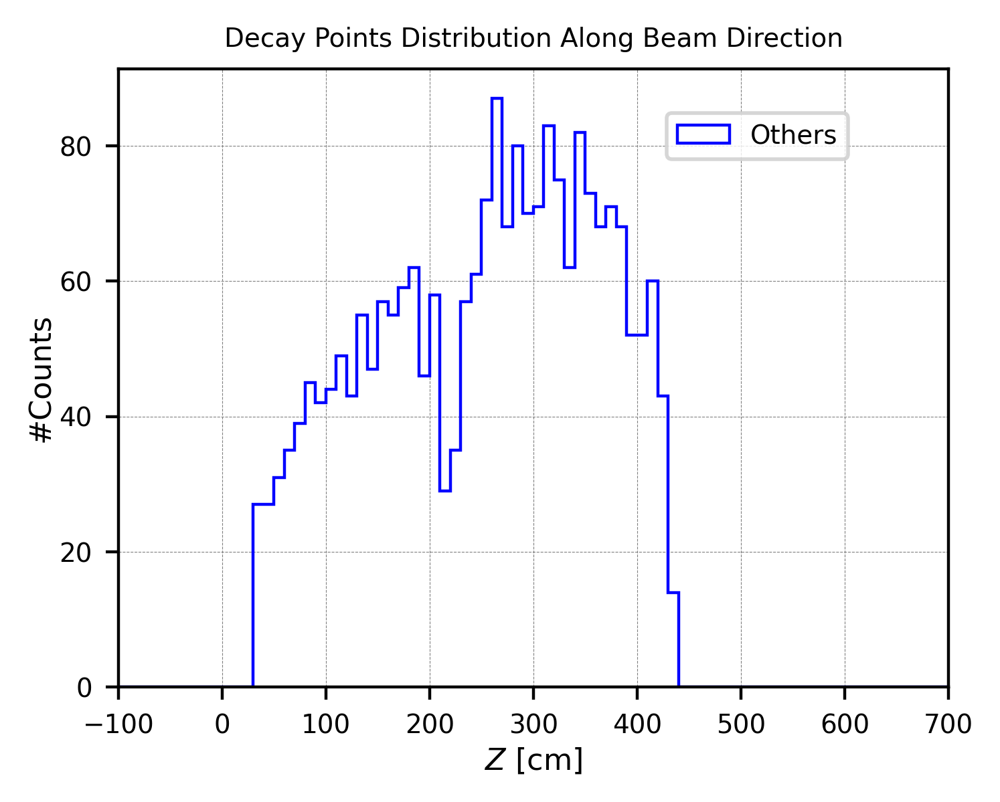

In [32]:
events_FalseM_purify9 = []

for ev in events_total_purify9:
    if ev.true_lifetime <= 0:
        events_FalseM_purify9.append(ev)    

print("\n#(Final False Michel): ", len(events_FalseM_purify9))


posX_falseM_purify9 = [ev.posX for ev in events_FalseM_purify9]
posZ_falseM_purify9 = [ev.posZ for ev in events_FalseM_purify9]
posY_falseM_purify9 = [ev.posY for ev in events_FalseM_purify9] 






#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_falseM_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Y distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posY_falseM_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Y$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Height Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posZ_falseM_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Z$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 








<br />
<br />

### Apply BKG Subtraction:


Reading bkg reco lifetime distribution---
Entries in bkg sample: 3525

Target scaled bkg sample: 0
Scale factor: 0.0
Scaled bkg sample: 0.0

Reco entries in range: 33532
Background entries before scaling: 3525
Target scaled background: 0
Scale factor: 0.0
Scaled background: 0.0
After subtraction: 33532.0

Background subtraction: OFF
Maximum difference from sqrt(h_reco) when subtraction is off: 0.0


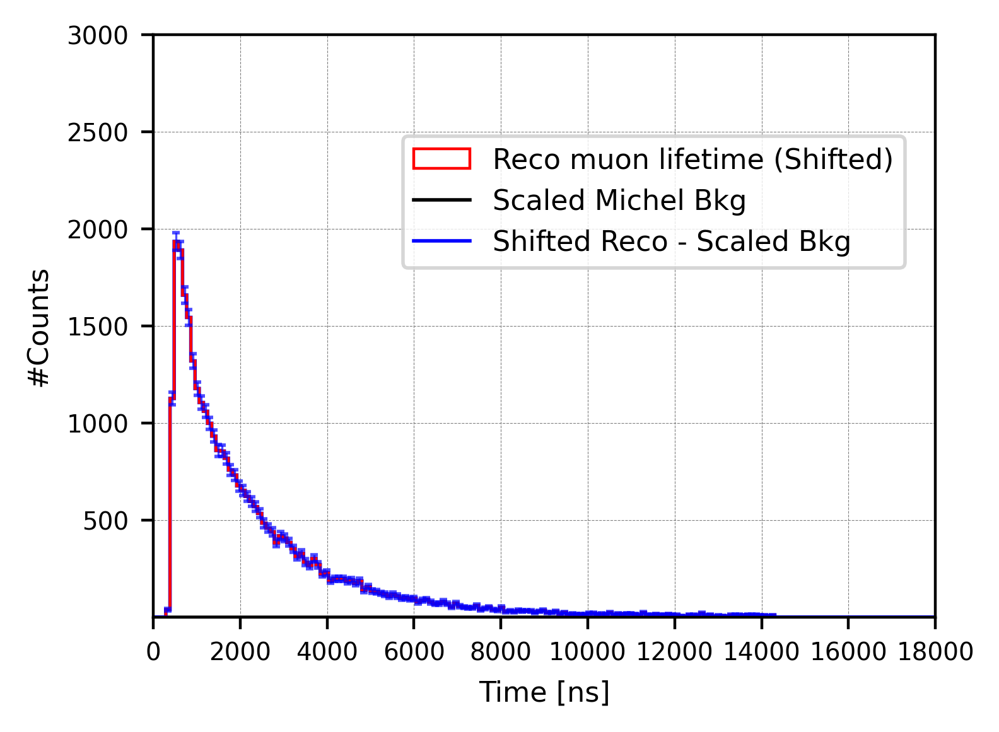

In [79]:
import numpy as np

# read the bkg reco lifetime distribution---
recoT_total_purify9_bkg = np.load("recoT_total_purify9_bkgSample.npy")

print("\nReading bkg reco lifetime distribution---")
print("Entries in bkg sample:", len(recoT_total_purify9_bkg))


# ---Binning ---
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])

# --- Histograms ---
h_reco, _ = np.histogram(recoT_total_purify9_shift40, bins=bins)
h_bkg,  _ = np.histogram(recoT_total_purify9_bkg, bins=bins)


#============================================================================
# --- Scale background ---
# no scaling: 0.0; False Michel: 2254; All no-recog: 4021
signal_bkg_Num = 0 #=========================================================

scale_bkg = signal_bkg_Num / np.sum(h_bkg)
h_bkg_scaled = h_bkg * scale_bkg
#=========================================================================

print("\nTarget scaled bkg sample:", signal_bkg_Num)
print("Scale factor:", scale_bkg)
print("Scaled bkg sample:", np.sum(h_bkg_scaled))



# ============================================================
# Bin-by-bin subtraction
# ============================================================

h_reco_subtracted = h_reco - h_bkg_scaled


# ============================================================
# Uncertainty of the background-subtracted histogram
#
# h_bkg_scaled_i = signal_bkg_Num * h_bkg_i / sum(h_bkg)
#
# signal_bkg_Num is treated as a fixed normalization here.
# The uncertainty includes:
#   1. Poisson uncertainty of the signal-region histogram
#   2. Statistical shape uncertainty of the normalized CR histogram
#
# signal_bkg_Num = 0 automatically gives:
#   h_reco_subtracted = h_reco
#   sigma_reco_subtracted = sqrt(h_reco)
# ============================================================

N_bkg_control = float(np.sum(h_bkg))

if N_bkg_control <= 0:
    raise ValueError("The background control histogram is empty.")

# Control-region bin fractions
bkg_fraction = h_bkg.astype(float) / N_bkg_control


# ------------------------------------------------------------
# Signal-region counting covariance
# ------------------------------------------------------------

Cov_reco_stat = np.diag(h_reco.astype(float))

# ------------------------------------------------------------
# Statistical covariance of the normalized CR template
#
# For p_i = B_i / sum(B):
#
# Cov(p_i, p_j) =
#     [delta_ij p_i - p_i p_j] / N_CR
#
# Multiplying the shape by signal_bkg_Num gives:
#
# Cov(B_scaled) =
#     signal_bkg_Num^2 / N_CR
#     * [diag(p) - outer(p,p)]
# ------------------------------------------------------------

Cov_bkg_shape = (signal_bkg_Num**2 / N_bkg_control) * (
    np.diag(bkg_fraction) - np.outer(bkg_fraction, bkg_fraction)
)

# ------------------------------------------------------------
# Complete covariance after subtraction
#
# Cov(D - B) = Cov(D) + Cov(B)
#
# The plus sign appears because variances add even though
# the central background histogram is subtracted.
# ------------------------------------------------------------

Cov_reco_subtracted = (Cov_reco_stat + Cov_bkg_shape)

sigma_reco_subtracted = np.sqrt(np.clip(np.diag(Cov_reco_subtracted), 0.0, None))


# ============================================================
# Print summary
# ============================================================

print("\nReco entries in range:", np.sum(h_reco))
print("Background entries before scaling:", np.sum(h_bkg))
print("Target scaled background:", signal_bkg_Num)
print("Scale factor:", scale_bkg)
print("Scaled background:", np.sum(h_bkg_scaled))
print("After subtraction:", np.sum(h_reco_subtracted))

if signal_bkg_Num == 0:
    print("\nBackground subtraction: OFF")
else:
    print("\nBackground subtraction: ON")

print(
    "Maximum difference from sqrt(h_reco) when subtraction is off:",
    np.max(np.abs(sigma_reco_subtracted - np.sqrt(h_reco))
    ) if signal_bkg_Num == 0 else "not applicable"
)








# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max), 
         edgecolor='red', histtype='step', linewidth=0.8, label='Reco muon lifetime (Shifted)')

plt.stairs(h_bkg_scaled, bins, color='black', linewidth=1.0, label='Scaled Michel Bkg')

plt.stairs(h_reco_subtracted, bins, color='blue', linewidth=1.0, label='Shifted Reco - Scaled Bkg')

plt.errorbar(
    centers,
    h_reco_subtracted,
    yerr=sigma_reco_subtracted,
    fmt="none",
    ecolor="blue",
    elinewidth=0.6,
    capsize=1.0,
    alpha=0.7
)


plt.xlim(0, 18000)
#plt.xlim(-2000, 18000)
plt.ylim(0.9, 3000)
# plt.yscale("log")

plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)

plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.85), fontsize=11, markerscale=5, ncol=1, prop={'size':8})

plt.show()

### Uncertainty plot

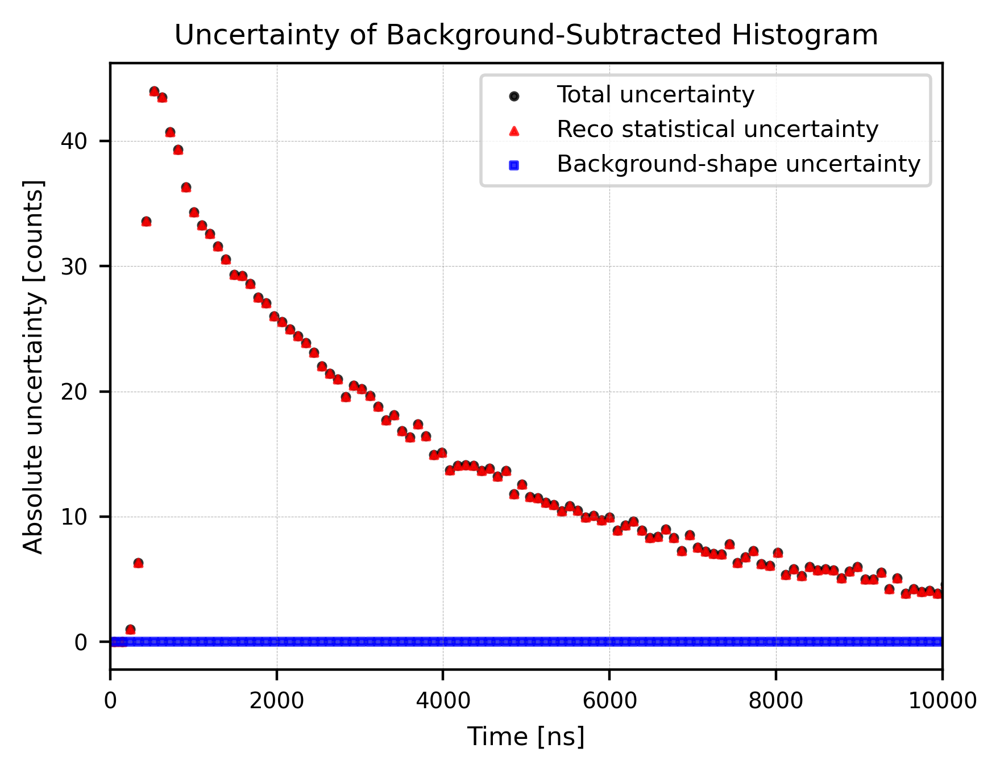


Bin center | Total unc. | Reco stat. | Bkg shape
------------------------------------------------
      48.0 |      0.000 |      0.000 |      0.000
     144.0 |      0.000 |      0.000 |      0.000
     240.0 |      1.000 |      1.000 |      0.000
     336.0 |      6.325 |      6.325 |      0.000
     432.0 |     33.571 |     33.571 |      0.000
     528.0 |     43.989 |     43.989 |      0.000
     624.0 |     43.486 |     43.486 |      0.000
     720.0 |     40.731 |     40.731 |      0.000
     816.0 |     39.294 |     39.294 |      0.000
     912.0 |     36.332 |     36.332 |      0.000


In [80]:
# ============================================================
# Plot uncertainties only — scatter style
# ============================================================

sigma_reco_stat = np.sqrt(
    np.clip(np.diag(Cov_reco_stat), 0.0, None)
)

sigma_bkg_shape = np.sqrt(
    np.clip(np.diag(Cov_bkg_shape), 0.0, None)
)

sigma_total = np.sqrt(
    np.clip(np.diag(Cov_reco_subtracted), 0.0, None)
)

# Plot range
plot_mask = (centers >= 0.0) & (centers <= 18000.0)

plt.figure(figsize=(4.5, 3.5), dpi=400)

plt.scatter(
    centers[plot_mask],
    sigma_total[plot_mask],
    color="black",
    marker="o",
    s=5,
    alpha=0.8,
    label="Total uncertainty"
)

plt.scatter(
    centers[plot_mask],
    sigma_reco_stat[plot_mask],
    color="red",
    marker="^",
    s=5,
    alpha=0.8,
    label="Reco statistical uncertainty"
)

plt.scatter(
    centers[plot_mask],
    sigma_bkg_shape[plot_mask],
    color="blue",
    marker="s",
    s=5,
    alpha=0.8,
    label="Background-shape uncertainty"
)

plt.xlim(0, 10000)
plt.xlabel("Time [ns]", fontsize=8)
plt.ylabel("Absolute uncertainty [counts]", fontsize=8)

plt.tick_params(labelsize=7)
plt.grid(
    color="gray",
    linestyle="--",
    linewidth=0.2,
    alpha=0.6
)
plt.legend(fontsize=7.5, loc="upper right")

plt.title(
    "Uncertainty of Background-Subtracted Histogram",
    fontsize=9
)

plt.tight_layout()
plt.show()


# Print the first 10 uncertainty values in the plotting range
plot_indices = np.where(plot_mask)[0][:10]

print("\nBin center | Total unc. | Reco stat. | Bkg shape")
print("------------------------------------------------")

for i in plot_indices:
    print(
        f"{centers[i]:10.1f} | "
        f"{sigma_total[i]:10.3f} | "
        f"{sigma_reco_stat[i]:10.3f} | "
        f"{sigma_bkg_shape[i]:10.3f}"
    )

#### Quick comparison between MCTruth and Subtracted Hists

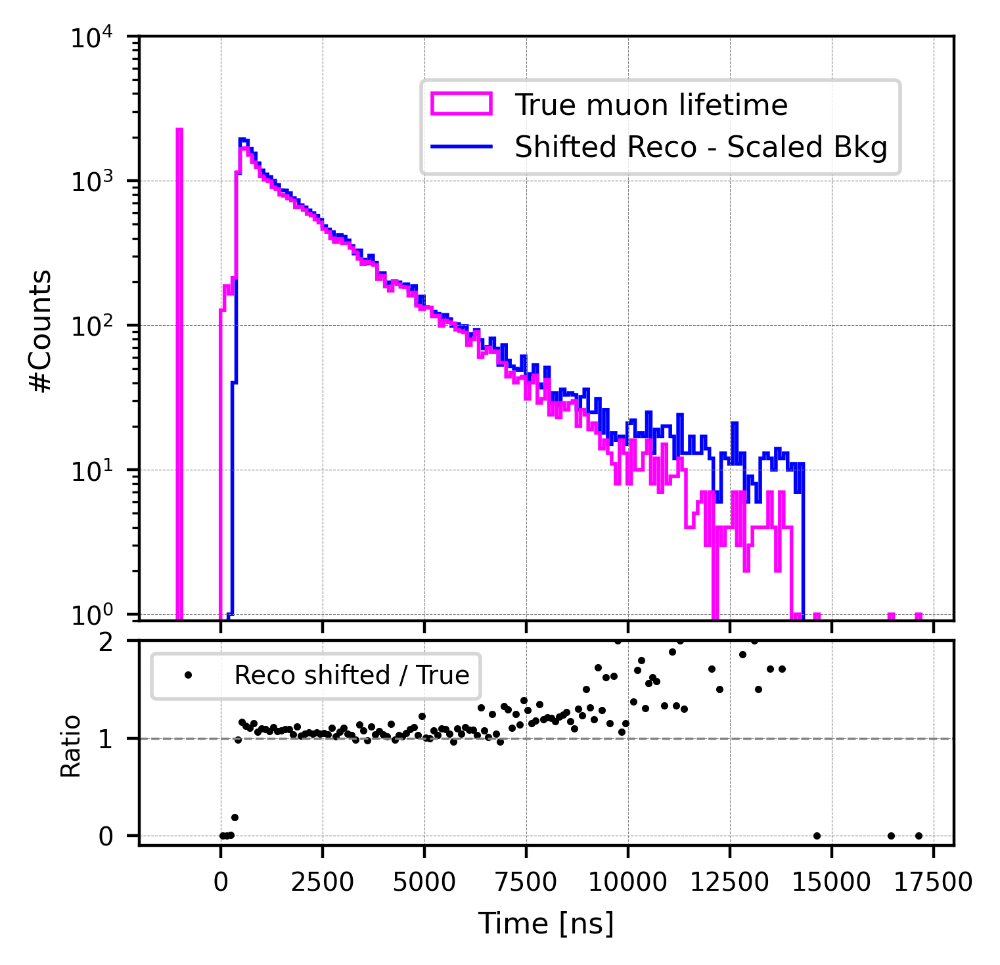

In [81]:
# Binning:
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])






hist_true, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))
hist_reco_shift40 = h_reco_subtracted

ratio = np.full_like(hist_true, np.nan, dtype=float)
mask = (hist_true > 0) & (centers > 0)
ratio[mask] = hist_reco_shift40[mask] / hist_true[mask]

# ============================================================
fig = plt.figure(figsize=(4, 4), dpi=400)

gs = GridSpec(2, 1, height_ratios=[4, 1.4], hspace=0.05)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# Top panel: keep histogram drawing
ax1.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0, label='True muon lifetime')

ax1.stairs(h_reco_subtracted, bins, color='blue', linewidth=1.0, label='Shifted Reco - Scaled Bkg')

ax1.set_xlim(-2000, 18000)
ax1.set_ylim(0.9, 10000)
ax1.set_yscale("log")
ax1.set_ylabel('#Counts', fontsize=8)
ax1.tick_params(labelsize=7)
ax1.tick_params(labelbottom=False)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95),
           markerscale=5, ncol=1, prop={'size':8})

# Bottom panel: shifted reco / true
ax2.plot(centers[mask], ratio[mask], 'o', ms=1.0, color='black', label='Reco shifted / True')

ax2.axhline(1.0, linestyle='--', linewidth=0.6, color='gray')

ax2.set_xlim(-2000, 18000)
#ax2.set_xlim(0, 2000)
ax2.set_ylim(-0.1, 2.0)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('Ratio', fontsize=7)
ax2.tick_params(labelsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(fontsize=7, loc='upper left')
plt.show()



<br />
<br />
<br />
<br />
<br />

## Lifetime measurement efficiency:

#### Initial True Michel and Final True Michel---



Length of trueMichel_initial:  397145
Length of trueT_total_purify9 (Time>0):  31278


Time>384ns:
Length of trueMichel_initial (Time>384ns):  316072
Length of trueT_total_purify9 (Time>384ns):  30586





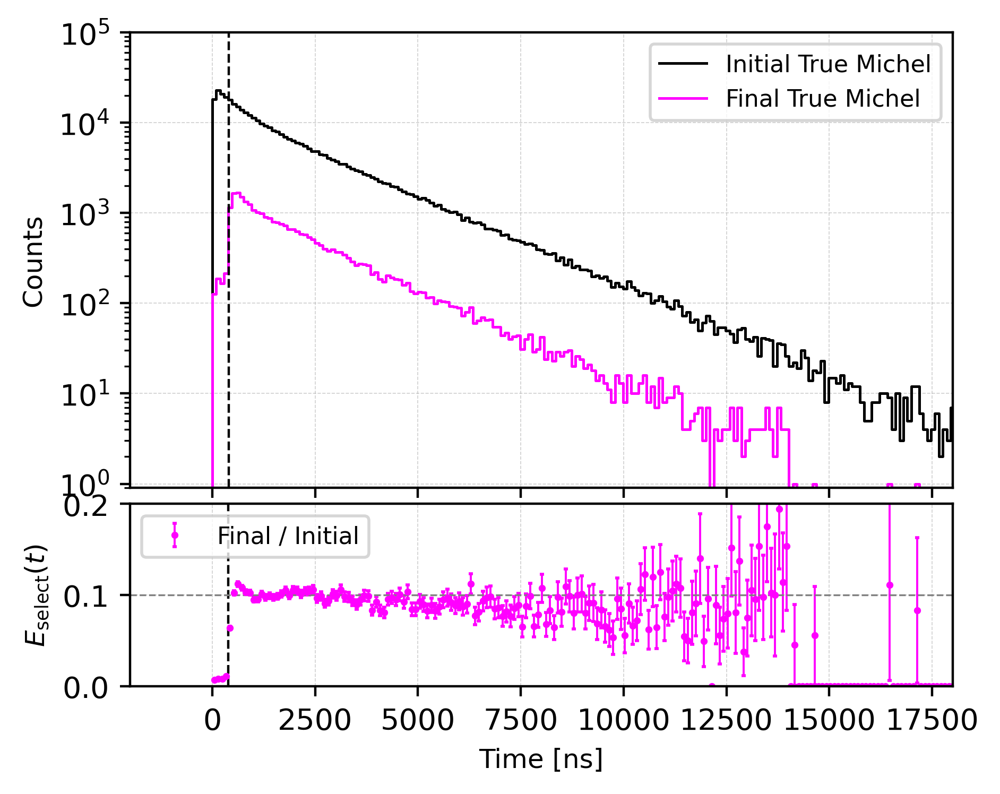

✅ Efficiency ratio and binomial uncertainties stored.
  Number of bins: 2000
  Example efficiency range: 0.000–0.194
  Mean relative error: 21.097%
Saved efficiency ratios to michel_efficiency_ratios_combined.npz
  → bins:   (232,)
  → ratio:  (232,)
  → error:  (232,)


/var/folders/c9/547_2pf11mv74b226lzvqwj00000gn/T/ipykernel_55809/2542063812.py:106: RuntimeWarning: invalid value encountered in divide
  rel_err = err_eff[mask] / eff[mask]


In [119]:
# Binomial selecion model----------

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy.ma as ma

# ----------------------------- Inputs ---------------------------------
trueMichel_initial = np.load("trueMichel_initial_combined.npy", allow_pickle=True).tolist()
trueT_total_purify9 = np.asarray(trueT_total_purify9)
n_positive = np.count_nonzero(trueT_total_purify9 > 0)
print("\n\nLength of trueMichel_initial: ", len(trueMichel_initial))
print("Length of trueT_total_purify9 (Time>0): ", n_positive)

print("\n\nTime>384ns:")
n_initial_gt_384 = np.count_nonzero(np.asarray(trueMichel_initial) > 384)
n_time_gt_384 = np.count_nonzero(trueT_total_purify9 > 384)
print("Length of trueMichel_initial (Time>384ns): ", n_initial_gt_384)
print("Length of trueT_total_purify9 (Time>384ns): ", n_time_gt_384)
print("\n\n")


# ----------------------------- Binning --------------------------------
bin_width = 96
range_min, range_max = -96000, 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])
nb = len(centers)

# ----------------------------- Histos ---------------------------------
I, _ = np.histogram(trueMichel_initial, bins=bins, range=(range_min, range_max))
F, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))

I = I.astype(float)
F = np.minimum(F.astype(float), I)  # guard: ensure F ≤ I
mask = I > 0

# ----------------------------- Efficiency -----------------------------
# Conditional binomial model:
# In each true-lifetime bin, Final True Michel is a subset of Initial True Michel.
# Therefore F_i | I_i ~ Binomial(I_i, epsilon_i), not two independent Poisson counts.
eff = np.full(nb, np.nan)
eff[mask] = F[mask] / I[mask]

# Binomial (conditional) uncertainty: sqrt(p(1-p)/I)
err_eff = np.full(nb, np.nan)
err_eff[mask] = np.sqrt(np.clip(eff[mask] * (1 - eff[mask]) / I[mask], 0, np.inf))

# Covariance: diagonal only (bins independent)
Cov_eff = np.zeros((nb, nb))
Cov_eff[np.diag_indices(nb)] = np.nan_to_num(err_eff ** 2, nan=0.0)


# ----------------------------- Plots ----------------------------------
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[5, 2], hspace=0.05)

# Top panel: counts
ax1 = fig.add_subplot(gs[0])

I_closed = np.append(I, 0.0)
F_closed = np.append(F, 0.0)

ax1.step(bins, I_closed, where='post', color='black', lw=0.9, label='Initial True Michel')
ax1.step(bins, F_closed, where='post', color='magenta', lw=0.9, label='Final True Michel')




ax1.set_yscale('log')
ax1.set_ylim(0.9, 100000)
ax1.set_xlim(-2000, 18000)
ax1.axvline(396, ls='--', c='k', lw=0.8)
ax1.set_ylabel('Counts', fontsize=9)
#ax1.set_title("Michel Lifetime Detection Efficiencies", fontsize=9)
ax1.legend(fontsize=8, loc='upper right')
ax1.grid(ls='--', lw=0.3, alpha=0.6)
ax1.tick_params(labelbottom=False)

# Bottom panel: efficiency
ax2 = fig.add_subplot(gs[1], sharex=ax1)
ax2.errorbar(centers[mask], eff[mask], yerr=err_eff[mask],
             fmt='o', ms=1.4, elinewidth=0.7, capsize=0.7,
             color='magenta', label='Final / Initial')
ax2.axvline(384, ls='--', c='k', lw=0.8)
ax2.axhline(0.1, ls='--', c='gray', lw=0.6)
ax2.set_xlim(-2000, 18000)
ax2.set_ylim(0.0, 0.2)
ax2.set_xlabel('Time [ns]', fontsize=9)
ax2.set_ylabel(r'$E_{\mathrm{select}}(t)$', fontsize=9)
ax2.grid(ls='--', lw=0.3, alpha=0.6)
ax2.legend(fontsize=8, loc='upper left')
plt.show()

# ----------------------------- Save Results ---------------------------
lifetime_efficiency = eff.copy()
lifetime_efficiency_unc = err_eff.copy()
Cov_efficiency = Cov_eff.copy()
bin_edges_eff = bins.copy()
bin_centers_eff = centers.copy()

print("✅ Efficiency ratio and binomial uncertainties stored.")
print(f"  Number of bins: {len(lifetime_efficiency)}")
print(f"  Example efficiency range: {np.nanmin(lifetime_efficiency):.3f}–{np.nanmax(lifetime_efficiency):.3f}")

rel_err = err_eff[mask] / eff[mask]
print(f"  Mean relative error: {np.nanmean(rel_err):.3%}")



# ============================================================
# Save efficiency ratios and uncertainties for later notebook use
# ============================================================

# Keep only valid (I > 0) bins
valid_idx = np.where(I > 0)[0]


# Prepare arrays
bins_save   = centers[valid_idx]
ratio_save  = eff[valid_idx]
error_save  = err_eff[valid_idx]

# Save to a compressed .npz file
np.savez("michel_efficiency_ratios_combined.npz",
         bins=bins_save,
         ratio=ratio_save,
         error=error_save)

print("Saved efficiency ratios to michel_efficiency_ratios_combined.npz")
print(f"  → bins:   {bins_save.shape}")
print(f"  → ratio:  {ratio_save.shape}")
print(f"  → error:  {error_save.shape}")




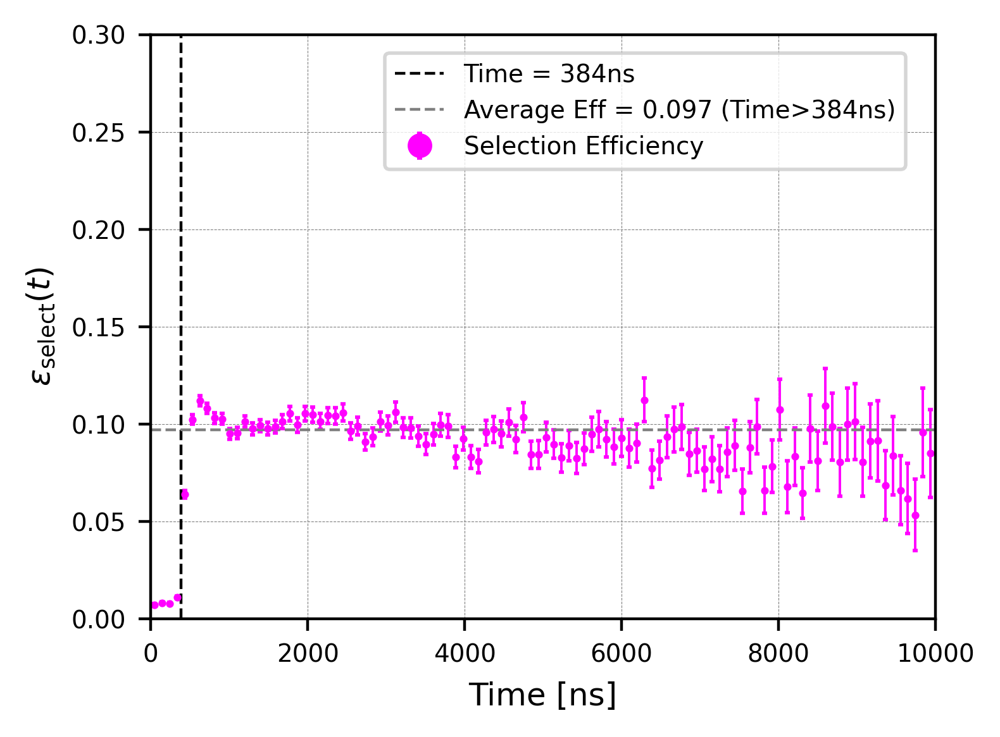

In [142]:
from iminuit import Minuit
from iminuit.cost import LeastSquares

# check and update error propagation; draw the efficiency plot
# chat with chatGPT about how to fitting? How to deal with first several bins? 
# initial MC truth; final MC truth; final DATA reco!


# ============================================================
# Independent plot: Efficiency ratio with uncertainties
# ============================================================
plt.figure(figsize=(4,3),dpi=400)

plt.errorbar(
    centers[mask],
    eff[mask],
    yerr=err_eff[mask],
    fmt='o',
    ms=1.2, # marker size
    elinewidth=0.7,
    capsize=0.7,
    color='magenta',
    label='Selection Efficiency'
)

plt.axvline(384, ls='--', c='k', lw=0.8, label='Time = 384ns')
#plt.axvline(10000, ls='--', c='k', lw=0.8, label='Time = 10000ns')
#plt.axvline(2600, ls='--', c='k', lw=0.8, label='Time = 2600ns')
#33532/
plt.axhline(0.097, ls='--', c='gray', lw=0.8, label='Average Eff = 0.097 (Time>384ns)')

plt.xlabel("Time [ns]", fontsize=9)
plt.ylabel(r"$\epsilon_{\mathrm{select}}(t)$", fontsize=9)
plt.xlim(0, 10000)
plt.ylim(0.0, 0.3)
#plt.title("Michel Selection Efficiency (MC)", fontsize=9)

plt.tick_params(axis="both", which="major", labelsize=7)

plt.legend(loc='upper center', bbox_to_anchor=(0.63, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size':7})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()




<br />
<br />

#### Fit efficiency points:

In [132]:
# Select bin centers in the interval [384, 10000] ns
time_mask = (centers >= 384) & (centers <= 10000)

centers_selected = centers[time_mask]
eff_selected = eff[time_mask]
err_eff_selected = err_eff[time_mask]

print("Selected bins:", np.count_nonzero(time_mask))
print("Selected range:", centers_selected[0], "to", centers_selected[-1], "ns")



# Confirm that all efficiency arrays use the same binning
print(len(centers), len(I), len(F), len(eff), len(err_eff))

fit_mask = ((centers >= 384) & (centers <= 10000) & (I > 0))

t_fit = centers[fit_mask]
n_fit = I[fit_mask]
k_fit = F[fit_mask]
p_fit = k_fit / n_fit



bin_width = 96
range_min = -96000
range_max = 96000

bins = np.arange(range_min, range_max + bin_width,bin_width)

centers = 0.5 * (bins[:-1] + bins[1:])

I, _ = np.histogram(trueMichel_initial, bins=bins)

F, _ = np.histogram(trueT_total_purify9, bins=bins)

I = I.astype(float)
F = F.astype(float)

fit_mask = ((centers >= 384) & (centers <= 10000) & (I > 0))

t_fit = centers[fit_mask]
n_fit = I[fit_mask]
k_fit = F[fit_mask]
p_fit = k_fit / n_fit

print("Total bins:", len(centers))  # 2000
print("Bins selected for fit:", np.count_nonzero(fit_mask))

Selected bins: 100
Selected range: 432.0 to 9936.0 ns
2000 2000 2000 2000 2000
Total bins: 2000
Bins selected for fit: 100


In [133]:
### Fit with a binomial cubic B-spline ===========================


import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from patsy import dmatrix, build_design_matrices

# Inputs already produced:
# t_fit = centers[fit_mask]
# n_fit = I[fit_mask]
# k_fit = F[fit_mask]
# p_fit = k_fit / n_fit

if np.any(k_fit > n_fit):
    raise ValueError("Some selected counts F are larger than initial counts I.")

t_min = 384.0
t_max = 10000.0

# Closely spaced knots describe the rapid early-time structure.
# Wider spacing suppresses fluctuations at later times.
#internal_knots = (500, 650, 900, 1300, 1800, 2500, 4000, 6000, 8000)

# Mild reduction: remove only the 8000 ns knot
#internal_knots = (500, 650, 900, 1300, 1800, 2500, 4000, 6000)

# Recommended: retain early-time flexibility and smooth the late-time region
#internal_knots = (500, 650, 900, 1300, 1800, 2500, 4000)

# [Nominal (Current BEST!)]
internal_knots = (500, 650, 900, 1300, 1800, 2500)

# Strong smoothing: one broad tail after 2500 ns
#internal_knots = (500, 650, 900, 1300, 1800)


spline_formula = f"bs(t, knots={internal_knots}, degree=3, include_intercept=False, lower_bound={t_min}, upper_bound={t_max})"

X_fit = dmatrix(spline_formula, {"t": t_fit}, return_type="dataframe")
design_info = X_fit.design_info

# F_i | I_i follows a binomial distribution
model = sm.GLM(p_fit, X_fit, family=sm.families.Binomial(), freq_weights=n_fit)
result = model.fit()

print(result.summary())
print("AIC:", result.aic)
print("Deviance:", result.deviance)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                  100
Model:                            GLM   Df Residuals:                   312415
Model Family:                Binomial   Df Model:                            9
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -72306.
Date:                Thu, 27 Aug 2026   Deviance:                       75.149
Time:                        16:46:09   Pearson chi2:                     74.9
No. Iterations:                     6   Pseudo R-squ. (CS):             0.9783
Covariance Type:            nonrobust                                         
                                                                                                                                   coef    std err          z      P>|z|      [0.025      0.975]
-----------------

In [134]:
# ----------------------- Smooth prediction ----------------------------

t_smooth = np.linspace(t_min, t_max, 2000)

# Reuse exactly the same spline basis and knots used in the fit
X_smooth = np.asarray(build_design_matrices([design_info], {"t": t_smooth})[0])

# Approximate 68.3% confidence interval
prediction = result.get_prediction(X_smooth)
prediction_table = prediction.summary_frame(alpha=0.3173)

eff_smooth = prediction_table["mean"].to_numpy()
eff_lower = prediction_table["mean_ci_lower"].to_numpy()
eff_upper = prediction_table["mean_ci_upper"].to_numpy()

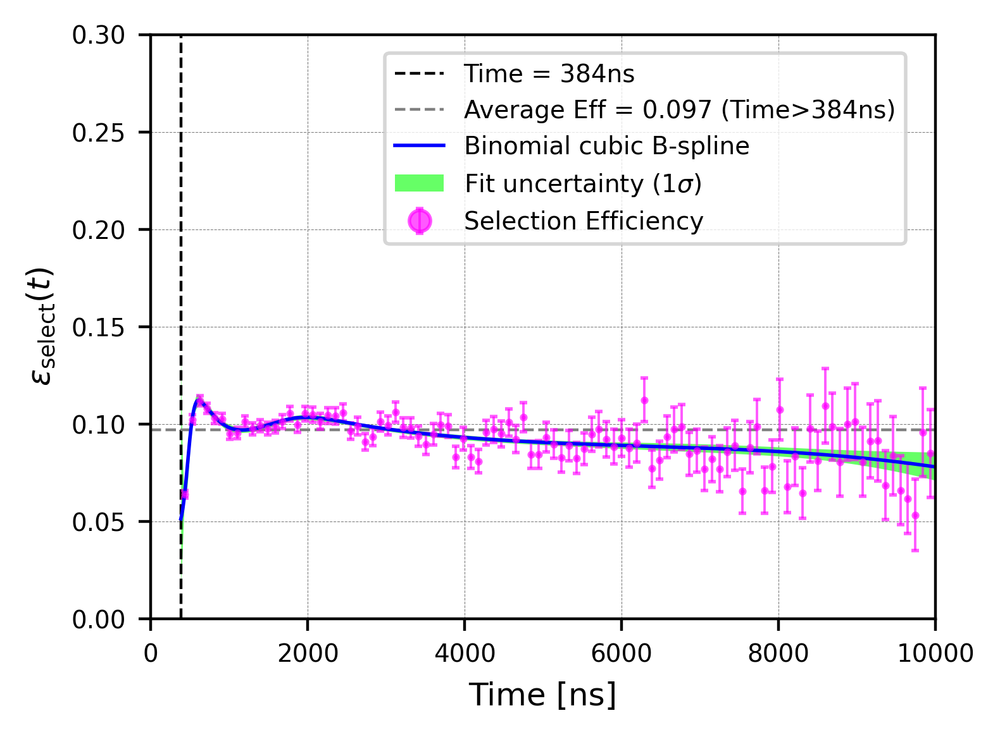

In [155]:
# ----------------------------- Plot -----------------------------------

plt.figure(figsize=(4, 3), dpi=400)

plt.axvline(384, ls='--', c='k', lw=0.8, label='Time = 384ns')
#plt.axvline(10000, ls='--', c='k', lw=0.8, label='Time = 10000ns')
#plt.axvline(2600, ls='--', c='k', lw=0.8, label='Time = 2600ns')
#33532/
plt.axhline(0.097, ls='--', c='gray', lw=0.8, label='Average Eff = 0.097 (Time>384ns)')

plt.errorbar(t_fit, p_fit, yerr=err_eff[fit_mask], fmt="o", ms=1.2,
             elinewidth=0.7, capsize=1.0, color="magenta", alpha=0.65,
             label="Selection Efficiency")

plt.plot(t_smooth, eff_smooth, color="blue", lw=1.0,
         label="Binomial cubic B-spline")

plt.fill_between(t_smooth, eff_lower, eff_upper, color="lime",
                 alpha=0.6, linewidth=0, label=r"Fit uncertainty ($1\sigma$)")






plt.xlabel("Time [ns]", fontsize=9)
plt.ylabel(r"$\epsilon_{\mathrm{select}}(t)$", fontsize=9)
plt.xlim(0, 10000)
plt.ylim(0.0, 0.3)
#plt.title("Michel Selection Efficiency (MC)", fontsize=9)

plt.tick_params(axis="both", which="major", labelsize=7)

plt.legend(loc='upper center', bbox_to_anchor=(0.63, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size':7})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()

In [88]:
from scipy.stats import chi2

n_bins = len(k_fit)
n_parameters = X_fit.shape[1]
ndof_bins = n_bins - n_parameters

deviance = result.deviance
pearson_chi2 = result.pearson_chi2

deviance_per_ndof = deviance / ndof_bins
pearson_per_ndof = pearson_chi2 / ndof_bins

deviance_pvalue = chi2.sf(deviance, ndof_bins)
pearson_pvalue = chi2.sf(pearson_chi2, ndof_bins)

print("Number of fitted bins:", n_bins)
print("Number of fit parameters:", n_parameters)
print("Bin-level degrees of freedom:", ndof_bins)

print(f"Deviance / ndof: {deviance_per_ndof:.3f}")
print(f"Deviance p-value: {deviance_pvalue:.3f}")

print(f"Pearson chi-square / ndof: {pearson_per_ndof:.3f}")
print(f"Pearson p-value: {pearson_pvalue:.3f}")

Number of fitted bins: 100
Number of fit parameters: 10
Bin-level degrees of freedom: 90
Deviance / ndof: 0.835
Deviance p-value: 0.870
Pearson chi-square / ndof: 0.833
Pearson p-value: 0.873


In [89]:
# ============================================================
# Save fitted efficiency at the original 96 ns bin centers
# ============================================================

from patsy import build_design_matrices

save_mask = (centers >= 384) & (centers <= 10000)

time_save = centers[save_mask]
bin_low_save = bins[:-1][save_mask]
bin_high_save = bins[1:][save_mask]

# Reconstruct exactly the same spline basis used in the fit
X_save = np.asarray(
    build_design_matrices([design_info], {"t": time_save})[0]
)

# Fitted efficiency and pointwise 68.3% confidence interval
prediction_save = result.get_prediction(X_save)
prediction_table = prediction_save.summary_frame(alpha=0.3173)

eff_save = prediction_table["mean"].to_numpy()
eff_low_save = prediction_table["mean_ci_lower"].to_numpy()
eff_high_save = prediction_table["mean_ci_upper"].to_numpy()

# Asymmetric pointwise uncertainties
eff_err_low_save = eff_save - eff_low_save
eff_err_high_save = eff_high_save - eff_save

# ============================================================
# Full covariance between fitted efficiency values
# ============================================================

cov_beta = np.asarray(result.cov_params())

# d epsilon / d beta = epsilon * (1 - epsilon) * X
G_save = eff_save[:, None] * (1.0 - eff_save[:, None]) * X_save

cov_eff_save = G_save @ cov_beta @ G_save.T
eff_sigma_save = np.sqrt(np.diag(cov_eff_save))

print("Number of saved bins:", len(time_save))
print("Saved center range:", time_save[0], "to", time_save[-1], "ns")

Number of saved bins: 100
Saved center range: 432.0 to 9936.0 ns


In [90]:
# Save both the original measurements and fitted results:
np.savez_compressed(
    "michel_efficiency_bspline_10par.npz",

    # Binning
    bin_center=time_save,
    bin_low=bin_low_save,
    bin_high=bin_high_save,

    # Original histogram counts and measured efficiency
    initial_counts=I[save_mask],
    selected_counts=F[save_mask],
    measured_efficiency=eff[save_mask],
    measured_efficiency_error=err_eff[save_mask],

    # Fitted efficiency at each bin center
    fitted_efficiency=eff_save,
    fitted_efficiency_sigma=eff_sigma_save,
    fitted_efficiency_low_68=eff_low_save,
    fitted_efficiency_high_68=eff_high_save,
    fitted_efficiency_error_low=eff_err_low_save,
    fitted_efficiency_error_high=eff_err_high_save,

    # Correlated fit uncertainty
    covariance_fitted_efficiency=cov_eff_save,

    # Spline fit information
    spline_parameters=np.asarray(result.params),
    covariance_parameters=cov_beta,
    internal_knots=np.asarray(internal_knots),
    fit_lower_bound=t_min,
    fit_upper_bound=t_max,
    spline_degree=3
)

print("Saved measured and fitted efficiencies.")

Saved measured and fitted efficiencies.


#### Old Segmented Fit of Efficiency Distribution

Segmented fit: [384, tb] = Gaussian + Chebyshev(2), [tb, ...] = linear
  t_b      = 2000.0 ns (fixed)
  c0       = 0.073863 ± 0.008803
  c1       = 0.044475 ± 0.013396
  c2       = -0.017949 ± 0.004750
  A        = 0.067779 ± 0.017567
  mu       = 608.33 ± 31.21 ns
  sigma    = 222.33 ± 45.21 ns
  m_tail   = -3.037420e-06 ± 4.297943e-07 /ns
  chi2     = 115.00
  ndf      = 93
  chi2/ndf = 1.237


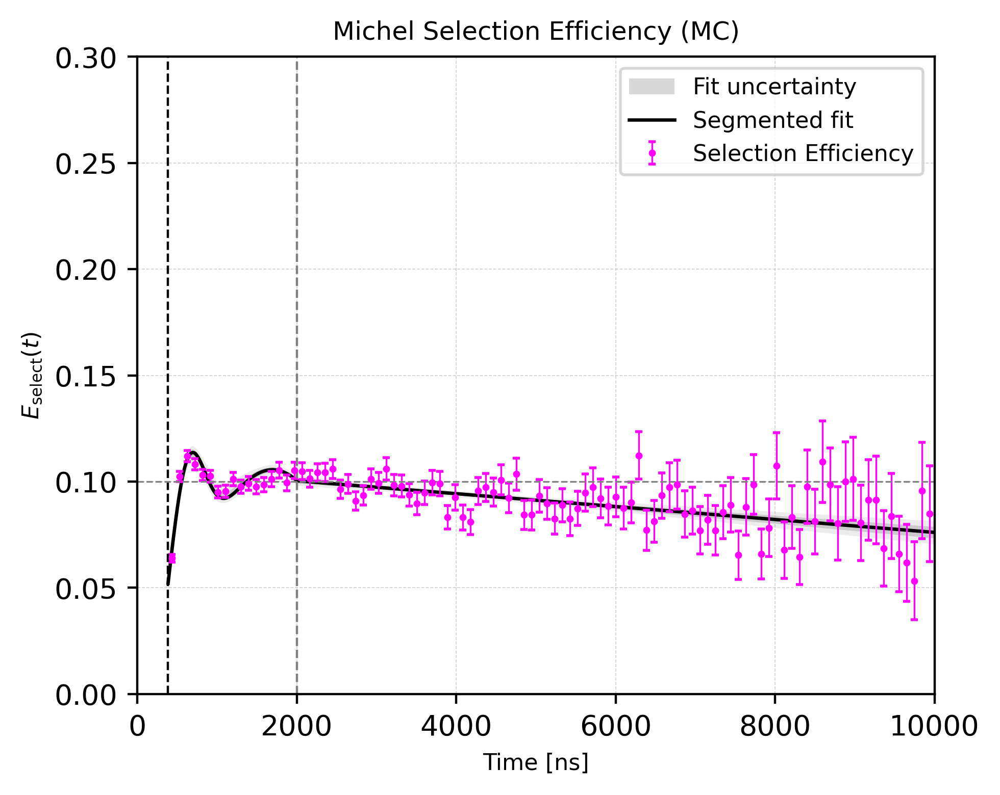

Saved to michel_efficiency_fit_segmented_cheb2_gaus.npz


In [45]:
import numpy as np
import matplotlib.pyplot as plt
from iminuit import Minuit
from iminuit.cost import LeastSquares

# ============================================================
# 0. Inputs
#    Assumes you already have:
#        centers, eff, err_eff
# ============================================================
fit_mask = (
    (centers >= 384) &
    (centers <= 10000) &
    np.isfinite(eff) &
    np.isfinite(err_eff) &
    (err_eff > 0)
)

x_fit = centers[fit_mask]
y_fit = eff[fit_mask]
yerr_fit = err_eff[fit_mask]

t0 = 384.0
t_b = 2000.0   # try 2500, 2800, 3000, 3500

# ============================================================
# 1. Helpers
# ============================================================
def cheb_u(t, t_left, t_right):
    """
    Map t in [t_left, t_right] to u in [-1, 1].
    """
    return 2.0 * (t - t_left) / (t_right - t_left) - 1.0

def cheb2(u, c0, c1, c2):
    """
    2nd-order Chebyshev polynomial:
      T0 = 1
      T1 = u
      T2 = 2u^2 - 1
    """
    T0 = np.ones_like(u)
    T1 = u
    T2 = 2.0 * u * u - 1.0
    return c0 * T0 + c1 * T1 + c2 * T2

# ============================================================
# 2. Segmented model:
#    [384, tb] : Gaussian + 2nd-order Chebyshev
#    [tb, ...] : continuous linear tail
# ============================================================
def eff_segmented_cheb_gaus(t, c0, c1, c2, A, mu, sigma, m_tail):
    t = np.asarray(t, dtype=float)

    # ---------- early piece ----------
    u = cheb_u(t, t0, t_b)
    poly = cheb2(u, c0, c1, c2)
    gaus = A * np.exp(-0.5 * ((t - mu) / sigma) ** 2)
    early = poly + gaus

    # ---------- continuity at tb ----------
    u_tb = cheb_u(np.array([t_b]), t0, t_b)[0]
    e_tb = cheb2(np.array([u_tb]), c0, c1, c2)[0] + A * np.exp(-0.5 * ((t_b - mu) / sigma) ** 2)

    # ---------- late piece ----------
    late = e_tb + m_tail * (t - t_b)

    return np.where(t < t_b, early, late)

# ============================================================
# 3. Fit with Minuit
# ============================================================
least_squares = LeastSquares(x_fit, y_fit, yerr_fit, eff_segmented_cheb_gaus)

m = Minuit(
    least_squares,
    c0=0.105,
    c1=0.000,
    c2=0.000,
    A=0.018,
    mu=650.0,
    sigma=140.0,
    m_tail=-3.0e-6
)

# limits
m.limits["c0"] = (0.00, 0.30)
m.limits["c1"] = (-0.20, 0.20)
m.limits["c2"] = (-0.20, 0.20)

m.limits["A"] = (0.00, 0.10)
m.limits["mu"] = (450.0, 1200.0)
m.limits["sigma"] = (30.0, 600.0)

m.limits["m_tail"] = (-1e-4, 0.0)

m.migrad()
m.hesse()

# ============================================================
# 4. Print result
# ============================================================
print("============================================================")
print("Segmented fit: [384, tb] = Gaussian + Chebyshev(2), [tb, ...] = linear")
print(f"  t_b      = {t_b:.1f} ns (fixed)")
print(f"  c0       = {m.values['c0']:.6f} ± {m.errors['c0']:.6f}")
print(f"  c1       = {m.values['c1']:.6f} ± {m.errors['c1']:.6f}")
print(f"  c2       = {m.values['c2']:.6f} ± {m.errors['c2']:.6f}")
print(f"  A        = {m.values['A']:.6f} ± {m.errors['A']:.6f}")
print(f"  mu       = {m.values['mu']:.2f} ± {m.errors['mu']:.2f} ns")
print(f"  sigma    = {m.values['sigma']:.2f} ± {m.errors['sigma']:.2f} ns")
print(f"  m_tail   = {m.values['m_tail']:.6e} ± {m.errors['m_tail']:.6e} /ns")
print(f"  chi2     = {m.fval:.2f}")
print(f"  ndf      = {len(x_fit) - m.nfit}")
print(f"  chi2/ndf = {m.fval / (len(x_fit) - m.nfit):.3f}")
print("============================================================")

# ============================================================
# 5. Best-fit curve
# ============================================================
x_draw = np.linspace(384, 10000, 1400)
y_best = eff_segmented_cheb_gaus(
    x_draw,
    m.values["c0"],
    m.values["c1"],
    m.values["c2"],
    m.values["A"],
    m.values["mu"],
    m.values["sigma"],
    m.values["m_tail"]
)

# Optional decomposition for plotting
x_early = x_draw[x_draw < t_b]
u_early = cheb_u(x_early, t0, t_b)
poly_early = cheb2(u_early, m.values["c0"], m.values["c1"], m.values["c2"])
gaus_early = m.values["A"] * np.exp(-0.5 * ((x_early - m.values["mu"]) / m.values["sigma"]) ** 2)

# ============================================================
# 6. Uncertainty band from covariance toys
# ============================================================
par_names = m.parameters
p_best = np.array([m.values[name] for name in par_names], dtype=float)
cov = np.array(m.covariance)

rng = np.random.default_rng(12345)
n_toys = 3000

toy_pars = rng.multivariate_normal(mean=p_best, cov=cov, size=n_toys)
toy_curves = np.array([eff_segmented_cheb_gaus(x_draw, *pars) for pars in toy_pars])

band_lo_1s = np.percentile(toy_curves, 16, axis=0)
band_hi_1s = np.percentile(toy_curves, 84, axis=0)

band_lo_2s = np.percentile(toy_curves, 2.5, axis=0)
band_hi_2s = np.percentile(toy_curves, 97.5, axis=0)

# ============================================================
# 7. Plot in your style
# ============================================================
plt.figure(figsize=(5, 4), dpi=400)

plt.fill_between(
    x_draw, band_lo_2s, band_hi_2s,
    color='gray', alpha=0.15, linewidth=0
)

plt.fill_between(
    x_draw, band_lo_1s, band_hi_1s,
    color='gray', alpha=0.30, linewidth=0,
    label='Fit uncertainty'
)

plt.plot(
    x_draw, y_best,
    color='black', lw=1.2,
    label='Segmented fit'
)

plt.errorbar(
    x_fit, y_fit, yerr=yerr_fit,
    fmt='o',
    ms=1.5,
    elinewidth=0.6,
    capsize=1.2,
    color='magenta',
    label='Selection Efficiency'
)

# Optional: show early components
# plt.plot(x_early, poly_early, ls='--', lw=0.8, color='gray', alpha=0.8)
# plt.plot(x_early, poly_early + gaus_early, ls=':', lw=0.8, color='blue', alpha=0.8)

plt.axvline(384, ls='--', c='k', lw=0.8)
plt.axvline(t_b, ls='--', c='gray', lw=0.8)
plt.axhline(0.1, ls='--', c='gray', lw=0.6)

plt.xlim(0, 10000)
plt.ylim(0.0, 0.30)

plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel(r'$E_{\mathrm{select}}(t)$', fontsize=8)
plt.title("Michel Selection Efficiency (MC)", fontsize=9)

plt.grid(ls='--', lw=0.3, alpha=0.6)
plt.legend(fontsize=8, loc='upper right')

plt.tight_layout()
plt.show()

# ============================================================
# 8. Save result
# ============================================================
np.savez(
    "michel_efficiency_fit_segmented_cheb2_gaus.npz",
    x_draw=x_draw,
    y_best=y_best,
    band_lo_1s=band_lo_1s,
    band_hi_1s=band_hi_1s,
    band_lo_2s=band_lo_2s,
    band_hi_2s=band_hi_2s,
    t_b=t_b,
    c0=m.values["c0"],
    c1=m.values["c1"],
    c2=m.values["c2"],
    A=m.values["A"],
    mu=m.values["mu"],
    sigma=m.values["sigma"],
    m_tail=m.values["m_tail"]
)

print("Saved to michel_efficiency_fit_segmented_cheb2_gaus.npz")

/var/folders/c9/547_2pf11mv74b226lzvqwj00000gn/T/ipykernel_55809/670233449.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


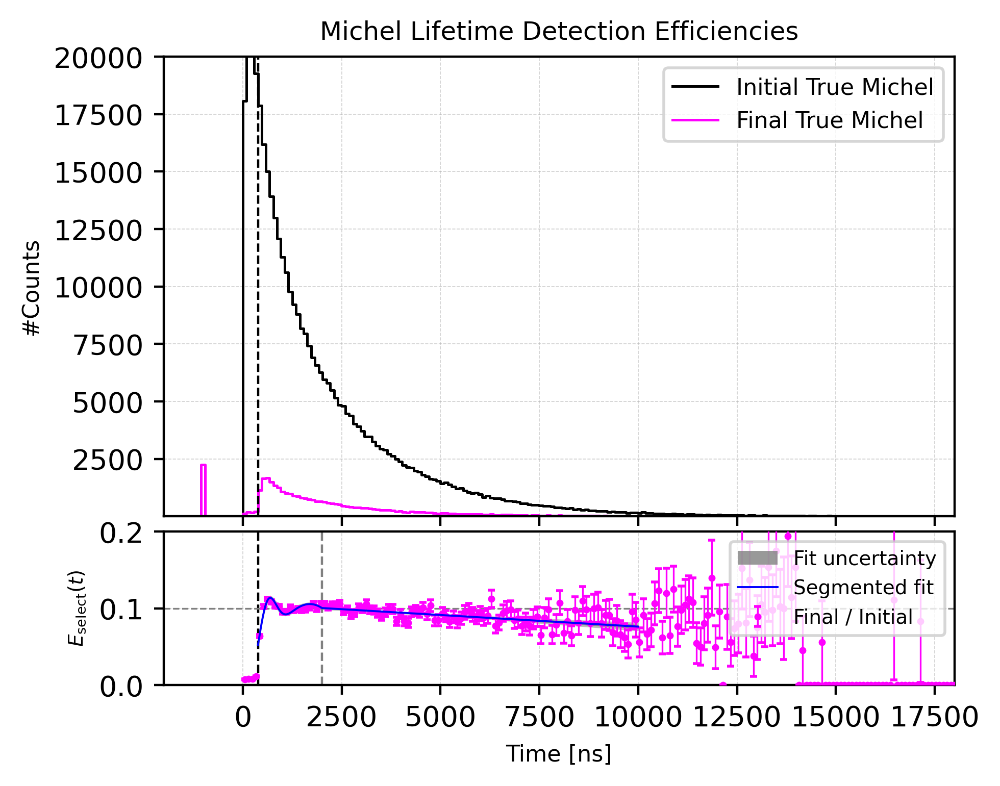

In [46]:
# ----------------------------- Plots ----------------------------------
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[3, 1], hspace=0.05)

# ============================================================
# Top panel: counts
# ============================================================
ax1 = fig.add_subplot(gs[0])

I_closed = np.append(I, 0.0)
F_closed = np.append(F, 0.0)

ax1.step(bins, I_closed, where='post', color='black', lw=0.9, label='Initial True Michel')
ax1.step(bins, F_closed, where='post', color='magenta', lw=0.9, label='Final True Michel')

# ax1.set_yscale('log')
ax1.set_ylim(0.9, 20000)
ax1.set_xlim(-2000, 18000)
ax1.axvline(384, ls='--', c='k', lw=0.8)

ax1.set_ylabel('#Counts', fontsize=8)
ax1.set_title("Michel Lifetime Detection Efficiencies", fontsize=9)
ax1.legend(fontsize=8, loc='upper right')
ax1.grid(ls='--', lw=0.3, alpha=0.6)
ax1.tick_params(labelbottom=False)

# ============================================================
# Bottom panel: efficiency + fit
# ============================================================
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# --- uncertainty bands (draw first, lowest layer) ---
ax2.fill_between(
    x_draw, band_lo_2s, band_hi_2s,
    color='gray', alpha=0.5, linewidth=0,
    zorder=1
)

ax2.fill_between(
    x_draw, band_lo_1s, band_hi_1s,
    color='gray', alpha=0.80, linewidth=0,
    label='Fit uncertainty',
    zorder=2
)

# --- efficiency points ---
ax2.errorbar(
    centers[mask], eff[mask], yerr=err_eff[mask],
    fmt='o', ms=1.5, elinewidth=0.6, capsize=1.2,
    color='magenta',
    label='Final / Initial',
    zorder=3
)

# --- fitted curve (draw LAST so it sits on top) ---
ax2.plot(
    x_draw, y_best,
    color='blue', lw=0.7,
    label='Segmented fit',
    zorder=4
)

# --- guide lines ---
ax2.axvline(384, ls='--', c='k', lw=0.8)
ax2.axvline(t_b, ls='--', c='gray', lw=0.8)
ax2.axhline(0.1, ls='--', c='gray', lw=0.6)

ax2.set_xlim(-2000, 18000)
ax2.set_ylim(0.0, 0.2)

ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel(r'$E_{\mathrm{select}}(t)$', fontsize=7)

ax2.grid(ls='--', lw=0.3, alpha=0.6)

# legend on right side
ax2.legend(fontsize=7, loc='upper right')


plt.tight_layout()
plt.show()

<br />
<br />
<br />

### Explore Efficiency After Each Cut



In [47]:
#Initial true lifetime (combined) distributions was read from trueMichel_initial_combined.npy
#Initial true lifetime: trueMichel_initial

lifetime_e_initial = np.load("lifetime_e_initial.npy", allow_pickle=True).tolist()
lifetime_p_initial = np.load("lifetime_p_initial.npy", allow_pickle=True).tolist()
print("\n\n#trueMichel_initial: ", len(trueMichel_initial))
print("#lifetime_e_initial: ", len(lifetime_e_initial))
print("#lifetime_p_initial: ", len(lifetime_p_initial))




# trueT Lifetime (total)==========================================================
trueT_total_purify8 = [ev.true_lifetime for ev in events_total_purify8]
trueT_total_purify8 = np.asarray(trueT_total_purify8)
trueT_total_purify7 = [ev.true_lifetime for ev in events_total_purify7]
trueT_total_purify7 = np.asarray(trueT_total_purify7)
trueT_total_purify6 = [ev.true_lifetime for ev in events_total_purify6]
trueT_total_purify6 = np.asarray(trueT_total_purify6)
trueT_total_purify5p = [ev.true_lifetime for ev in events_total_purify5P]
trueT_total_purify5p = np.asarray(trueT_total_purify5p)
trueT_total_purify5 = [ev.true_lifetime for ev in events_total_purify5]
trueT_total_purify5 = np.asarray(trueT_total_purify5)
trueT_total_purify4 = [ev.true_lifetime for ev in events_total_purify4]
trueT_total_purify4 = np.asarray(trueT_total_purify4)

trueT_total_purify3 = [ev.lifetime*1000 for ev in events_true_update2]#after muTime<MiTime
trueT_total_purify3 = np.asarray(trueT_total_purify3)
trueT_total_purify2 = [ev.lifetime*1000 for ev in events_true_update1]#after 120<muTime<130
trueT_total_purify2 = np.asarray(trueT_total_purify2)
trueT_total_purify1 = [ev.lifetime*1000 for ev in events_true_initial]#after opWVF>=3
trueT_total_purify1 = np.asarray(trueT_total_purify1)




# trueT Lifetime (e^-)==========================================================
trueT_total_purify9_e = [ev.true_lifetime for ev in events_total_purify9 if 0 < ev.pdg]
trueT_total_purify9_e = np.asarray(trueT_total_purify9_e)
trueT_total_purify8_e = [ev.true_lifetime for ev in events_total_purify8 if 0 < ev.pdg]
trueT_total_purify8_e = np.asarray(trueT_total_purify8_e)
trueT_total_purify7_e = [ev.true_lifetime for ev in events_total_purify7 if 0 < ev.pdg]
trueT_total_purify7_e = np.asarray(trueT_total_purify7_e)
trueT_total_purify6_e = [ev.true_lifetime for ev in events_total_purify6 if 0 < ev.pdg]
trueT_total_purify6_e = np.asarray(trueT_total_purify6_e)
trueT_total_purify5p_e = [ev.true_lifetime for ev in events_total_purify5P if 0 < ev.pdg]
trueT_total_purify5p_e = np.asarray(trueT_total_purify5p_e)
trueT_total_purify5_e = [ev.true_lifetime for ev in events_total_purify5 if 0 < ev.pdg]
trueT_total_purify5_e = np.asarray(trueT_total_purify5_e)
trueT_total_purify4_e = [ev.true_lifetime for ev in events_total_purify4 if 0 < ev.pdg]
trueT_total_purify4_e = np.asarray(trueT_total_purify4_e)

trueT_total_purify3_e = [ev.lifetime*1000 for ev in events_true_update2 if 0 < ev.pdg]#after muTime<MiTime
trueT_total_purify3_e = np.asarray(trueT_total_purify3_e)
trueT_total_purify2_e = [ev.lifetime*1000 for ev in events_true_update1 if 0 < ev.pdg]#after 120<muTime<130
trueT_total_purify2_e = np.asarray(trueT_total_purify2_e)
trueT_total_purify1_e = [ev.lifetime*1000 for ev in events_true_initial if 0 < ev.pdg]#after opWVF>=3
trueT_total_purify1_e = np.asarray(trueT_total_purify1_e)




# trueT Lifetime (e^+)==========================================================
trueT_total_purify9_p = [ev.true_lifetime for ev in events_total_purify9 if 0 > ev.pdg]
trueT_total_purify9_p = np.asarray(trueT_total_purify9_p)
trueT_total_purify8_p = [ev.true_lifetime for ev in events_total_purify8 if 0 > ev.pdg]
trueT_total_purify8_p = np.asarray(trueT_total_purify8_p)
trueT_total_purify7_p = [ev.true_lifetime for ev in events_total_purify7 if 0 > ev.pdg]
trueT_total_purify7_p = np.asarray(trueT_total_purify7_p)
trueT_total_purify6_p = [ev.true_lifetime for ev in events_total_purify6 if 0 > ev.pdg]
trueT_total_purify6_p = np.asarray(trueT_total_purify6_p)
trueT_total_purify5p_p = [ev.true_lifetime for ev in events_total_purify5P if 0 > ev.pdg]
trueT_total_purify5p_p = np.asarray(trueT_total_purify5p_p)
trueT_total_purify5_p = [ev.true_lifetime for ev in events_total_purify5 if 0 > ev.pdg]
trueT_total_purify5_p = np.asarray(trueT_total_purify5_p)
trueT_total_purify4_p = [ev.true_lifetime for ev in events_total_purify4 if 0 > ev.pdg]
trueT_total_purify4_p = np.asarray(trueT_total_purify4_p)

trueT_total_purify3_p = [ev.lifetime*1000 for ev in events_true_update2 if 0 > ev.pdg]#after muTime<MiTime
trueT_total_purify3_p = np.asarray(trueT_total_purify3_p)
trueT_total_purify2_p = [ev.lifetime*1000 for ev in events_true_update1 if 0 > ev.pdg]#after 120<muTime<130
trueT_total_purify2_p = np.asarray(trueT_total_purify2_p)
trueT_total_purify1_p = [ev.lifetime*1000 for ev in events_true_initial if 0 > ev.pdg]#after opWVF>=3
trueT_total_purify1_p = np.asarray(trueT_total_purify1_p)






energy_total_initial = np.load("energy_total_initial.npy", allow_pickle=True).tolist()
energy_e_initial = np.load("energy_e_initial.npy", allow_pickle=True).tolist()
energy_p_initial = np.load("energy_p_initial.npy", allow_pickle=True).tolist()
print("\n\n#energy_total_initial: ", len(energy_total_initial))
print("#energy_e_initial: ", len(energy_e_initial))
print("#energy_p_initial: ", len(energy_p_initial))


# true Energy (total)==========================================================
trueE_total_purify9 = [ev.energy for ev in events_total_purify9]
trueE_total_purify9 = np.asarray(trueE_total_purify9)
trueE_total_purify8 = [ev.energy for ev in events_total_purify8]
trueE_total_purify8 = np.asarray(trueE_total_purify8)
trueE_total_purify7 = [ev.energy for ev in events_total_purify7]
trueE_total_purify7 = np.asarray(trueE_total_purify7)
trueE_total_purify6 = [ev.energy for ev in events_total_purify6]
trueE_total_purify6 = np.asarray(trueE_total_purify6)
trueE_total_purify5p = [ev.energy for ev in events_total_purify5P]
trueE_total_purify5p = np.asarray(trueE_total_purify5p)
trueE_total_purify5 = [ev.energy for ev in events_total_purify5]
trueE_total_purify5 = np.asarray(trueE_total_purify5)
trueE_total_purify4 = [ev.energy for ev in events_total_purify4]
trueE_total_purify4 = np.asarray(trueE_total_purify4)

trueE_total_purify3 = [ev.energy for ev in events_true_update2]#after muTime<MiTime
trueE_total_purify3 = np.asarray(trueE_total_purify3)
trueE_total_purify2 = [ev.energy for ev in events_true_update1]#after 120<muTime<130
trueE_total_purify2 = np.asarray(trueE_total_purify2)
trueE_total_purify1 = [ev.energy for ev in events_true_initial]#after opWVF>=3
trueE_total_purify1 = np.asarray(trueE_total_purify1)



print("\nQuick test:==============")
print("\trueT_total_purify1 / trueMichel_initial: ", len(trueT_total_purify1), "/", len(trueMichel_initial),
       "({:.2f}%)".format(len(trueT_total_purify1)/len(trueMichel_initial)*100))
print("\trueE_total_purify1 / energy_total_initial: ", len(trueE_total_purify1), "/", len(energy_total_initial),
       "({:.2f}%)".format(len(trueE_total_purify1)/len(energy_total_initial)*100))



# true Energy (e^-)==========================================================
trueE_total_purify9_e = [ev.energy for ev in events_total_purify9 if 0 < ev.pdg]
trueE_total_purify9_e = np.asarray(trueE_total_purify9_e)
trueE_total_purify8_e = [ev.energy for ev in events_total_purify8 if 0 < ev.pdg]
trueE_total_purify8_e = np.asarray(trueE_total_purify8_e)
trueE_total_purify7_e = [ev.energy for ev in events_total_purify7 if 0 < ev.pdg]
trueE_total_purify7_e = np.asarray(trueE_total_purify7_e)
trueE_total_purify6_e = [ev.energy for ev in events_total_purify6 if 0 < ev.pdg]
trueE_total_purify6_e = np.asarray(trueE_total_purify6_e)
trueE_total_purify5p_e = [ev.energy for ev in events_total_purify5P if 0 < ev.pdg]
trueE_total_purify5p_e = np.asarray(trueE_total_purify5p_e)
trueE_total_purify5_e = [ev.energy for ev in events_total_purify5 if 0 < ev.pdg]
trueE_total_purify5_e = np.asarray(trueE_total_purify5_e)
trueE_total_purify4_e = [ev.energy for ev in events_total_purify4 if 0 < ev.pdg]
trueE_total_purify4_e = np.asarray(trueE_total_purify4_e)

trueE_total_purify3_e = [ev.energy for ev in events_true_update2 if 0 < ev.pdg]#after muTime<MiTime
trueE_total_purify3_e = np.asarray(trueE_total_purify3_e)
trueE_total_purify2_e = [ev.energy for ev in events_true_update1 if 0 < ev.pdg]#after 120<muTime<130
trueE_total_purify2_e = np.asarray(trueE_total_purify2_e)
trueE_total_purify1_e = [ev.energy for ev in events_true_initial if 0 < ev.pdg]#after opWVF>=3
trueE_total_purify1_e = np.asarray(trueE_total_purify1_e)





# true Energy (e^+)==========================================================
trueE_total_purify9_p = [ev.energy for ev in events_total_purify9 if 0 > ev.pdg]
trueE_total_purify9_p = np.asarray(trueE_total_purify9_p)
trueE_total_purify8_p = [ev.energy for ev in events_total_purify8 if 0 > ev.pdg]
trueE_total_purify8_p = np.asarray(trueE_total_purify8_p)
trueE_total_purify7_p = [ev.energy for ev in events_total_purify7 if 0 > ev.pdg]
trueE_total_purify7_p = np.asarray(trueE_total_purify7_p)
trueE_total_purify6_p = [ev.energy for ev in events_total_purify6 if 0 > ev.pdg]
trueE_total_purify6_p = np.asarray(trueE_total_purify6_p)
trueE_total_purify5p_p = [ev.energy for ev in events_total_purify5P if 0 > ev.pdg]
trueE_total_purify5p_p = np.asarray(trueE_total_purify5p_p)
trueE_total_purify5_p = [ev.energy for ev in events_total_purify5 if 0 > ev.pdg]
trueE_total_purify5_p = np.asarray(trueE_total_purify5_p)
trueE_total_purify4_p = [ev.energy for ev in events_total_purify4 if 0 > ev.pdg]
trueE_total_purify4_p = np.asarray(trueE_total_purify4_p)

trueE_total_purify3_p = [ev.energy for ev in events_true_update2 if 0 > ev.pdg]#after muTime<MiTime
trueE_total_purify3_p = np.asarray(trueE_total_purify3_p)
trueE_total_purify2_p = [ev.energy for ev in events_true_update1 if 0 > ev.pdg]#after 120<muTime<130
trueE_total_purify2_p = np.asarray(trueE_total_purify2_p)
trueE_total_purify1_p = [ev.energy for ev in events_true_initial if 0 > ev.pdg]#after opWVF>=3
trueE_total_purify1_p = np.asarray(trueE_total_purify1_p)







#trueMichel_initial:  397145
#lifetime_e_initial:  69862
#lifetime_p_initial:  327283


#energy_total_initial:  264479
#energy_e_initial:  69862
#energy_p_initial:  327283

Quick test:==============
	rueT_total_purify1 / trueMichel_initial:  206629 / 397145 (52.03%)
	rueE_total_purify1 / energy_total_initial:  206629 / 264479 (78.13%)


### Lifetime:

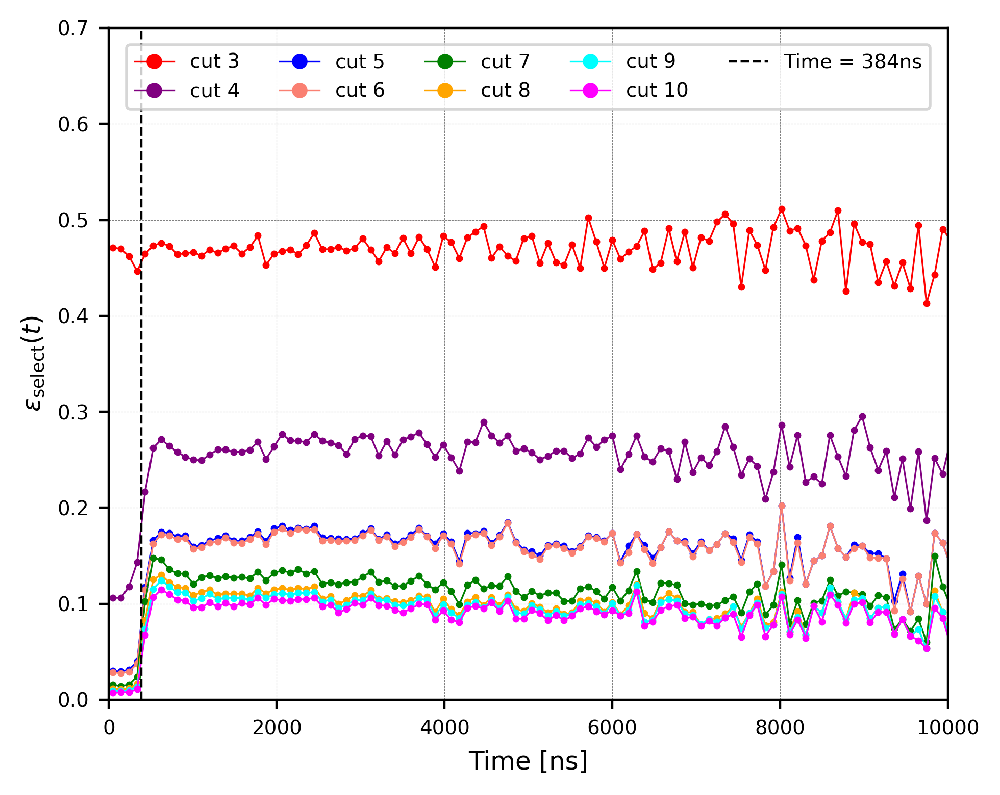

In [112]:


# ----------------------------- Binning --------------------------------
bin_width = 96
range_min, range_max = -96000, 96000

bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])
nb = len(centers)

# ----------------------------- Initial Histogram ----------------------
#I, _ = np.histogram(trueMichel_initial, bins=bins, range=(range_min, range_max)) # For combined sample
#I, _ = np.histogram(lifetime_e_initial, bins=bins, range=(range_min, range_max)) # For e^-
I, _ = np.histogram(lifetime_p_initial, bins=bins, range=(range_min, range_max)) # For e^+
I = I.astype(float)

mask = I > 0

# ----------------------------- Ratio Calculation ----------------------
# purify_dict = { # For combined sample
#     "purify9": trueT_total_purify9,
#     "purify8": trueT_total_purify8,
#     "purify7": trueT_total_purify7,
#     "purify6": trueT_total_purify6,
#     "purify5p": trueT_total_purify5p,
#     "purify5": trueT_total_purify5,
#     "purify4": trueT_total_purify4,
#     "purify3": trueT_total_purify3,
#     "purify2": trueT_total_purify2,
#     "purify1": trueT_total_purify1

# }

# purify_dict = { # For e^-
#     "purify9": trueT_total_purify9_e,
#     "purify8": trueT_total_purify8_e,
#     "purify7": trueT_total_purify7_e,
#     "purify6": trueT_total_purify6_e,
#     "purify5p": trueT_total_purify5p_e,
#     "purify5": trueT_total_purify5_e,
#     "purify4": trueT_total_purify4_e,
#     "purify3": trueT_total_purify3_e,
#     "purify2": trueT_total_purify2_e,
#     "purify1": trueT_total_purify1_e

# }

purify_dict = { # For e^+
    "purify9": trueT_total_purify9_p,
    "purify8": trueT_total_purify8_p,
    "purify7": trueT_total_purify7_p,
    "purify6": trueT_total_purify6_p,
    "purify5p": trueT_total_purify5p_p,
    "purify5": trueT_total_purify5_p,
    "purify4": trueT_total_purify4_p,
    "purify3": trueT_total_purify3_p,
    "purify2": trueT_total_purify2_p,
    "purify1": trueT_total_purify1_p

}




ratio_dict = {}

for label, data in purify_dict.items():

    F, _ = np.histogram(
        data,
        bins=bins,
        range=(range_min, range_max)
    )

    F = np.minimum(F.astype(float), I)

    ratio = np.full(nb, np.nan)
    ratio[mask] = F[mask] / I[mask]

    ratio_dict[label] = ratio

# ----------------------------- Extract Ratios -------------------------
ratio9 = ratio_dict["purify9"]
ratio8 = ratio_dict["purify8"]
ratio7 = ratio_dict["purify7"]
ratio6 = ratio_dict["purify6"]
ratio5p = ratio_dict["purify5p"]
ratio5 = ratio_dict["purify5"]
ratio4 = ratio_dict["purify4"]
ratio3 = ratio_dict["purify3"]
ratio2 = ratio_dict["purify2"]
ratio1 = ratio_dict["purify1"]

# ----------------------------- Plot -----------------------------------
plt.figure(figsize=(5, 4), dpi=400)

#plt.plot(centers[mask], ratio1[mask], color='gold', linewidth=0.6, marker='o', markersize=1.5, label='cut 1')
#plt.plot(centers[mask], ratio2[mask], color='brown', linewidth=0.6, marker='o', markersize=1.5, label='cut 2')
plt.plot(centers[mask], ratio3[mask], color='red', linewidth=0.6, marker='o', markersize=1.5, label='cut 3')
plt.plot(centers[mask], ratio4[mask], color='purple', linewidth=0.6, marker='o', markersize=1.5, label='cut 4')
plt.plot(centers[mask], ratio5[mask], color='blue', linewidth=0.6, marker='o', markersize=1.5, label='cut 5')
plt.plot(centers[mask], ratio5p[mask], color='salmon', linewidth=0.6, marker='o', markersize=1.5, label='cut 6')
plt.plot(centers[mask], ratio6[mask], color='green', linewidth=0.6, marker='o', markersize=1.5, label='cut 7')
plt.plot(centers[mask], ratio7[mask], color='orange', linewidth=0.6, marker='o', markersize=1.5, label='cut 8')
plt.plot(centers[mask], ratio8[mask], color='cyan', linewidth=0.6, marker='o', markersize=1.5, label='cut 9')
plt.plot(centers[mask], ratio9[mask], color='magenta', linewidth=0.6, marker='o', markersize=1.5, label='cut 10')


#plt.axvline(1000, ls='--', c='k', lw=0.8, label='Time = 1000ns')
#plt.axvline(2600, ls='--', c='k', lw=0.8, label='Time = 2600ns')


# ----------------------------- Decorations ----------------------------

plt.axvline(384, ls='--', c='k', lw=0.8, label='Time = 384ns')
plt.xlim(0, 10000)
plt.ylim(0.0, 0.70)

plt.xlabel('Time [ns]', fontsize=9)
plt.ylabel(r"$\epsilon_{\mathrm{select}}(t)$", fontsize=9)
#plt.title("Michel Selection Efficiencies", fontsize=9)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 0.99), fontsize=10, markerscale=3, ncol=5, prop={'size': 7})


plt.tight_layout()
plt.show()



plt.show()

### Energy Efficiencies:

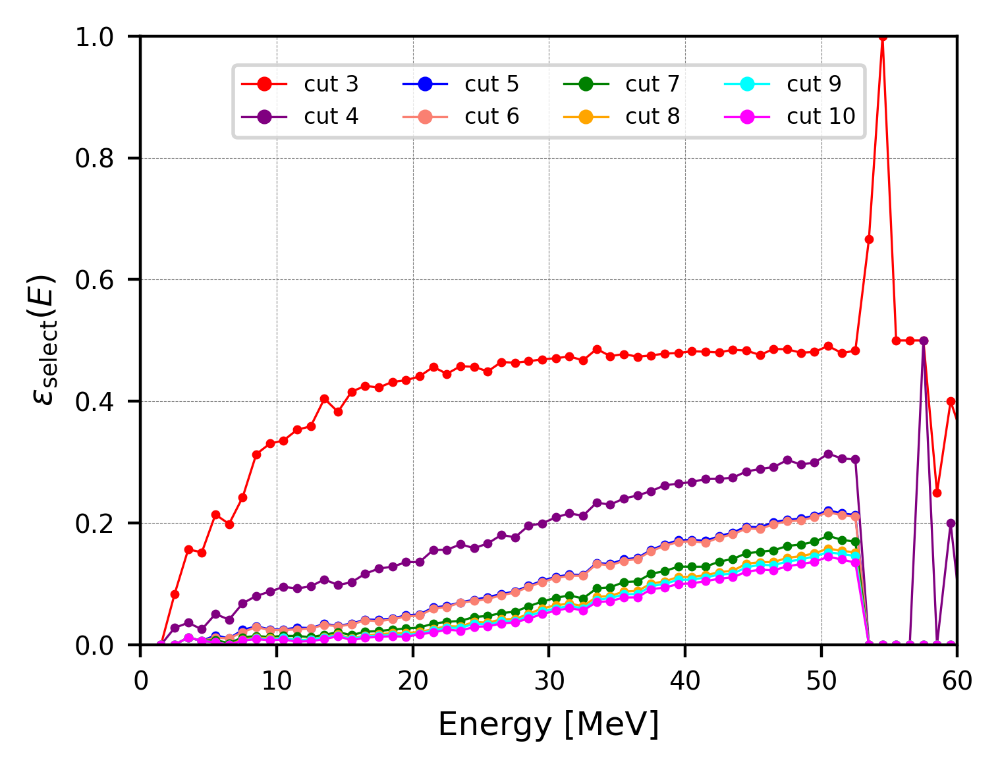

In [143]:
# ----------------------------- Binning --------------------------------
bin_width = 1.0
range_min = -20
range_max = 100

bins = np.arange(range_min, range_max + bin_width, bin_width)
bin_centers = 0.5 * (bins[:-1] + bins[1:])
nb = len(bin_centers)

# ----------------------------- Initial Histogram ----------------------
#I, _ = np.histogram(energy_total_initial, bins=bins, range=(range_min, range_max)) # For combined sample
#I, _ = np.histogram(energy_e_initial, bins=bins, range=(range_min, range_max)) # For e^-
I, _ = np.histogram(energy_p_initial, bins=bins, range=(range_min, range_max)) # For e^+
I = I.astype(float)

mask = I > 0

# ----------------------------- Ratio Calculation ----------------------
# purify_dict = { # For combined sample
#     "purify9": trueE_total_purify9,
#     "purify8": trueE_total_purify8,
#     "purify7": trueE_total_purify7,
#     "purify6": trueE_total_purify6,
#     "purify5p": trueE_total_purify5p,
#     "purify5": trueE_total_purify5,
#     "purify4": trueE_total_purify4,
#     "purify3": trueE_total_purify3,
#     "purify2": trueE_total_purify2,
#     "purify1": trueE_total_purify1,
# }

# purify_dict = { # For combined sample
#     "purify9": trueE_total_purify9_e,
#     "purify8": trueE_total_purify8_e,
#     "purify7": trueE_total_purify7_e,
#     "purify6": trueE_total_purify6_e,
#     "purify5p": trueE_total_purify5p_e,
#     "purify5": trueE_total_purify5_e,
#     "purify4": trueE_total_purify4_e,
#     "purify3": trueE_total_purify3_e,
#     "purify2": trueE_total_purify2_e,
#     "purify1": trueE_total_purify1_e,
# }

purify_dict = { # For combined sample
    "purify9": trueE_total_purify9_p,
    "purify8": trueE_total_purify8_p,
    "purify7": trueE_total_purify7_p,
    "purify6": trueE_total_purify6_p,
    "purify5p": trueE_total_purify5p_p,
    "purify5": trueE_total_purify5_p,
    "purify4": trueE_total_purify4_p,
    "purify3": trueE_total_purify3_p,
    "purify2": trueE_total_purify2_p,
    "purify1": trueE_total_purify1_p,
}


ratio_dict = {}

for label, data in purify_dict.items():

    F, _ = np.histogram(
        data,
        bins=bins,
        range=(range_min, range_max)
    )

    F = np.minimum(F.astype(float), I)

    ratio = np.full(nb, np.nan)
    ratio[mask] = F[mask] / I[mask]

    ratio_dict[label] = ratio

# ----------------------------- Extract Ratios -------------------------
ratio9 = ratio_dict["purify9"]
ratio8 = ratio_dict["purify8"]
ratio7 = ratio_dict["purify7"]
ratio6 = ratio_dict["purify6"]
ratio5p = ratio_dict["purify5p"]
ratio5 = ratio_dict["purify5"]
ratio4 = ratio_dict["purify4"]
ratio3 = ratio_dict["purify3"]
ratio2 = ratio_dict["purify2"]
ratio1 = ratio_dict["purify1"]

# ----------------------------- Plot -----------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# plt.plot(bin_centers[mask], ratio1[mask], color='gold', linewidth=0.6, marker='o', markersize=1.5, label='cut 1')
# plt.plot(bin_centers[mask], ratio2[mask], color='brown', linewidth=0.6, marker='o', markersize=1.5, label='cut 2')
plt.plot(bin_centers[mask], ratio3[mask], color='red', linewidth=0.6, marker='o', markersize=1.5, label='cut 3')
plt.plot(bin_centers[mask], ratio4[mask], color='purple', linewidth=0.6, marker='o', markersize=1.5, label='cut 4')
plt.plot(bin_centers[mask], ratio5[mask], color='blue', linewidth=0.6, marker='o', markersize=1.5, label='cut 5')
plt.plot(bin_centers[mask], ratio5p[mask], color='salmon', linewidth=0.6, marker='o', markersize=1.5, label='cut 6')
plt.plot(bin_centers[mask], ratio6[mask], color='green', linewidth=0.6, marker='o', markersize=1.5, label='cut 7')
plt.plot(bin_centers[mask], ratio7[mask], color='orange', linewidth=0.6, marker='o', markersize=1.5, label='cut 8')
plt.plot(bin_centers[mask], ratio8[mask], color='cyan', linewidth=0.6, marker='o', markersize=1.5, label='cut 9')
plt.plot(bin_centers[mask], ratio9[mask], color='magenta', linewidth=0.6, marker='o', markersize=1.5, label='cut 10')

# ----------------------------- Decorations ----------------------------
plt.xlim(0, 60)
plt.ylim(0.0, 1.0)

plt.xlabel('Energy [MeV]', fontsize=9)
plt.ylabel(r"$\epsilon_{\mathrm{select}}(E)$", fontsize=9)
#plt.title("Michel Selection Efficiencies", fontsize=9)

plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, 0.97),
    fontsize=9,
    markerscale=2,
    ncol=4,
    prop={'size': 6}
)

#plt.tight_layout()
plt.show()

<br />
<br />
<br />
<br />
<br />


### Apply Selection Efficiency to FINAL RECO 
### (check again the error propagation!)

Efficiency mode: fitted
Efficiency source: Fitted efficiency
Valid correction bins: 100
Efficiency range: 0.06396194739787542 to 0.11206156792105204
n_final total entries: 33532.0
Nonzero bins: 1540 / 4000000


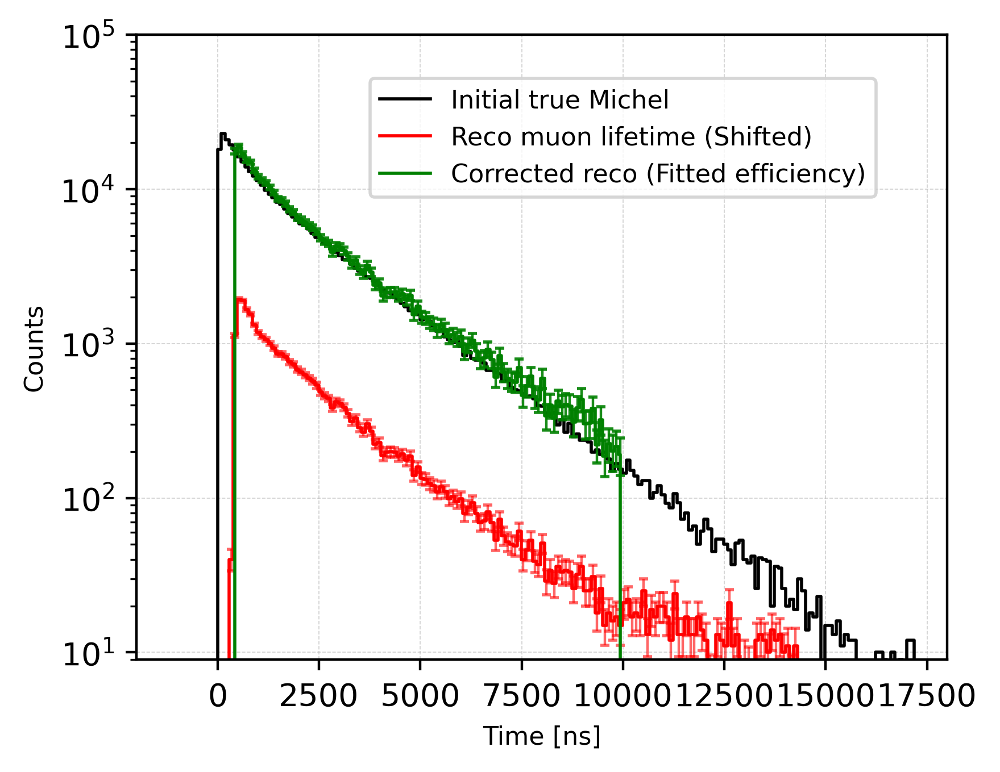

Efficiency-corrected reco histogram built for 100 bins.
Efficiency source: Fitted efficiency
Mean correction factor: 11.03×

Bin center | Corrected | Total error | Relative error | Data error | Efficiency error
--------------------------------------------------------------------------
       432   17619.851     727.818        4.131%     524.856          504.227
       528   18897.816     614.928        3.254%     429.607          439.971
       624   16874.652     545.453        3.232%     388.051          383.322
       720   15351.098     477.473        3.110%     376.891          293.143
       816   14881.730     450.840        3.029%     378.730          244.582
       912   13171.709     414.640        3.148%     362.539          201.224
      1008   12014.069     404.509        3.367%     350.040          202.731
      1104   11395.072     383.223        3.363%     342.641          171.629
      1200   10944.079     366.446        3.348%     335.986          146.273
      1296  

In [92]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1. Binning setup — reuse from efficiency calculation
# ============================================================
bins = bin_edges_eff.copy()
centers = bin_centers_eff.copy()
nb = len(centers)


# ============================================================
# 2. Select measured or fitted efficiency
# ============================================================

efficiency_mode = "fitted"    # choose "fitted" or "measured"================================================

correction_min = 384.0
correction_max = 10000.0
correction_range = (centers >= correction_min) & (centers <= correction_max)

if efficiency_mode == "measured":
    # Original bin-by-bin efficiency F/I
    eff_used = np.asarray(lifetime_efficiency, dtype=float).copy()
    eff_unc_used = np.asarray(lifetime_efficiency_unc, dtype=float).copy()

    # Original measured efficiencies are independent between bins
    Cov_eff_used = np.diag(
        np.nan_to_num(eff_unc_used, nan=0.0)**2
    )

    efficiency_label = "measured efficiency"

elif efficiency_mode == "fitted":
    # Evaluate the fitted B-spline only inside its fitted range
    fit_eval_mask = correction_range.copy()
    fit_indices = np.where(fit_eval_mask)[0]

    X_eff = np.asarray(
        build_design_matrices(
            [design_info],
            {"t": centers[fit_eval_mask]}
        )[0]
    )

    # Central fitted efficiencies
    eff_fit = result.predict(X_eff)

    # Coefficient covariance
    cov_beta = np.asarray(result.cov_params())

    # d epsilon / d beta for the inverse-logit model
    G_eff = eff_fit[:, None] * (1.0 - eff_fit[:, None]) * X_eff

    # Full correlated covariance of fitted efficiency values
    Cov_eff_fit = G_eff @ cov_beta @ G_eff.T
    eff_unc_fit = np.sqrt(np.clip(np.diag(Cov_eff_fit), 0, None))

    # Place the fitted values into arrays matching the full binning
    eff_used = np.full(nb, np.nan)
    eff_unc_used = np.full(nb, np.nan)
    Cov_eff_used = np.zeros((nb, nb))

    eff_used[fit_eval_mask] = eff_fit
    eff_unc_used[fit_eval_mask] = eff_unc_fit
    Cov_eff_used[np.ix_(fit_indices, fit_indices)] = Cov_eff_fit

    efficiency_label = "Fitted efficiency"

else:
    raise ValueError(
        "efficiency_mode must be either 'measured' or 'fitted'."
    )

# Only bins with a finite, positive efficiency can be corrected
valid_efficiency = (
    correction_range
    & np.isfinite(eff_used)
    & (eff_used > 0)
)

print("Efficiency mode:", efficiency_mode)
print("Efficiency source:", efficiency_label)
print("Valid correction bins:", np.count_nonzero(valid_efficiency))
print(
    "Efficiency range:",
    np.nanmin(eff_used[valid_efficiency]),
    "to",
    np.nanmax(eff_used[valid_efficiency])
)


# ============================================================
# 3. Build final true–reco 2D table from paired events
# ============================================================
true_idx = np.digitize(trueT_total_purify9, bins) - 1
reco_idx = np.digitize(recoT_total_purify9_shift40, bins) - 1

valid = (
    (true_idx >= 0) & (true_idx < nb) &
    (reco_idx >= 0) & (reco_idx < nb)
)
true_idx = true_idx[valid]
reco_idx = reco_idx[valid]

# 2D true–reco histogram after cuts
n_final = np.zeros((nb, nb), dtype=float)
np.add.at(n_final, (true_idx, reco_idx), 1.0)

print(f"n_final total entries: {np.sum(n_final)}")
print(f"Nonzero bins: {np.count_nonzero(n_final)} / {nb*nb}")


# ============================================================
# 4. Apply selected efficiency correction
# ============================================================

counts_reco = np.asarray(h_reco_subtracted, dtype=float).copy()

# Complete covariance from the subtraction cell
Cov_reco = np.asarray(Cov_reco_subtracted, dtype=float).copy()

sigma_reco = np.sqrt(np.clip(np.diag(Cov_reco), 0.0, None))

# Central corrected reconstructed spectrum
R_corr = np.full(nb, np.nan)

R_corr[valid_efficiency] = (
    counts_reco[valid_efficiency]
    / eff_used[valid_efficiency]
)

# ------------------------------------------------------------
# Reconstructed-count statistical covariance
# ------------------------------------------------------------

inverse_efficiency = np.zeros(nb, dtype=float)

inverse_efficiency[valid_efficiency] = (
    1.0 / eff_used[valid_efficiency]
)

Cov_corr_data = (
    inverse_efficiency[:, None]
    * Cov_reco
    * inverse_efficiency[None, :]
)

# ------------------------------------------------------------
# Efficiency contribution
#
# C_i = N_i / epsilon_i
# dC_i/depsilon_i = -N_i / epsilon_i^2
# ------------------------------------------------------------

eff_derivative_scale = np.zeros(nb)

eff_derivative_scale[valid_efficiency] = (
    counts_reco[valid_efficiency]
    / eff_used[valid_efficiency]**2
)

Cov_corr_eff = (
    eff_derivative_scale[:, None]
    * Cov_eff_used
    * eff_derivative_scale[None, :]
)

# Total corrected-spectrum covariance
Cov_effcorr_reco = Cov_corr_data + Cov_corr_eff
sigma_R_corr = np.sqrt(np.clip(np.diag(Cov_effcorr_reco), 0, None))

# Diagonal contributions for diagnostic printing
term_data = np.diag(Cov_corr_data)
term_eff = np.diag(Cov_corr_eff)


# ============================================================
# 5. Reference histograms (for visual comparison)
# ============================================================
counts_initial, _ = np.histogram(trueMichel_initial, bins=bins, range=(range_min, range_max))

# ============================================================
# 6. Plot
# ============================================================
plt.figure(figsize=(4.5, 3.5), dpi=400)

# (a) Initial true Michel
counts_initial_closed = np.append(counts_initial, 0.0)
plt.step(bins, counts_initial_closed, where='post', color='black', lw=1.0,
         label='Initial true Michel')


# (b) Reco μ lifetime (shifted)
# (b) Background-subtracted reco μ lifetime
counts_reco_closed = np.append(counts_reco, 0.0)
plt.step(bins, counts_reco_closed, where='post', color='red', 
         lw=1.0, label='Reco muon lifetime (Shifted)')
plt.errorbar(centers, counts_reco, yerr=sigma_reco, fmt='none', ecolor='red', 
             elinewidth=0.8, capsize=1.5, alpha=0.6)


# (c) Efficiency-corrected μ lifetime
mask = (
    valid_efficiency
    & np.isfinite(R_corr)
    & (R_corr > 0)
)
# Select only valid points
x_c = centers[mask]
y_c = R_corr[mask]

x_step = np.r_[x_c[0], x_c, x_c[-1]]
y_step = np.r_[0.0, y_c, 0.0]

plt.step(x_step, y_step, where="mid", color="green", lw=1.0,
         label=f"Corrected reco ({efficiency_label})")

plt.errorbar(x_c, y_c, yerr=sigma_R_corr[mask], fmt="none",
             ecolor="green", elinewidth=0.8, capsize=1.5, alpha=0.9)


# Axes and style
#plt.xlim(0, 2000)
plt.xlim(-2000, 18000)
#plt.ylim(0.9, 20000)
plt.ylim(9.0, 100000)
plt.yscale('log')

plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Counts', fontsize=8)

plt.grid(ls='--', lw=0.3, alpha=0.6)
plt.legend(loc='upper center', bbox_to_anchor=(0.6, 0.95), fontsize=8)
#plt.title('Michel Candidates Lifetime Distributions', fontsize=9)
plt.tight_layout()
plt.show()


# ============================================================
# 7. Save outputs for later fitting or ratio comparisons
# ============================================================
effcorr_reco_counts = R_corr.copy()
effcorr_reco_unc = sigma_R_corr.copy()
effcorr_reco_cov = Cov_effcorr_reco.copy()

efficiency_values_used = eff_used.copy()
efficiency_unc_used = eff_unc_used.copy()
efficiency_cov_used = Cov_eff_used.copy()
efficiency_mode_used = efficiency_mode

region_mask = valid_efficiency.copy()

print(
    f"Efficiency-corrected reco histogram built for "
    f"{np.count_nonzero(region_mask)} bins."
)

print(
    f"Efficiency source: {efficiency_label}"
)

print(
    f"Mean correction factor: "
    f"{np.nanmean(1.0 / eff_used[region_mask]):.2f}×"
)


# ============================================================
# 8. Print per-bin uncertainty decomposition
# ============================================================

print(
    "\nBin center | Corrected | Total error | Relative error | "
    "Data error | Efficiency error"
)
print(
    "--------------------------------------------------------------------------"
)

for i in range(nb):
    if not valid_efficiency[i]:
        continue

    if not np.isfinite(R_corr[i]) or R_corr[i] <= 0:
        continue

    total_error = sigma_R_corr[i]
    relative_error = total_error / R_corr[i]

    data_error = np.sqrt(max(term_data[i], 0.0))
    efficiency_error = np.sqrt(max(term_eff[i], 0.0))

    print(
        f"{centers[i]:10.0f} "
        f"{R_corr[i]:11.3f} "
        f"{total_error:11.3f} "
        f"{relative_error:13.3%} "
        f"{data_error:11.3f} "
        f"{efficiency_error:16.3f}"
    )





# ============================================================
# Print covariance matrix for the first 10 corrected bins
# ============================================================

valid_indices = np.where(
    valid_efficiency
    & np.isfinite(R_corr)
    & (R_corr > 0)
)[0]

first_ten_indices = valid_indices[:10]
first_ten_centers = centers[first_ten_indices]

Cov_first_ten = Cov_effcorr_reco[
    np.ix_(first_ten_indices, first_ten_indices)
]

print("\nTotal covariance matrix: first 10 corrected bins")
print("Rows and columns are bin centers in ns.\n")

# Column headers
print(
    f"{'Bin':>8}",
    "".join(
        f"{center:>13.0f}"
        for center in first_ten_centers
    )
)

# Matrix rows
for center, row in zip(first_ten_centers, Cov_first_ten):
    print(
        f"{center:8.0f}",
        "".join(
            f"{value:13.3f}"
            for value in row
        )
    )

Maximum difference between the two total-error calculations: 1.1368683772161603e-13


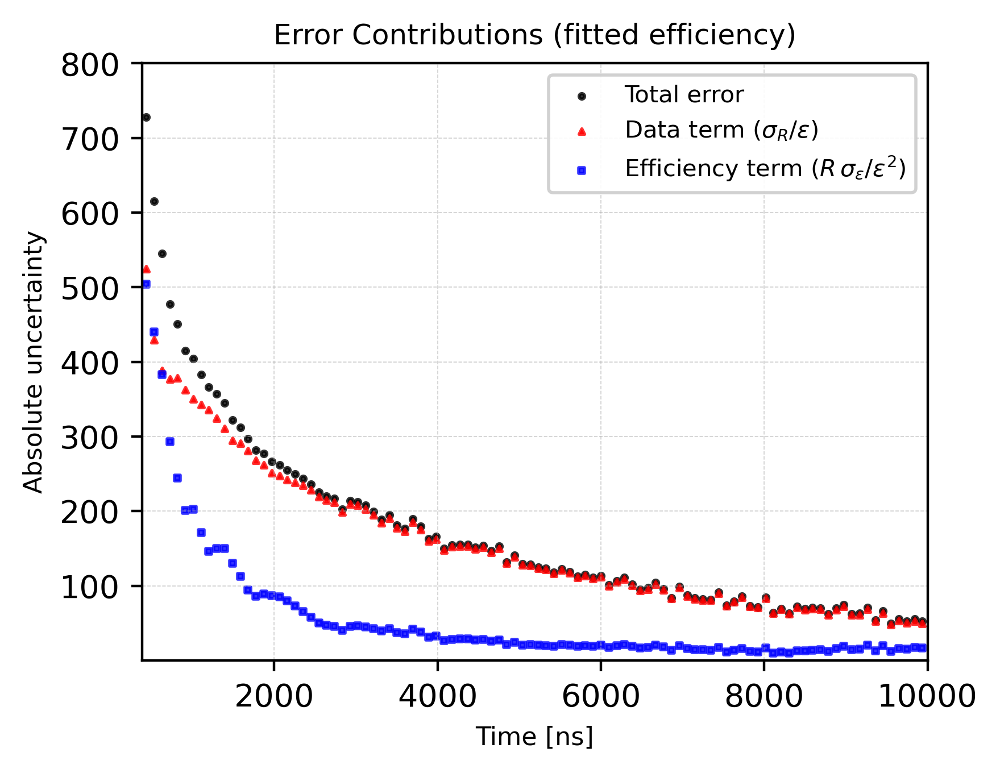

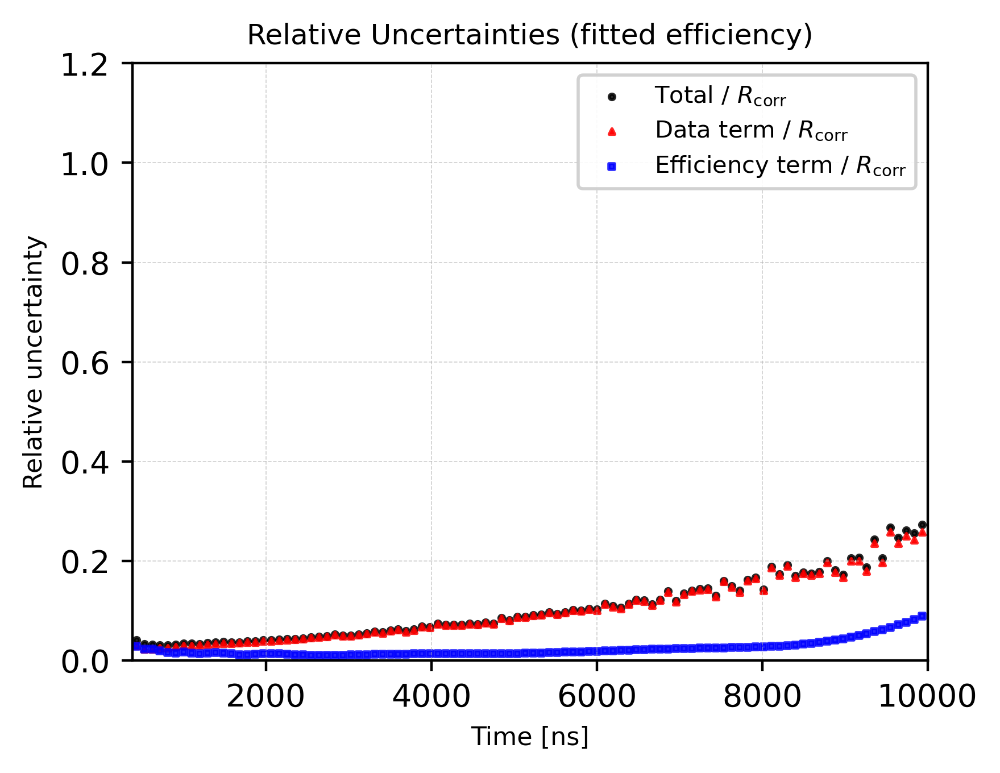

In [93]:
# ============================================================
# 8b. Save and plot absolute uncertainty contributions
# ============================================================

error_mask = (
    valid_efficiency
    & np.isfinite(R_corr)
    & (R_corr > 0)
    & np.isfinite(term_data)
    & np.isfinite(term_eff)
)

error_indices = np.where(error_mask)[0]

bin_center_arr = centers[error_mask]
R_corr_valid = R_corr[error_mask]

# Diagonal per-bin uncertainties
data_err_arr = np.sqrt(np.clip(term_data[error_mask], 0, None))
eff_err_arr = np.sqrt(np.clip(term_eff[error_mask], 0, None))
total_err_arr = np.sqrt(data_err_arr**2 + eff_err_arr**2)

# Equivalent check using the total covariance diagonal
total_err_cov = np.sqrt(
    np.clip(np.diag(Cov_effcorr_reco)[error_mask], 0, None)
)

print(
    "Maximum difference between the two total-error calculations:",
    np.max(np.abs(total_err_arr - total_err_cov))
)

# Extract covariance matrices for only the plotted bins
Cov_data_selected = Cov_corr_data[np.ix_(error_indices, error_indices)]
Cov_eff_selected = Cov_corr_eff[np.ix_(error_indices, error_indices)]
Cov_total_selected = Cov_effcorr_reco[np.ix_(error_indices, error_indices)]

# Save the uncertainty decomposition
# np.savez_compressed(
#     f"error_contributions_{efficiency_mode}.npz",
#     bin_center=bin_center_arr,
#     corrected_counts=R_corr_valid,
#     total_error=total_err_arr,
#     data_error=data_err_arr,
#     efficiency_error=eff_err_arr,
#     covariance_data=Cov_data_selected,
#     covariance_efficiency=Cov_eff_selected,
#     covariance_total=Cov_total_selected,
#     efficiency_mode=efficiency_mode
# )

# print(f"Saved: error_contributions_{efficiency_mode}.npz")

# ------------------------------------------------------------
# Plot absolute uncertainties
# ------------------------------------------------------------

plt.figure(figsize=(4.5, 3.5), dpi=400)

plt.scatter(bin_center_arr, total_err_arr, color="black", s=3,
            label="Total error", alpha=0.8)

plt.scatter(bin_center_arr, data_err_arr, color="red", marker="^", s=3,
            label=r"Data term $(\sigma_R/\epsilon)$", alpha=0.8)

plt.scatter(bin_center_arr, eff_err_arr, color="blue", marker="s", s=3,
            label=r"Efficiency term $(R\,\sigma_\epsilon/\epsilon^2)$",
            alpha=0.8)

plt.xlabel("Time [ns]", fontsize=8)
plt.ylabel("Absolute uncertainty", fontsize=8)
plt.xlim(correction_min, correction_max)
plt.ylim(1e-3, 800)
plt.grid(ls="--", lw=0.3, alpha=0.6)

plt.legend(fontsize=7.5, loc="upper right",
           frameon=True, framealpha=0.9)

plt.title(
    f"Error Contributions ({efficiency_mode} efficiency)",
    fontsize=9
)

plt.tight_layout()
plt.show()






# ============================================================
# 8c. Calculate and plot relative uncertainties
# ============================================================

rel_total_arr = np.divide(
    total_err_arr,
    R_corr_valid,
    out=np.full_like(total_err_arr, np.nan),
    where=R_corr_valid != 0
)

rel_data_arr = np.divide(
    data_err_arr,
    R_corr_valid,
    out=np.full_like(data_err_arr, np.nan),
    where=R_corr_valid != 0
)

rel_eff_arr = np.divide(
    eff_err_arr,
    R_corr_valid,
    out=np.full_like(eff_err_arr, np.nan),
    where=R_corr_valid != 0
)

# # Add relative uncertainties to a separate saved file
# np.savez_compressed(
#     f"relative_error_contributions_{efficiency_mode}.npz",
#     bin_center=bin_center_arr,
#     corrected_counts=R_corr_valid,
#     relative_total=rel_total_arr,
#     relative_data=rel_data_arr,
#     relative_efficiency=rel_eff_arr,
#     efficiency_mode=efficiency_mode
# )

# print(f"Saved: relative_error_contributions_{efficiency_mode}.npz")

# ------------------------------------------------------------
# Plot relative uncertainties
# ------------------------------------------------------------

plt.figure(figsize=(4.5, 3.5), dpi=400)

plt.scatter(bin_center_arr, rel_total_arr, color="black", s=3,
            label=r"Total / $R_{\mathrm{corr}}$", alpha=0.85)

plt.scatter(bin_center_arr, rel_data_arr, color="red", marker="^", s=3,
            label=r"Data term / $R_{\mathrm{corr}}$", alpha=0.85)

plt.scatter(bin_center_arr, rel_eff_arr, color="blue", marker="s", s=3,
            label=r"Efficiency term / $R_{\mathrm{corr}}$", alpha=0.85)

plt.xlabel("Time [ns]", fontsize=8)
plt.ylabel("Relative uncertainty", fontsize=8)
plt.xlim(correction_min, correction_max)
plt.ylim(0, 1.2)
plt.grid(ls="--", lw=0.3, alpha=0.6)

plt.legend(fontsize=7.5, loc="upper right",
           frameon=True, framealpha=0.9)

plt.title(
    f"Relative Uncertainties ({efficiency_mode} efficiency)",
    fontsize=9
)

plt.tight_layout()
plt.show()



### Diagnosis before fit:

In [94]:
# ============================================================
# Diagnosis before fit
# ============================================================

import numpy as np

diagnostic_fit_range = (384.0, 10000.0)

# Use exactly the same validity requirements as the fit
mask_fit = (
    valid_efficiency
    & (centers >= diagnostic_fit_range[0])
    & (centers <= diagnostic_fit_range[1])
    & np.isfinite(R_corr)
    & np.isfinite(sigma_R_corr)
    & (R_corr > 0)
    & (sigma_R_corr > 0)
)

fit_idx = np.flatnonzero(mask_fit)

if len(fit_idx) == 0:
    raise RuntimeError(
        "No valid bins were found in the diagnostic fit range."
    )


# ============================================================
# Relative uncertainty in selected fit bins
# ============================================================

relative_fit_unc = (
    sigma_R_corr[fit_idx]
    / R_corr[fit_idx]
)

print("Number of fitted bins:", len(fit_idx))
print(
    "Mean relative bin uncertainty:",
    np.mean(relative_fit_unc)
)
print(
    "Median relative bin uncertainty:",
    np.median(relative_fit_unc)
)
print(
    "Minimum relative bin uncertainty:",
    np.min(relative_fit_unc)
)
print(
    "Maximum relative bin uncertainty:",
    np.max(relative_fit_unc)
)


# ============================================================
# Select the same covariance submatrix used by the fit
# ============================================================

Cov_fit_diagnostic = Cov_effcorr_reco[
    np.ix_(fit_idx, fit_idx)
].copy()

# Remove insignificant numerical asymmetry
Cov_fit_diagnostic = 0.5 * (
    Cov_fit_diagnostic
    + Cov_fit_diagnostic.T
)

eigenvalues = np.linalg.eigvalsh(
    Cov_fit_diagnostic
)

minimum_eigenvalue = np.min(eigenvalues)
maximum_eigenvalue = np.max(eigenvalues)

print("Minimum covariance eigenvalue:", minimum_eigenvalue)
print("Maximum covariance eigenvalue:", maximum_eigenvalue)

if minimum_eigenvalue > 0:
    covariance_condition_number = (
        maximum_eigenvalue / minimum_eigenvalue
    )

    print(
        "Covariance condition number:",
        covariance_condition_number
    )
else:
    print(
        "Covariance condition number: undefined because "
        "the covariance is not positive definite."
    )

Number of fitted bins: 100
Mean relative bin uncertainty: 0.10474826107649272
Median relative bin uncertainty: 0.08960311011324096
Minimum relative bin uncertainty: 0.03029488897882653
Maximum relative bin uncertainty: 0.2729221429339064
Minimum covariance eigenvalue: 2339.8483228336286
Maximum covariance eigenvalue: 529718.5724765097
Covariance condition number: 226.39013277365098


#### Covariance condition number

The condition number of a positive-definite covariance matrix \(V\) is defined as

$$
\kappa(V)
=
\frac{\lambda_{\max}(V)}
     {\lambda_{\min}(V)},
$$

where \(\lambda_{\max}\) and \(\lambda_{\min}\) are its largest and smallest eigenvalues. It quantifies the numerical stability of operations involving \(V^{-1}\), such as the correlated chi-square

$$
\chi^2
=
(\mathbf{D}-\mathbf{F})^{\mathrm T}
V^{-1}
(\mathbf{D}-\mathbf{F}).
$$

A condition number close to unity indicates a well-conditioned covariance matrix. A very large value indicates that the matrix is nearly singular, so small numerical or modeling changes may be strongly amplified by the inversion. If \(\lambda_{\min}\leq0\), the covariance matrix is not positive definite.

Because \(\kappa(V)\) can also be increased by large differences between individual bin variances, the condition number of the corresponding correlation matrix may additionally be examined to isolate the effect of bin-to-bin correlations.

<br />
<br />
<br />
<br />
<br />

### Double exponential fitting (fixed tau2 ) (WITH Complete Error)

Efficiency mode: fitted
Efficiency source: Fitted efficiency
Covariance treatment: full correlated covariance
Number of lifetime-fit bins: 100


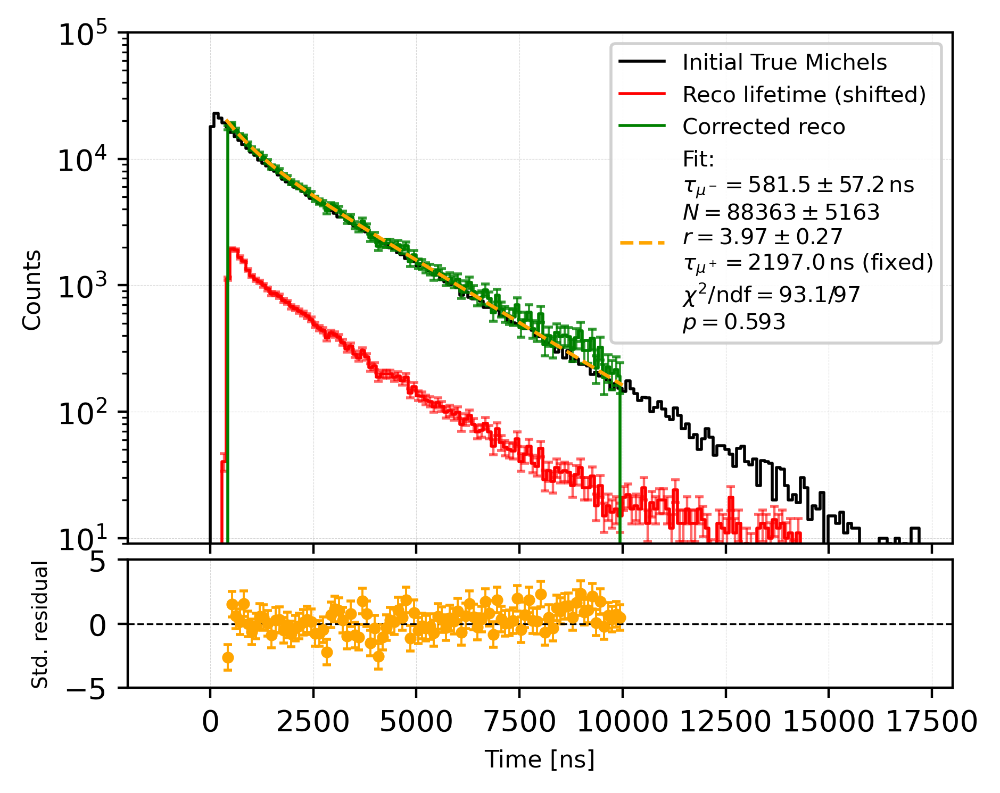


Lifetime-fit results:
  Efficiency mode = fitted
  Covariance mode = full
  N               = 88363.338 ± 5162.806
  tau_mu- = 581.525 ± 57.236 ns
  r       = 3.972 ± 0.273
  tau_mu+ = 2197.0 ns (fixed)
  chi2/ndf        = 93.09/97 = 0.960
  p-value         = 0.5934


In [95]:
# ============================================================
# 9. Perform double-exponential lifetime fit
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

from scipy.optimize import curve_fit
from scipy.stats import chi2 as chi2_distribution

#"full" for fitted; "diagonal" for measured------
fit_covariance_mode = "full"       # choose "full" or "diagonal"



# ============================================================
# 9a. Integrated double-exponential model
# ============================================================

def exp2_integrated(bin_limits, N, tau1, r, tau2=2197.0):
    a, b = bin_limits
    term1 = np.exp(-a / tau1) - np.exp(-b / tau1)
    term2 = np.exp(-a / tau2) - np.exp(-b / tau2)
    return N * (term1 + r * term2)


# ============================================================
# 9b. Prepare data
# ============================================================

bin_edges = bins.copy()
bin_centers = centers.copy()

y = R_corr.copy()
yerr = sigma_R_corr.copy()

counts_initial_plot = counts_initial.copy()
counts_reco_plot = counts_reco.copy()
sigma_reco_plot = sigma_reco.copy()

bin_width = bin_edges[1] - bin_edges[0]
tau2 = 2197.0
fit_range = (384.0, 10000.0)

mask_green = valid_efficiency & np.isfinite(y) & (y > 0)

mask_fit = (
    valid_efficiency
    & (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1])
    & np.isfinite(y) & np.isfinite(yerr) & (y > 0) & (yerr > 0)
)

if not np.any(mask_fit):
    print("No valid bins in the lifetime-fit region.")

else:
    fit_idx = np.where(mask_fit)[0]

    centers_fit = bin_centers[fit_idx]
    y_fit = y[fit_idx]

    a_fit = bin_edges[:-1][fit_idx]
    b_fit = bin_edges[1:][fit_idx]
    bin_limits_fit = np.vstack([a_fit, b_fit])

    # Full covariance for selected lifetime-fit bins
    Cov_fit = Cov_effcorr_reco[np.ix_(fit_idx, fit_idx)].copy()
    Cov_fit = 0.5 * (Cov_fit + Cov_fit.T)

    # Add very small regularization only if the matrix is not positive definite
    max_variance = np.max(np.diag(Cov_fit))
    min_eigenvalue = np.min(np.linalg.eigvalsh(Cov_fit))

    if min_eigenvalue <= 0:
        covariance_jitter = -min_eigenvalue + 1e-12 * max_variance
        Cov_fit += np.eye(len(y_fit)) * covariance_jitter
        print("Added covariance regularization:", covariance_jitter)

    sigma_fit_diagonal = np.sqrt(np.clip(np.diag(Cov_fit), 1e-20, None))

    if fit_covariance_mode == "full":
        sigma_for_fit = Cov_fit
        covariance_label = "full correlated covariance"

    elif fit_covariance_mode == "diagonal":
        sigma_for_fit = sigma_fit_diagonal
        covariance_label = "diagonal covariance"

    else:
        raise ValueError("fit_covariance_mode must be 'full' or 'diagonal'.")

    print("Efficiency mode:", efficiency_mode)
    print("Efficiency source:", efficiency_label)
    print("Covariance treatment:", covariance_label)
    print("Number of lifetime-fit bins:", len(y_fit))


    # ============================================================
    # 9c. Perform lifetime fit
    # ============================================================

    N0 = np.sum(y_fit)
    tau1_0 = 1000.0
    r_0 = 4.7

    fit_function = lambda limits, N, tau1, r: exp2_integrated(limits, N, tau1, r, tau2)

    popt, pcov = curve_fit(
        fit_function, bin_limits_fit, y_fit, p0=[N0, tau1_0, r_0],
        sigma=sigma_for_fit, absolute_sigma=True,
        bounds=([0.0, 1e-6, 0.0], [np.inf, np.inf, 20.0]), maxfev=100000
    )

    N_fit, tau1_fit, r_fit = popt
    N_err, tau1_err, r_err = np.sqrt(np.diag(pcov))

    y_model_fitbins = exp2_integrated(bin_limits_fit, N_fit, tau1_fit, r_fit, tau2)
    residuals = y_fit - y_model_fitbins

    if fit_covariance_mode == "full":
        chi2 = residuals @ np.linalg.solve(Cov_fit, residuals)
    else:
        chi2 = np.sum((residuals / sigma_fit_diagonal)**2)

    ndf = len(y_fit) - len(popt)
    chi2_ndf = chi2 / ndf
    fit_pvalue = chi2_distribution.sf(chi2, ndf)

    # These residuals are standardized but remain correlated in full-covariance mode
    standardized_residuals = residuals / sigma_fit_diagonal


    # ============================================================
    # 9d. Plot main distribution and residuals
    # ============================================================

    fig, (ax, ax_resid) = plt.subplots(
        2, 1, figsize=(5, 4), dpi=400, sharex=True,
        gridspec_kw={"height_ratios": [4, 1], "hspace": 0.05}
    )

    # Initial true distribution
    ax.step(bin_edges, np.append(counts_initial_plot, 0.0), where="post",
            color="black", lw=1.0, label="Initial True Michels")

    # Background-subtracted reconstructed distribution
    ax.step(bin_edges, np.append(counts_reco_plot, 0.0), where="post",
            color="red", lw=1.0, label="Reco lifetime (shifted)")

    ax.errorbar(bin_centers, counts_reco_plot, yerr=sigma_reco_plot, fmt="none",
                ecolor="red", elinewidth=0.8, capsize=1.5, alpha=0.6)

    # Efficiency-corrected reconstructed distribution
    x_green = bin_centers[mask_green]
    y_green = y[mask_green]
    y_green_error = yerr[mask_green]

    x_step = np.r_[x_green[0], x_green, x_green[-1]]
    y_step = np.r_[0.0, y_green, 0.0]

    ax.step(x_step, y_step, where="mid", color="green", lw=1.0,
            label=f"Corrected reco")

    ax.errorbar(x_green, y_green, yerr=y_green_error, fmt="none",
                ecolor="green", elinewidth=0.7, capsize=1.5, alpha=0.8)

    # Smooth fitted function
    x_smooth = np.linspace(fit_range[0], fit_range[1], 600)

    y_smooth = (
        (N_fit / tau1_fit) * np.exp(-x_smooth / tau1_fit) * bin_width
        + (N_fit * r_fit / tau2) * np.exp(-x_smooth / tau2) * bin_width
    )

    fit_legend = (
        "Fit:\n"
        + rf"$\tau_{{\mu^-}}={tau1_fit:.1f}\pm{tau1_err:.1f}\,\mathrm{{ns}}$" + "\n"
        + rf"$N={N_fit:.0f}\pm{N_err:.0f}$" + "\n"
        + rf"$r={r_fit:.2f}\pm{r_err:.2f}$" + "\n"
        + rf"$\tau_{{\mu^+}}={tau2:.1f}\,\mathrm{{ns}}$ (fixed)" + "\n"
        + rf"$\chi^2/\mathrm{{ndf}}={chi2:.1f}/{ndf}$" + "\n"
        + rf"$p={fit_pvalue:.3f}$"
    )

    ax.plot(x_smooth, y_smooth, color="orange", ls="--", lw=1.2, label=fit_legend)

    ax.set_yscale("log")
    ax.set_xlim(-2000, 18000)
    ax.set_ylim(9.0, 100000)
    ax.set_ylabel("Counts", fontsize=8)
    ax.grid(ls="--", lw=0.2, alpha=0.5)
    ax.tick_params(labelbottom=False)
    ax.legend(loc="upper right", fontsize=7.5, framealpha=0.9)


    # ============================================================
    # 9e. Standardized residual plot
    # ============================================================

    ax_resid.errorbar(centers_fit, standardized_residuals,
                      yerr=np.ones_like(standardized_residuals), fmt="o",
                      color="orange", markersize=3, elinewidth=0.7, capsize=1.5)

    ax_resid.axhline(0, color="black", lw=0.6, ls="--")
    ax_resid.set_xlabel("Time [ns]", fontsize=8)
    ax_resid.set_ylabel("Std. residual", fontsize=7)
    ax_resid.set_xlim(-2000, 18000)
    ax_resid.set_ylim(-5, 5)
    ax_resid.grid(ls="--", lw=0.2, alpha=0.5)

    plt.show()


    # ============================================================
    # 9f. Print and save fit results
    # ============================================================

    print("\nLifetime-fit results:")
    print(f"  Efficiency mode = {efficiency_mode}")
    print(f"  Covariance mode = {fit_covariance_mode}")
    print(f"  N               = {N_fit:.3f} ± {N_err:.3f}")
    print(f"  tau_mu- = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
    print(f"  r       = {r_fit:.3f} ± {r_err:.3f}")
    print(f"  tau_mu+ = {tau2:.1f} ns (fixed)")
    print(f"  chi2/ndf        = {chi2:.2f}/{ndf} = {chi2_ndf:.3f}")
    print(f"  p-value         = {fit_pvalue:.4f}")

    # output_name = f"lifetime_fit_{efficiency_mode}_{fit_covariance_mode}.npz"

    # np.savez_compressed(
    #     output_name,
    #     N=N_fit, N_error=N_err, tau1=tau1_fit, tau1_error=tau1_err,
    #     r=r_fit, r_error=r_err, tau2=tau2, chi2=chi2, ndf=ndf,
    #     p_value=fit_pvalue, fitted_bin_centers=centers_fit,
    #     fitted_counts=y_fit, fitted_model=y_model_fitbins,
    #     residuals=residuals, standardized_residuals=standardized_residuals,
    #     fit_covariance=Cov_fit, parameter_covariance=pcov,
    #     efficiency_mode=efficiency_mode, covariance_mode=fit_covariance_mode
    # )

    # print(f"Saved: {output_name}")

### Diagnosis after fit:

In [54]:
# ============================================================
# Parameter covariance and correlation matrices
# ============================================================

parameter_names = ["N", "tau1", "r"]

parameter_errors = np.sqrt(
    np.clip(np.diag(pcov), 0.0, None)
)

parameter_correlation = np.divide(
    pcov,
    np.outer(parameter_errors, parameter_errors),
    out=np.zeros_like(pcov),
    where=np.outer(parameter_errors, parameter_errors) > 0
)

print("\nParameter correlation matrix:\n")

# Column headers
print(
    f"{'Parameter':>12}",
    "".join(
        f"{name:>12}"
        for name in parameter_names
    )
)

# Matrix rows
for name, row in zip(parameter_names, parameter_correlation):
    print(
        f"{name:>12}",
        "".join(
            f"{value:12.4f}"
            for value in row
        )
    )


Parameter correlation matrix:

   Parameter            N        tau1           r
           N       1.0000      0.3415     -0.9840
        tau1       0.3415      1.0000     -0.4617
           r      -0.9840     -0.4617      1.0000


<br />
<br />
<br />
<br />
<br />
<br />
<br />
<br />
<br />

### New Fitting Approach (Binned ML + Minuit + Efficiency) [20260306]:

In [55]:
# # ============================================================
# # 1) Load efficiency file
# # ============================================================
# eff_data = np.load("michel_efficiency_ratios.npz")
# eff_centers_all = eff_data["bins"]     # actually bin centers
# eff_ratio_all   = eff_data["ratio"]    # efficiency values
# eff_error_all   = eff_data["error"]    # efficiency uncertainties


# # ============================================================
# # 2) Physics model: true expected counts in each bin
# # ============================================================
# def exp2_integrated(bin_edges, N, tau1, ratio, tau2=2197.0):
#     """
#     Expected TRUE bin counts for:
#         f(t) = N * [ exp(-t/tau1)/tau1 + ratio * exp(-t/tau2)/tau2 ]

#     Integrated over each bin [a,b]:
#         mu_true = N * [ (e^{-a/tau1} - e^{-b/tau1})
#                       + ratio * (e^{-a/tau2} - e^{-b/tau2}) ]
#     """
#     a = bin_edges[:-1]
#     b = bin_edges[1:]

#     term1 = np.exp(-a / tau1) - np.exp(-b / tau1)
#     term2 = np.exp(-a / tau2) - np.exp(-b / tau2)

#     return N * (term1 + ratio * term2)

# # ============================================================
# # 3) Observed model: apply efficiency bin-by-bin
# # ============================================================
# def exp2_integrated_with_eff(bin_edges, N, tau1, ratio, eff_values, tau2=2197.0):
#     mu_true = exp2_integrated(bin_edges, N, tau1, ratio, tau2=tau2)
#     mu_obs = eff_values * mu_true
#     return mu_obs





In [56]:
# from iminuit import Minuit

# def fit_and_draw_binnedML_minuit(ax, ax_resid, sample, label_prefix,
#                                  fit_range=(400, 10000),
#                                  hist_color="black", fit_color="red",
#                                  tau1_init=1000.0, ratio_init=4.0, tau2=2197.0,
#                                  eff_mode="nominal"):

#     # ============================================================
#     # Input is a SAMPLE of event times
#     # ============================================================
#     counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
#     counts = counts.astype(float)
#     centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

#     # Fit window
#     m = (centers >= fit_range[0]) & (centers <= fit_range[1])
#     idx = np.where(m)[0]
#     if len(idx) < 3:
#         ax.hist(sample, bins=bins, range=(range_min, range_max),
#                 histtype="step", linewidth=0.8, color=hist_color)
#         return None

#     y_full = counts[m]
#     centers_fit = centers[m]
#     edges_fit = bin_edges[idx[0] : idx[-1] + 2]

#     # ============================================================
#     # Efficiency on the SAME fit bins
#     # ============================================================
#     eff_nom = np.interp(centers_fit, eff_centers_all, eff_ratio_all, left=np.nan, right=np.nan)
#     eff_err = np.interp(centers_fit, eff_centers_all, eff_error_all, left=np.nan, right=np.nan)

#     if eff_mode == "nominal":
#         eff_fit = eff_nom
#     elif eff_mode == "up":
#         eff_fit = np.clip(eff_nom + eff_err, 0.0, 1.0)
#     elif eff_mode == "down":
#         eff_fit = np.clip(eff_nom - eff_err, 0.0, 1.0)
#     else:
#         raise ValueError("eff_mode must be 'nominal', 'up', or 'down'")

#     if len(eff_fit) != len(edges_fit) - 1:
#         raise ValueError(
#             f"Mismatch: len(eff_fit)={len(eff_fit)}, len(edges_fit)-1={len(edges_fit)-1}"
#         )

#     valid = np.isfinite(eff_fit) & (eff_fit > 0.0)
#     if np.count_nonzero(valid) < 3:
#         print(f"[{label_prefix}] Not enough valid bins after applying efficiency.")
#         ax.hist(sample, bins=bins, range=(range_min, range_max),
#                 histtype="step", linewidth=0.8, color=hist_color, label=f"{label_prefix} data")
#         return None

#     eps = 1e-12

#     def mu_model_full(N, tau1, ratio):
#         mu = exp2_integrated_with_eff(edges_fit, N, tau1, ratio, eff_fit, tau2=tau2)
#         return np.maximum(mu, eps)

#     def deviance(N, tau1, ratio):
#         mu_full = mu_model_full(N, tau1, ratio)
#         n = y_full[valid]
#         mu = mu_full[valid]

#         term = np.zeros_like(n, dtype=float)
#         nz = n > 0
#         term[nz] = n[nz] * np.log(n[nz] / mu[nz])
#         return 2.0 * np.sum(mu - n + term)

#     # Initial guess
#     shape0 = exp2_integrated_with_eff(edges_fit, 1.0, tau1_init, ratio_init, eff_fit, tau2=tau2)
#     sum_shape0 = np.sum(shape0[valid])

#     if sum_shape0 > 0:
#         N0 = float(np.sum(y_full[valid])) / sum_shape0
#     else:
#         N0 = 1.0

#     mnt = Minuit(deviance, N=N0, tau1=float(tau1_init), ratio=float(ratio_init))
#     mnt.limits["N"] = (0.0, None)
#     mnt.limits["tau1"] = (1e-6, None)
#     mnt.limits["ratio"] = (0.0, None)
#     mnt.errordef = 1.0

#     migrad_res = mnt.migrad()
#     if not migrad_res.valid:
#         print(f"[{label_prefix}] MINUIT MIGRAD failed or not valid.")
#         ax.hist(sample, bins=bins, range=(range_min, range_max),
#                 histtype="step", linewidth=0.8, color=hist_color, label=f"{label_prefix} data")
#         return None

#     mnt.hesse()

#     N_fit = float(mnt.values["N"])
#     tau1_fit = float(mnt.values["tau1"])
#     ratio_fit = float(mnt.values["ratio"])

#     N_err = float(mnt.errors["N"]) if mnt.errors["N"] is not None else np.nan
#     tau1_err = float(mnt.errors["tau1"]) if mnt.errors["tau1"] is not None else np.nan
#     ratio_err = float(mnt.errors["ratio"]) if mnt.errors["ratio"] is not None else np.nan

#     D_min = float(mnt.fval)
#     ndf = np.count_nonzero(valid) - 3

#     mu_fit_full = mu_model_full(N_fit, tau1_fit, ratio_fit)

#     # Residuals
#     n = y_full[valid]
#     mu = mu_fit_full[valid]
#     di = np.zeros_like(n, dtype=float)
#     nz = n > 0
#     di[nz] = 2.0 * (mu[nz] - n[nz] + n[nz] * np.log(n[nz] / mu[nz]))
#     di[~nz] = 2.0 * mu[~nz]
#     pulls = np.sign(n - mu) * np.sqrt(np.maximum(di, 0.0))

#     # Draw data histogram
#     ax.hist(sample, bins=bins, range=(range_min, range_max),
#             histtype="step", linewidth=0.8, color=hist_color, label=f"{label_prefix} data")

#     # Draw fit curve only in fit window
#     ax.plot(
#         centers_fit,
#         mu_fit_full,
#         color=fit_color,
#         linestyle="--",
#         linewidth=1.2,
#         label=(rf"$N={N_fit:.1f}\pm{N_err:.1f}$" + "\n"
#                + rf"$\tau_1={tau1_fit:.1f}\pm{tau1_err:.1f}$ ns" + "\n"
#                + rf"$r={ratio_fit:.2f}\pm{ratio_err:.2f}$" + "\n"
#                + rf"$\tau_2={tau2}$ ns (fixed)" + "\n"
#                + rf"$\epsilon$: {eff_mode}" + "\n"
#                + rf"$D/\mathrm{{ndf}} = {D_min:.1f}/{ndf}$")
#     )

#     ax_resid.axhline(0, color="black", linewidth=0.6, linestyle="--")
#     ax_resid.errorbar(
#         centers_fit[valid], pulls, yerr=np.ones_like(pulls), fmt="o",
#         color=fit_color, markersize=3, elinewidth=0.7, capsize=1.5
#     )

#     print(f"\n[{label_prefix}] Fit range = ({fit_range[0]}, {fit_range[1]}) ns")
#     print(f"  Efficiency mode: {eff_mode}")
#     print(f"  N  = {N_fit:.3f} ± {N_err:.3f}")
#     print(f"  τ₁ = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
#     print(f"  r  = {ratio_fit:.3f} ± {ratio_err:.3f}")
#     print(f"  D/ndf = {D_min:.1f}/{ndf}")

#     return N_fit, N_err, tau1_fit, tau1_err, ratio_fit, ratio_err, D_min, ndf

In [57]:
# # ============================================================
# # 4. Run the fit and draw
# # ============================================================
# bin_width = 96
# range_min, range_max = -96000, 96000
# bins = np.arange(range_min, range_max + bin_width, bin_width)

# # ------------------------------------------------------------
# # Nominal fit (this one is drawn)
# # ------------------------------------------------------------
# fig = plt.figure(figsize=(5, 4), dpi=400, constrained_layout=True)
# gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)
# ax = fig.add_subplot(gs[0])
# ax_resid = fig.add_subplot(gs[1], sharex=ax)

# out_nom = fit_and_draw_binnedML_minuit(
#     ax, ax_resid,
#     np.asarray(recoT_total_purify9_shift40),
#     "Combined",
#     fit_range=(384, 10000),   # Fitting range ================================================
#     hist_color="black",
#     fit_color="red",
#     tau1_init=1000.0,
#     ratio_init=5.0,
#     tau2=2197.0,
#     eff_mode="nominal"
# )

# # ============================================================
# # 5. Style and display
# # ============================================================
# ax.set_yscale("log")
# ax.set_ylim(0.9, 100000)
# ax.set_ylabel("#Counts", fontsize=8)
# ax.tick_params(labelbottom=False)
# ax.legend(fontsize=7)
# ax.grid(linestyle="--", linewidth=0.3, alpha=0.6)

# ax_resid.set_xlim(-2000, 18000)
# ax_resid.set_xlabel("Lifetime [ns]", fontsize=8)
# ax_resid.set_ylabel(r"$(\mathrm{data} - \mathrm{fit})/\sigma$", fontsize=8)
# ax_resid.grid(linestyle="--", linewidth=0.3, alpha=0.6)

# plt.show()

# # ------------------------------------------------------------
# # Efficiency up fit (no drawing needed, only extract result)
# # ------------------------------------------------------------
# fig_up = plt.figure(figsize=(5, 4), dpi=200)
# gs_up = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)
# ax_up = fig_up.add_subplot(gs_up[0])
# axr_up = fig_up.add_subplot(gs_up[1], sharex=ax_up)

# out_up = fit_and_draw_binnedML_minuit(
#     ax_up, axr_up,
#     np.asarray(recoT_total_purify9_shift40),
#     "Combined",
#     fit_range=(384, 10000),
#     hist_color="black",
#     fit_color="blue",
#     tau1_init=1000.0,
#     ratio_init=5.0,
#     tau2=2197.0,
#     eff_mode="up"
# )

# plt.close(fig_up)

# # ------------------------------------------------------------
# # Efficiency down fit (no drawing needed, only extract result)
# # ------------------------------------------------------------
# fig_down = plt.figure(figsize=(5, 4), dpi=200)
# gs_down = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)
# ax_down = fig_down.add_subplot(gs_down[0])
# axr_down = fig_down.add_subplot(gs_down[1], sharex=ax_down)

# out_down = fit_and_draw_binnedML_minuit(
#     ax_down, axr_down,
#     np.asarray(recoT_total_purify9_shift40),
#     "Combined",
#     fit_range=(384, 10000),
#     hist_color="black",
#     fit_color="green",
#     tau1_init=1000.0,
#     ratio_init=5.0,
#     tau2=2197.0,
#     eff_mode="down"
# )

# plt.close(fig_down)

# # ------------------------------------------------------------
# # Efficiency systematic uncertainty
# # ------------------------------------------------------------
# if (out_nom is not None) and (out_up is not None) and (out_down is not None):
#     N_nom, Nerr_nom, tau_nom, tauerr_nom, r_nom, rerr_nom, D_nom, ndf_nom = out_nom
#     N_up,  Nerr_up,  tau_up,  tauerr_up,  r_up,  rerr_up,  D_up,  ndf_up  = out_up
#     N_dn,  Nerr_dn,  tau_dn,  tauerr_dn,  r_dn,  rerr_dn,  D_dn,  ndf_dn  = out_down

#     N_syst = max(abs(N_up - N_nom), abs(N_dn - N_nom))
#     tau_syst = max(abs(tau_up - tau_nom), abs(tau_dn - tau_nom))
#     r_syst = max(abs(r_up - r_nom), abs(r_dn - r_nom))

#     print("\n============================================================")
#     print("Efficiency systematic uncertainty:")
#     print(f"  N   = {N_nom:.3f} ± {Nerr_nom:.3f} (stat) ± {N_syst:.3f} (eff)")
#     print(f"  τ₁  = {tau_nom:.3f} ± {tauerr_nom:.3f} ns (stat) ± {tau_syst:.3f} ns (eff)")
#     print(f"  r   = {r_nom:.3f} ± {rerr_nom:.3f} (stat) ± {r_syst:.3f} (eff)")
#     print(f"  D/ndf = {D_nom:.1f}/{ndf_nom}")
#     print("============================================================")
# else:
#     print("\n[WARN] Could not determine efficiency systematic uncertainty because one of the fits failed.")

In [58]:
#### To do: smooth efficiency curve???